<a href="https://colab.research.google.com/github/stratos-karas/hello-world/blob/master/Lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Ομάδα**

**ΟΜΑΔΑ Μ.Β.25**
* **Ονοματεπώνυμο**: Καραπαναγιώτης Ευστράτιος
* **Αριθμός Μητρώου**: 03115177

In [0]:
TEAM_SEED = 40

# **Προαπαιτούμενα**

## **Εγκαταστάσεις**

In [4]:
try:
  %tensorflow_version 2.x
except:
  pass

import tensorflow as tf

TensorFlow 2.x selected.


In [5]:
# Χρησιμοποιούμε την έκδοση Tensorflow 2.x
!sudo pip install --upgrade pip
!sudo pip install --upgrade tensorflow
!pip install -U keras-tuner

     |████████████████████████████████| 1.4MB 8.6MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1
Requirement already up-to-date: tensorflow in /usr/local/lib/python3.6/dist-packages (2.1.0)
     |████████████████████████████████| 54 kB 2.7 MB/s 
  Created wheel for keras-tuner: filename=keras_tuner-1.0.1-py3-none-any.whl size=73198 sha256=f9bddc20566829f37504deb930fa26154d85fe2ac69dda968193cd20fd579e0d
  Stored in directory: /root/.cache/pip/wheels/33/f0/c8/218919df808b66696bdb2fbc2261ae74412383483226b0b31d
  Created wheel for terminaltables: filename=terminaltables-3.1.0-py3-none-any.whl size=15354 sha256=324600b0fbae1f835d9b8b7dc9296b17aa1f11ba3dffc495fed9dab0929afe46
  Stored in directory: /root/.cache/pip/wheels/86/1b/58/c23af2fe683acd8edc15d5a1268f0242be1ff2cf827fe34737
Successfully built keras-tuner terminaltables


In [0]:
from __future__ import absolute_import, division, print_function, unicode_literals # legacy compatibility

import tensorflow as tf
from tensorflow.keras import datasets, layers, models, activations, utils

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
from os import path

%load_ext tensorboard
from tensorboard.plugins.hparams import api as hp
import datetime

## **Ορισμένες Συναρτήσεις**

### **Συναρτήσεις από την εκπαιδευτική ομάδα του εργαστηρίου**

In [0]:
'''
Επιστροφή των στοιχείων της λίστας from_list με δείκτη που ανήκει
στη λίστα index_list
'''
def select_from_list(from_list, index_list):
  filtered_list= [from_list[i] for i in index_list]
  return(filtered_list)

'''
Επέστρεψε τη λίστα των δεικτών των στοιχείων που
ανήκουν στην target_list και εμφανίζονται στη
unfiltered_list λίστα
'''
def get_ds_index(unfiliterd_list, target_list):
  index = 0
  filtered_list=[]
  for i_ in unfiliterd_list:
    if i_[0] in target_list:
      filtered_list.append(index)
    index += 1
  return(filtered_list)

In [0]:
'''
Συνάρτηση που επιστρέφει συγκεκριμένο πλήθος κλάσεων
από το dataset CIFAR100
Επιλογές είναι 20, 40, 60, 80 κλάσεις
'''
def select_classes_number(classes_number = 20):
  cifar100_20_classes_url = "https://pastebin.com/raw/nzE1n98V"
  cifar100_40_classes_url = "https://pastebin.com/raw/zGX4mCNP"
  cifar100_60_classes_url = "https://pastebin.com/raw/nsDTd3Qn"
  cifar100_80_classes_url = "https://pastebin.com/raw/SNbXz700"
  if classes_number == 20:
    return cifar100_20_classes_url
  elif classes_number == 40:
    return cifar100_40_classes_url
  elif classes_number == 60:
    return cifar100_60_classes_url
  elif classes_number == 80:
    return cifar100_80_classes_url
  else:
    return -1

In [0]:
# Μέλος της κλάσης experimental του Tensorflow
# με μη προς τα πίσω συμβατότητα. Default τιμή -1.
AUTOTUNE = tf.data.experimental.AUTOTUNE

def _input_fn(x,y, BATCH_SIZE, data_size):
  ds = tf.data.Dataset.from_tensor_slices((x,y)) # Δημιουργούμε το dataset μέσω της τούπλας λιστών (x,y) κόβοντας τες σε slices
  
  ds = ds.shuffle(buffer_size=data_size)         # Ανακατεύουμε όλο το dataset
  
  ds = ds.repeat()                               # Επαναλαμβάνεται άπειρα το dataset
  
  ds = ds.batch(BATCH_SIZE)                      # Ορίζουμε το πακέτο δεδομένω που θα παρέχει το dataset ως είσοδο στο νευρωνικό δίκτυο
  
  ds = ds.prefetch(buffer_size=AUTOTUNE)         # Χρησιμοποιούμε το prefetch προκειμένου να προφορτώνουμε δεδομένα για εκπαίδευση
                                                 # στο νευρωνικό ενώ αυτό εκπαιδεύεται παράληλα με τα προηγούμνα δεδομένα
                                                 # ορίζουμε ως buffersize το AUTOTUNE ώστε αυτόματα στο runtime να επιλέξει το
                                                 # σύστημα το κατάλληλο μέγεθος. Συνηθίζεται πάντως για καλά αποτελέσματα
                                                 # buffer_size >= BATCH_SIZE 
  return ds

In [0]:
'''''''''''''''''''''''
******** TRAIN ********
'''''''''''''''''''''''
# Χρησιμοποιούμε ως ανάκληση κατα την εκπαίδευση το ModelCheckpoint
# με τη βοήθεια του οποίου αποθηκεύουμε και ανακτούμε τα βάρη που επιστρέφουν
# τη μέγιστη τιμή για τη val_accuracy μετρική
chkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='best_weights.hdf5',
                                              monitor='val_accuracy',
                                              verbose=1,
                                              save_weights_only=True,
                                              mode='max')

# , tf.keras.callbacks.TensorBoard(logdir), hp.KerasCallback(logdir, hparams)

def train_model(model, train_ds, validation_ds, epochs = 10, steps_per_epoch = 2, validation_steps = 1):
  history = model.fit(train_ds, epochs=epochs, steps_per_epoch=steps_per_epoch, 
                      validation_data=validation_ds, validation_steps=validation_steps, 
                      callbacks=[chkpoint])
  return(history)

In [0]:
# print test set evaluation metrics
def model_evaluation(model, test_ds, evaluation_steps):
  print('\nTest set evaluation metrics')
  loss0,accuracy0 = model.evaluate(test_ds, steps = evaluation_steps)
  print("loss: {:.2f}".format(loss0))
  print("accuracy: {:.2f}".format(accuracy0))
  
  return loss0, accuracy0

In [0]:
# plot diagnostic learning curves
def summarize_diagnostics(history):
	plt.figure(figsize=(8, 8))
	plt.suptitle('Training Curves')
 
	# plot loss
	plt.subplot(211)
	plt.title('Cross Entropy Loss')
	plt.plot(history.history['loss'], color='blue', label='train')
	plt.plot(history.history['val_loss'], color='orange', label='val')
	plt.legend(loc='upper right')
	
	# plot accuracy
	plt.subplot(212)
	plt.title('Classification Accuracy')
	plt.plot(history.history['accuracy'], color='blue', label='train')
	plt.plot(history.history['val_accuracy'], color='orange', label='val')
	plt.legend(loc='lower right')
	return plt

In [0]:
def model_report(model, history, test_ds, evaluation_steps = 10):
	plt = summarize_diagnostics(history)
	plt.show()
	return model_evaluation(model, test_ds, evaluation_steps)

### **Συναρτήσεις ορισμένες από την ομάδα**

In [0]:
'''
Η παρακάτω συνάρτηση χρησιμοποιείται προκειμένου να μπορεί
το Συνελικτικό Δίκτυο να εκπαιδευτεί στο πλήθος κλάσεων που
θέλουμε τη κάθε στιγμή (20, 40, 60, 80) και να μην περιοριζόμαστε
στους 100 κόμβους εξόδου (που οδηγεί και σε κατανάλωση υπολογιστικών
και αποθηκευτικών πόρων)
'''
def shift_classes(arr):
  # Οι μοναιδκές τιμές(κλάσεις) στις οποίες
  # θα εκπαιδεύσουμε το δίκτυο
  # Θα πρέπει να είναι ίσες σε πλήθος 
  # με τον αριθμό number_of_classes
  unique_values = np.unique(arr)

  i = 0
  for elem in unique_values:
    for j in range(arr.shape[0]):
      if arr[j, 0] == elem:
        arr[j, 0] = i
    i += 1

  return unique_values

In [0]:
'''
Συνάρτηση που δημιουργεί τις κατηγορίες προς εκπαίδευση/έλεγχο
Επιστρέφει σε μορφή πίνακα όλα τα στοιχεία που ανήκουν στο συνολικό
dataset και φέρνουν δείκτη που ανήκει στη λίστα 
'''
def set_classes(number_of_classes, x_train_all, y_train_all):

  # Επιλέγουμε το πλήθος και το dataset των κλάσεων
  cifar100_classes_url = select_classes_number(number_of_classes)
  
  # Παίρνουμε τα ονόματα αυτών των κλάσεων
  team_classes = pd.read_csv(cifar100_classes_url, sep=',', header=None)
  CIFAR100_LABELS_LIST = pd.read_csv('https://pastebin.com/raw/qgDaNggt', sep=',', header=None).astype(str).values.tolist()[0]

  our_index = team_classes.iloc[TEAM_SEED,:].values.tolist()
  our_classes = select_from_list(CIFAR100_LABELS_LIST, our_index)
  train_index = get_ds_index(y_train_all, our_index)
  test_index = get_ds_index(y_test_all, our_index)

  x_train_ds = np.asarray(select_from_list(x_train_all, train_index))
  y_train_ds = np.asarray(select_from_list(y_train_all, train_index))
  x_test_ds = np.asarray(select_from_list(x_test_all, test_index))
  y_test_ds = np.asarray(select_from_list(y_test_all, test_index))

  return x_train_ds, y_train_ds, x_test_ds, y_test_ds

In [0]:
def set_batch(batch_size=128, shift=False, val_perc=0.15, 
              x_train_ds=None, y_train_ds=None, x_test_ds=None, y_test_ds=None):
  
  if shift:
    classes = shift_classes(y_train_ds)
    _ = shift_classes(y_test_ds)
  
  # Παίρνουμε τις διαστάσεις από το σχήμα του train dataset
  data_size, img_rows, img_cols, img_channels = x_train_ds.shape

  # Ορίζουμε το ποσοστό του train dataset που θα χρησιμοποιηθεί 
  # για έλεγχο
  validation_percentage = val_perc
  val_size = round(validation_percentage * data_size)

  # Διαχωρισμός του tarin dataset σε train και validation sets
  # και κανονικοποίηση των τιμών των πινάκων (/255 αφού RGB)
  x_val = x_train_ds[-val_size:]/255
  y_val = y_train_ds[-val_size:]
  x_train = x_train_ds[:-val_size]/255
  y_train = y_train_ds[:-val_size]
  x_test = x_test_ds/255
  y_test = y_test_ds

  train_ds =_input_fn(x_train, y_train, batch_size, data_size)
  validation_ds =_input_fn(x_val, y_val, batch_size, data_size)
  test_ds =_input_fn(x_test, y_test, batch_size, data_size)

  if shift:
    return train_ds, validation_ds, test_ds, classes
  
  return train_ds, validation_ds, test_ds

# **Εισαγωγή**

## **Δεδομένα Εισόδου**

**CIFAR-100**
---


---


Το dataset πάνω στο οποίο θα κατασκευάσουμεε το νευρωνικό μας δίκτυο είναι το CIFAR-100.  Αποτελείται από 60.000 εικόνες ανάλυσης 32×32, οι οποίες κατηγοριοποιούνται σε 100 ομάδες. Αυτές οι 100 ομάδες κατηγοριοποιούνται με τη σειρά τουςσε άλλες 20 ομάδες. Οι 100 κατηγορίες αναφέρονται στο set ως fine ενώ οι 20 υπερκατηγορίες ως coarse. Εμείς θα χρησιμοποιήσουμε τις fine κατηγορίες.

Για την εκπαίδευση και την εξαγωγή συμπερασμάτων όμως δεν ασχολούμαστε αποκλειστικά με την κατηγοριοποίηση σε 100 ομάδες αλλά με την κατηγοριοποίηση σε 20, 40, 60 και 80 κατηγορίεςαντίστοιχα.

In [17]:
# Εισαγωγή ολόκληρου του dataset
(x_train_all, y_train_all), (x_test_all, y_test_all) = tf.keras.datasets.cifar100.load_data(label_mode='fine')

169009152/169001437 [==============================] - 6s 0us/step


In [18]:
print("Σχήμα των δεδομένων εκπαίδευσης: ", x_train_all.shape)
print("Σχήμα των δεδομένων ελέγχου: ", x_test_all.shape)

Σχήμα των δεδομένων εκπαίδευσης:  (50000, 32, 32, 3)
Σχήμα των δεδομένων ελέγχου:  (10000, 32, 32, 3)


#**Εκτέλεση**

## **Απλό Μοντέλο**

In [0]:
# a simple CNN https://www.tensorflow.org/tutorials/images/cnn

def init_simple_model(summary):
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)))
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(layers.Conv2D(64, (3, 3), activation='relu'))
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(layers.Conv2D(64, (3, 3), activation='relu'))
  model.add(layers.Flatten())
  model.add(layers.Dense(64, activation='relu'))
  model.add(layers.Dense(100, activation='softmax'))
  model.compile(optimizer=tf.optimizers.Adam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
def automated_report(number_of_classes, x_train_all, y_train_all):
  
  x_train_ds, y_train_ds, x_test_ds, y_test_ds = set_classes(number_of_classes, 
                                                             x_train_all, y_train_all)
  
  # Αφού δεν ορίζουμε shift παίρνει ως default ότι δε θα γίνει
  # μετατόπιση των κλάσεων
  train_ds, val_ds, test_ds = set_batch(x_train_ds=x_train_ds,
                                        y_train_ds=y_train_ds,
                                        x_test_ds=x_test_ds,
                                        y_test_ds=y_test_ds)
  
  MODEL = init_simple_model(summary = False)
  MODEL_history = train_model(MODEL, train_ds, val_ds, 50, 30, 5)
  return model_report(MODEL, MODEL_history, test_ds, 30)

In [0]:
SIMPLE_MODEL = init_simple_model(summary = True)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                6

Train for 30 steps, validate for 5 steps
Epoch 1/50
29/30 [============================>.] - ETA: 0s - loss: 3.6412 - accuracy: 0.0612
Epoch 00001: val_accuracy did not improve from 0.57500
30/30 [==============================] - 5s 168ms/step - loss: 3.6182 - accuracy: 0.0625 - val_loss: 2.9217 - val_accuracy: 0.1000
Epoch 2/50
29/30 [============================>.] - ETA: 0s - loss: 2.7627 - accuracy: 0.1237
Epoch 00002: val_accuracy did not improve from 0.57500
30/30 [==============================] - 4s 148ms/step - loss: 2.7566 - accuracy: 0.1255 - val_loss: 2.5748 - val_accuracy: 0.1766
Epoch 3/50
29/30 [============================>.] - ETA: 0s - loss: 2.4830 - accuracy: 0.2096
Epoch 00003: val_accuracy did not improve from 0.57500
30/30 [==============================] - 4s 148ms/step - loss: 2.4832 - accuracy: 0.2089 - val_loss: 2.5107 - val_accuracy: 0.2172
Epoch 4/50
29/30 [============================>.] - ETA: 0s - loss: 2.4212 - accuracy: 0.2134
Epoch 00004: val_accuracy

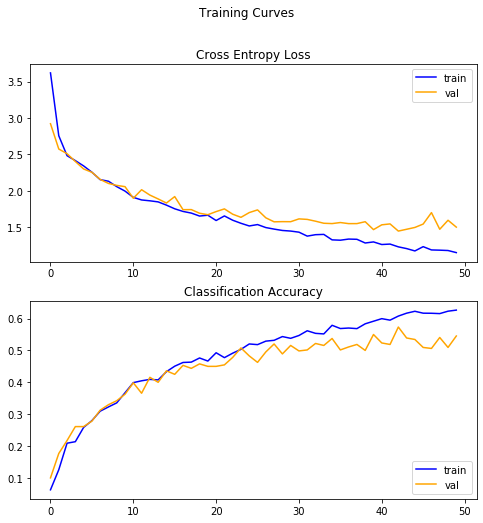


Test set evaluation metrics
30/30 [==============================] - 1s 48ms/step - loss: 1.5436 - accuracy: 0.5422
loss: 1.54
accuracy: 0.54


In [0]:
simple_loss_20, simple_acc_20 = automated_report(20, x_train_all, y_train_all)

Train for 30 steps, validate for 5 steps
Epoch 1/50
29/30 [============================>.] - ETA: 0s - loss: 4.1709 - accuracy: 0.0310
Epoch 00001: val_accuracy did not improve from 0.57500
30/30 [==============================] - 5s 181ms/step - loss: 4.1575 - accuracy: 0.0315 - val_loss: 3.8018 - val_accuracy: 0.0469
Epoch 2/50
29/30 [============================>.] - ETA: 0s - loss: 3.6054 - accuracy: 0.0692
Epoch 00002: val_accuracy did not improve from 0.57500
30/30 [==============================] - 5s 157ms/step - loss: 3.6028 - accuracy: 0.0690 - val_loss: 3.4080 - val_accuracy: 0.0750
Epoch 3/50
29/30 [============================>.] - ETA: 0s - loss: 3.3797 - accuracy: 0.0946
Epoch 00003: val_accuracy did not improve from 0.57500
30/30 [==============================] - 5s 155ms/step - loss: 3.3738 - accuracy: 0.0961 - val_loss: 3.3480 - val_accuracy: 0.1234
Epoch 4/50
29/30 [============================>.] - ETA: 0s - loss: 3.2644 - accuracy: 0.1223
Epoch 00004: val_accuracy

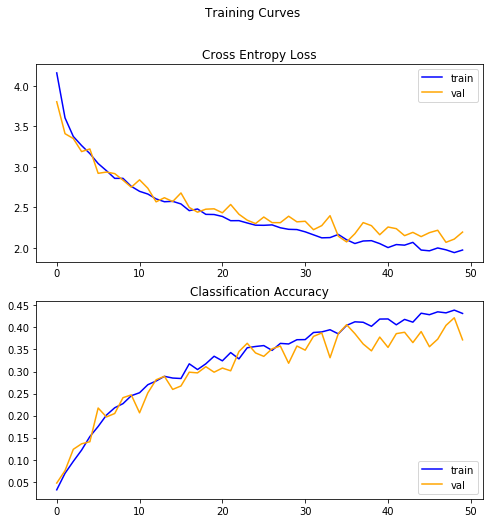


Test set evaluation metrics
30/30 [==============================] - 1s 49ms/step - loss: 2.1120 - accuracy: 0.3995
loss: 2.11
accuracy: 0.40


In [0]:
simple_loss_40, simple_acc_40 = automated_report(40, x_train_all, y_train_all)

Train for 30 steps, validate for 5 steps
Epoch 1/50
29/30 [============================>.] - ETA: 0s - loss: 4.4083 - accuracy: 0.0162
Epoch 00001: val_accuracy did not improve from 0.57500
30/30 [==============================] - 6s 188ms/step - loss: 4.4039 - accuracy: 0.0159 - val_loss: 4.1700 - val_accuracy: 0.0281
Epoch 2/50
29/30 [============================>.] - ETA: 0s - loss: 4.1347 - accuracy: 0.0288
Epoch 00002: val_accuracy did not improve from 0.57500
30/30 [==============================] - 5s 153ms/step - loss: 4.1340 - accuracy: 0.0286 - val_loss: 4.0620 - val_accuracy: 0.0391
Epoch 3/50
29/30 [============================>.] - ETA: 0s - loss: 4.0247 - accuracy: 0.0350
Epoch 00003: val_accuracy did not improve from 0.57500
30/30 [==============================] - 5s 151ms/step - loss: 4.0230 - accuracy: 0.0349 - val_loss: 3.9597 - val_accuracy: 0.0469
Epoch 4/50
29/30 [============================>.] - ETA: 0s - loss: 3.8837 - accuracy: 0.0649
Epoch 00004: val_accuracy

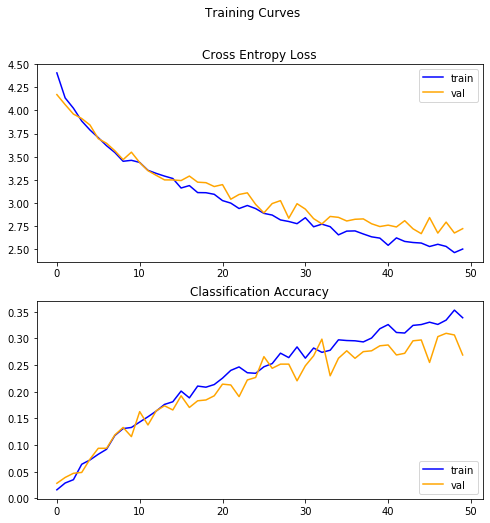


Test set evaluation metrics
30/30 [==============================] - 1s 49ms/step - loss: 2.5913 - accuracy: 0.3227
loss: 2.59
accuracy: 0.32


In [0]:
simple_loss_60, simple_acc_60 = automated_report(60, x_train_all, y_train_all)

Train for 30 steps, validate for 5 steps
Epoch 1/50
29/30 [============================>.] - ETA: 0s - loss: 4.5736 - accuracy: 0.0132
Epoch 00001: val_accuracy did not improve from 0.57500
30/30 [==============================] - 6s 204ms/step - loss: 4.5709 - accuracy: 0.0130 - val_loss: 4.5059 - val_accuracy: 0.0109
Epoch 2/50
29/30 [============================>.] - ETA: 0s - loss: 4.4171 - accuracy: 0.0167
Epoch 00002: val_accuracy did not improve from 0.57500
30/30 [==============================] - 5s 157ms/step - loss: 4.4132 - accuracy: 0.0174 - val_loss: 4.3089 - val_accuracy: 0.0141
Epoch 3/50
29/30 [============================>.] - ETA: 0s - loss: 4.2467 - accuracy: 0.0326
Epoch 00003: val_accuracy did not improve from 0.57500
30/30 [==============================] - 5s 157ms/step - loss: 4.2441 - accuracy: 0.0320 - val_loss: 4.1558 - val_accuracy: 0.0547
Epoch 4/50
29/30 [============================>.] - ETA: 0s - loss: 4.1001 - accuracy: 0.0509
Epoch 00004: val_accuracy

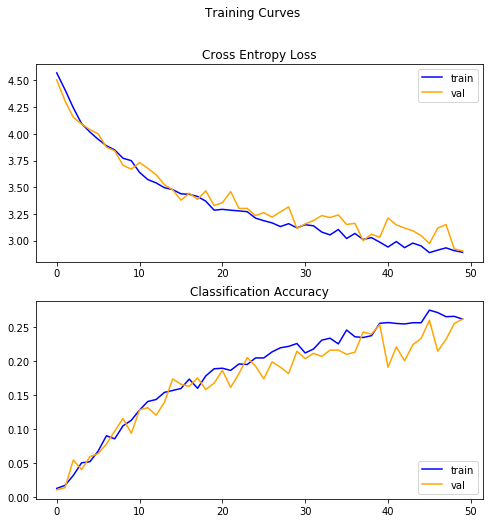


Test set evaluation metrics
30/30 [==============================] - 2s 51ms/step - loss: 2.9217 - accuracy: 0.2604
loss: 2.92
accuracy: 0.26


In [0]:
simple_loss_80, simple_acc_80 = automated_report(80, x_train_all, y_train_all)

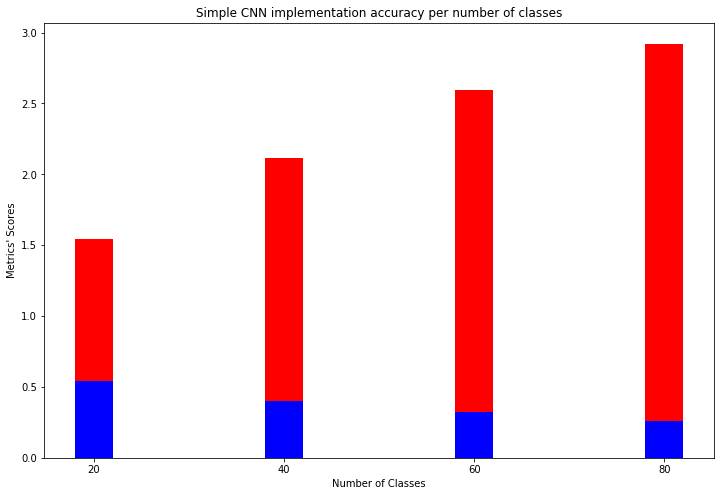

In [0]:
plt.figure(figsize=(12, 8))

plt.bar(20, simple_loss_20, width=4.0, color='red', label='loss')
plt.bar(20, simple_acc_20, width=4.0, color='blue', label='accu')

plt.bar(40, simple_loss_40, width=4.0, color='red', label='loss')
plt.bar(40, simple_acc_40, width=4.0, color='blue', label='accu')

plt.bar(60, simple_loss_60, width=4.0, color='red', label='loss')
plt.bar(60, simple_acc_60, width=4.0, color='blue', label='accu')

plt.bar(80, simple_loss_80, width=4.0, color='red', label='loss')
plt.bar(80, simple_acc_80, width=4.0, color='blue', label='accu')

plt.xlabel("Number of Classes")
plt.ylabel("Metrics' Scores")

plt.title("Simple CNN implementation accuracy per number of classes")

plt.xticks([20, 40, 60, 80])

plt.show()

## **Βελτιστοποιημένο Μοντέλο**

Η αρχιτεκτονική που χρησιμοποιήθηκε για να επιτευχθεί βέλτιστο αποτέλεσμα απαρτίζεται από πέντε στάδια συνέλιξης. Το κάθε στάδιο αποτελείται από
1. 2D Convolutional layer
2. Batch Normalization layer
3. Average Pooling layer
4. Dropout layer

Εξαίρεση αποτελεί το πρώτο στάδιο το οποίο επειδή λειτουργεί ως στάδιο εισόδου δεν έχει layer για batch normalization. Μια ακόμη διαφορά που υπάρχει στο πρώτο στάδιο είναι το επίπεδο (layer) upsampling το οποίο διπλασιάζει στην περίπτωσή μας την ανάλυση της εισόδου. Αυτή η κίνηση μας βοήθησε να αυξήσουμε το βάθος του νευρωνικού δικτύου με συνέπεια να πετύχουμε καλύτερες τιμές στην εκπαίδευση (training) και τον έλεγχο (validation). Τετραπλασιασμός της ανάλυσης σε αυτό το στάδιο ή προσθήκη περισσότερων upsambling layers σε άλλα επίπεδα δεν οδήγησε σε αύξηση των μετρικών επίδοσης του δικτύου ενώ σε κάποιες περιπτώσεις τις χειροτέρεψε.

Το σκεπτικό που ακολουθήθηκε είναι το εξής. Θέλουμε να αυξήσουμε περισσότερο την επίδοση του δικτύου. Για να το πετύχουμε αυτό χρειαζόμαστε περισσότερο βάθος. Όπως διαπιστώθηκε πειραματικά σε διάφορα papers το εύρος το δικτύου δηλαδή το πλήθος των νευρώνων σε κάθε επίπεδο θα πρέπει να έχει μια [εναρμονισμένη](https://arxiv.org/pdf/1905.11946v3.pdf) σχέση με το πόσο βαθειά στο δίκτυο βρίσκεται το επίπεδο αυτό. Αυτό εκφράζεται και με την τάση σε μικρότερα βάθη - στην αρχή το δικτύου - να έχουμε λιγότερων καναλιών συνελικτικά επίπεδα.

Η προσθήκη ενός επιπέδου batch normalization αποτελεί μια πρόσφατη τεχνική για επιτάχυνση και βελτιστοποίηση της απόδοσης των νευρωνικών δικτύων καθώς [μειώνει την ολίσθηση της συνδιακύμανσης](https://arxiv.org/pdf/1502.03167.pdf) μεταξύ των μονάδων στα κρυφά επίπεδα. Με το έξτρα αυτό επίπεδο κάθε κρυφή μονάδα ανεξαρτητοποιείται ως ένα βαθμό από τις υπόλοιπες και έτσι ανεξαρτητοποιείται  και το δίκτυο από τις διακυμάνσεις της κατανομής του σετ εκπαίδευσης και ελέγχου. 

Για την επιλογή της πολιτκής pooling έγιναν πειράματα όπου είτε όλα τα αντίστοιχα layers ακολουθήσαν την Max πολτική είτε συνδιασμό της Average και Max πολιτικής. Εν τέλει το καλύτερο πλάνο ήταν να ακολουθούν την πολιτική Average. Υποθέτουμε ότι επειδή η ανάλυση των εικόνων μας είναι χαμηλή και η Max πολιτική οδηγεί στην εύρεση έντονων ακμών σε αυτές, εξάγεται ελάχιστα σημαντική πληροφορία με αποτέλεσμα τις χαμηλές τιμές accuracy και ψηλές τιμές loss κατα την εκπαίδευση. Αντιθέτως, η Average πολιτική έχει επίγνωση των γειτονικών της εικονοστοιχείων (τοπική δράση) και εξομαλύνει την εικόνα, οπότε δε χάνεται πολύ πληροφορία κατά την μετάβαση στο επόμενο επίπεδο ακόμα και αν μειώνεται το μέγεθος του χάρτη χαρακτηριστικών.

Τα επίπεδα dropout χρησιμοποιούνται σε κάθε στάδιο για να μη γίνει [υπερεκπαίδευση](http://www.jmlr.org/papers/volume15/nandan14a/nandan14a.pdf) του δικτύου σε σγκεκριμένα χαρακτηριστικά που προκύπτουν από τις εικόνες. Πολύ καλές τιμές επιτεύχθηκαν με τιμή dropout ratio, 0.5.

Παρακάτω παρουσιάζουμε την αρχιτεκτονική του συνελικτικού νευρωνικού δικτύου μας έτσι όπως την εξήγαγε το tensorflow.

<img src="https://drive.google.com/uc?id=1Cdv16P7gfEQ-yMm3a-fqH290dKR_NgpU" alt="drawing" width="400"/>

### **Άπληστη μέθοδος βελτιστοποίησης**



In [0]:
def init_opt_model(summary, number_of_classes, optimizer):
  model = models.Sequential()

  model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)))
  model.add(layers.UpSampling2D(size=(2,2)))
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))

  model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Flatten())
  model.add(layers.Dense(6400 // number_of_classes , activation='relu'))
  model.add(layers.Dense(number_of_classes, activation='softmax'))

  model.compile(optimizer=optimizer, loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])

  if summary:
    model.summary()

  return model

In [0]:
def opt_train_report(number_of_classes, batch_size, optimizer, x_train_all, y_train_all, num_epochs=100):

  # Θέλουμε να εκτιμήσουμε την απόδοση του CNN
  # με τα τοπικά μέγιστα του τανυστή βαρών
  # και όχι με τα καθολικά
  if path.exists("/content/best_weights.hdf5"):
    os.remove("/content/best_weights.hdf5")

  x_train_ds, y_train_ds, x_test_ds, y_test_ds = set_classes(number_of_classes, 
                                                             x_train_all, y_train_all)
  
  train_ds, val_ds, test_ds, classes = set_batch(batch_size=batch_size, 
                                        shift=True, 
                                        x_train_ds=x_train_ds, 
                                        y_train_ds=y_train_ds,
                                        x_test_ds=x_test_ds,
                                        y_test_ds=y_test_ds)
  
  MODEL = init_opt_model(summary = False, number_of_classes=number_of_classes, optimizer=optimizer)
  
  MODEL_history = train_model(MODEL, train_ds, val_ds, num_epochs, 64, 5)

  # Εκτιμούμε με βάση το τοπικό μέγιστο την απόδοση
  # και όχι με τηντελική τιμή των βαρών κατά την εκπαίδευση
  MODEL.load_weights("/content/best_weights.hdf5")

  return model_report(MODEL, MODEL_history, test_ds, 30)

In [0]:
number_of_classes = 20
base_optimizer = tf.keras.optimizers.Adam()

In [0]:
OPT_MODEL = init_opt_model(summary=True, number_of_classes=number_of_classes, optimizer=base_optimizer)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 32, 32, 32)        896       
_________________________________________________________________
up_sampling2d_3 (UpSampling2 (None, 64, 64, 32)        0         
_________________________________________________________________
average_pooling2d_15 (Averag (None, 31, 31, 32)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 31, 31, 64)        18496     
_________________________________________________________________
batch_normalization_12 (Batc (None, 31, 31, 64)        256       
_________________________________________________________________
average_pooling2d_16 (Averag (None, 15, 15, 64)        0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 15, 15, 64)       

#### **Βέλτιστος Optimizer**
Θα επιλέξουμε τον καλύτερο optimizer για το Συνελικτικό Νευρωνικό Δίκτυό μας ανάμαεσα από τους:
1. Adam
2. Adamax
3. Adadelta

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3392 - accuracy: 0.2678 - val_loss: 3.2158 - val_accuracy: 0.0719
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0078 - accuracy: 0.3630 - val_loss: 4.0774 - val_accuracy: 0.0609
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8455 - accuracy: 0.4131 - val_loss: 4.6582 - val_accuracy: 0.0547
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7478 - accuracy: 0.4380 - val_loss: 4.1722 - val_accuracy: 0.0641
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6413 - accuracy: 0.4717 - val_loss: 3.9513 - val_accuracy: 0.0641
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5725 - accuracy: 0.4951 - val_loss: 3.9820 - val_accuracy: 0.0797
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 2s - loss

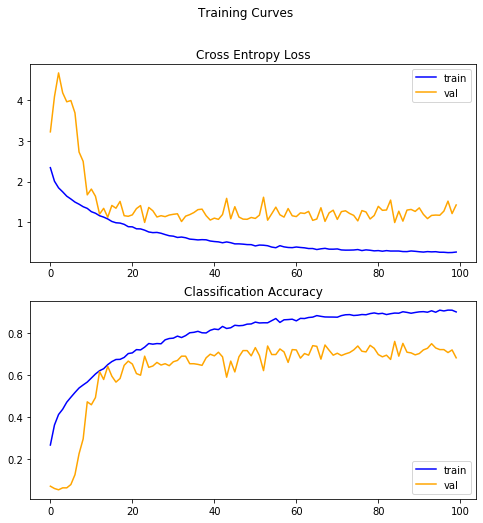


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 1.2622 - accuracy: 0.7193
loss: 1.26
accuracy: 0.72


In [0]:
optimizer = tf.keras.optimizers.Adam()
loss20_adam, acc20_adam = opt_train_report(number_of_classes, 128, optimizer, x_train_all, y_train_all)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3413 - accuracy: 0.2664 - val_loss: 3.1280 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9894 - accuracy: 0.3683 - val_loss: 3.3868 - val_accuracy: 0.0469
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8555 - accuracy: 0.4047 - val_loss: 4.1698 - val_accuracy: 0.0469
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7465 - accuracy: 0.4434 - val_loss: 4.4309 - val_accuracy: 0.0500
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6821 - accuracy: 0.4612 - val_loss: 4.8094 - val_accuracy: 0.0766
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6280 - accuracy: 0.4766 - val_loss: 4.1816 - val_accuracy: 0.0781
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 2s - loss

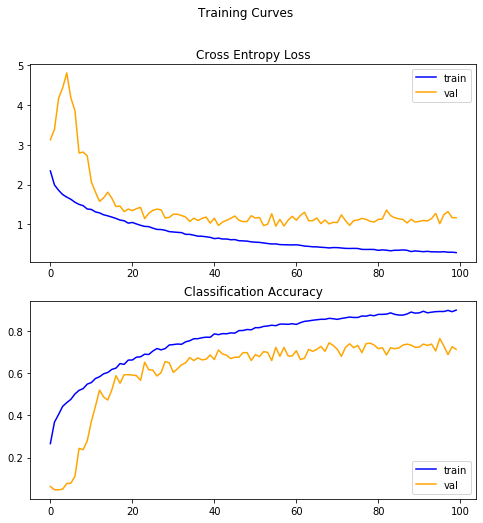


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 1.2065 - accuracy: 0.7026
loss: 1.21
accuracy: 0.70


In [0]:
optimizer = tf.keras.optimizers.Adamax()
loss20_adamax, acc20_adamax = opt_train_report(number_of_classes, 128, optimizer, x_train_all, y_train_all)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 3.1833 - accuracy: 0.0537 - val_loss: 3.0025 - val_accuracy: 0.0391
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 3.1307 - accuracy: 0.0652 - val_loss: 3.0065 - val_accuracy: 0.0500
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 3.0774 - accuracy: 0.0667 - val_loss: 3.0135 - val_accuracy: 0.0531
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 3.0578 - accuracy: 0.0801 - val_loss: 3.0080 - val_accuracy: 0.0500
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 3.0074 - accuracy: 0.0885 - val_loss: 2.9935 - val_accuracy: 0.0562
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.9802 - accuracy: 0.0967 - val_loss: 2.9766 - val_accuracy: 0.0469
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 2s - loss

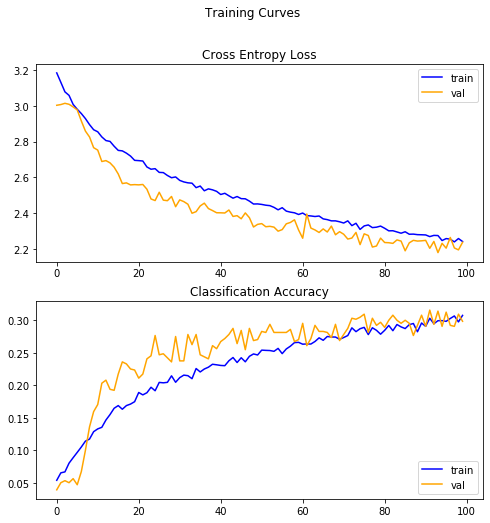


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 2.2187 - accuracy: 0.3039
loss: 2.22
accuracy: 0.30


In [0]:
optimizer = tf.keras.optimizers.Adadelta()
loss20_adadelta, acc20_adadelta = opt_train_report(number_of_classes, 128, optimizer, x_train_all, y_train_all)

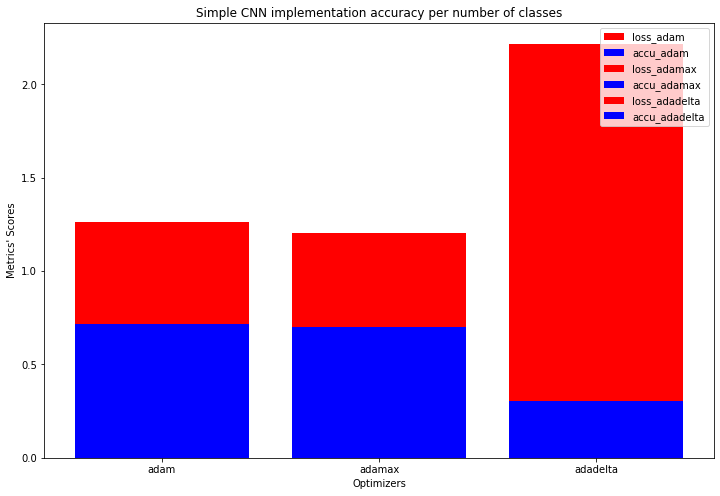

In [0]:
plt.figure(figsize=(12, 8))

plt.bar('adam', loss20_adam, width=0.8, color='red', label='loss_adam')
plt.bar('adam', acc20_adam, width=0.8, color='blue', label='accu_adam')

plt.bar('adamax', loss20_adamax, width=0.8, color='red', label='loss_adamax')
plt.bar('adamax', acc20_adamax, width=0.8, color='blue', label='accu_adamax')

plt.bar('adadelta', loss20_adadelta, width=0.8, color='red', label='loss_adadelta')
plt.bar('adadelta', acc20_adadelta, width=0.8, color='blue', label='accu_adadelta')

plt.legend(loc='upper right')

plt.xlabel("Optimizers")
plt.ylabel("Metrics' Scores")

plt.title("Simple CNN implementation accuracy per number of classes")

plt.show()

#### **Βέλτιστο Learning Rate**

Παρατηρούμε από την προηγούμενη εκτίμηση ότι ο καλύτερος optimizer είναι ο Adam. Μας μένει πλέον να μάθουμε ποια είναι η καλύτερη τιμή για το leanging rate του optimizer. Οι τιμές που θα δοκιμάσουμε είναι:
1. 0.01
2. 0.005
3. 0.0025
4. 0.001 (deafult)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.7797 - accuracy: 0.1951 - val_loss: 7.7736 - val_accuracy: 0.1516
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.2508 - accuracy: 0.2716 - val_loss: 3.2537 - val_accuracy: 0.1766
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.1302 - accuracy: 0.3157 - val_loss: 2.7363 - val_accuracy: 0.2313
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0848 - accuracy: 0.3326 - val_loss: 2.1923 - val_accuracy: 0.3219
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0117 - accuracy: 0.3590 - val_loss: 2.3789 - val_accuracy: 0.3219
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9709 - accuracy: 0.3713 - val_loss: 2.1267 - val_accuracy: 0.3375
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 2s - loss

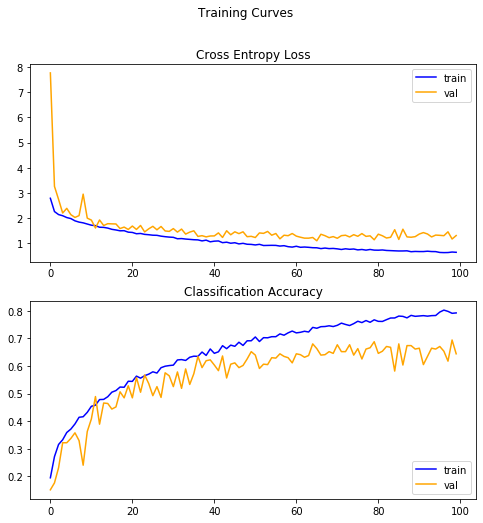


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 1.2860 - accuracy: 0.6503
loss: 1.29
accuracy: 0.65


In [0]:
lr = 0.01
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
loss20_adam_001, acc20_adam_001 = opt_train_report(number_of_classes, 128, optimizer, x_train_all, y_train_all)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.6017 - accuracy: 0.2242 - val_loss: 3.7594 - val_accuracy: 0.1297
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.1914 - accuracy: 0.3104 - val_loss: 2.3968 - val_accuracy: 0.2297
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0311 - accuracy: 0.3505 - val_loss: 2.1067 - val_accuracy: 0.3297
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9364 - accuracy: 0.3879 - val_loss: 1.9607 - val_accuracy: 0.3562
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8659 - accuracy: 0.4019 - val_loss: 1.8791 - val_accuracy: 0.3906
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7826 - accuracy: 0.4270 - val_loss: 2.3046 - val_accuracy: 0.2891
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 2s - loss

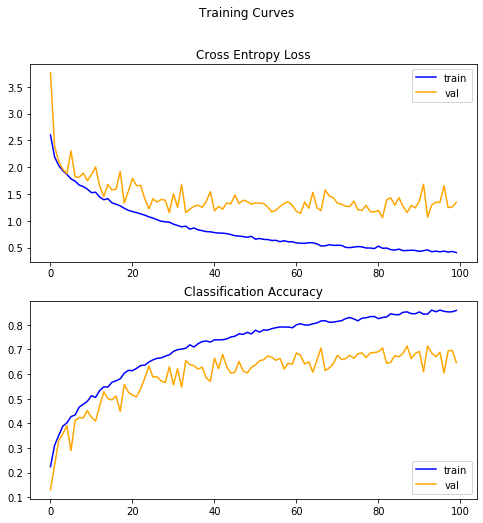


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 1.3223 - accuracy: 0.6604
loss: 1.32
accuracy: 0.66


In [0]:
lr = 0.005
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
loss20_adam_0005, acc20_adam_0005 = opt_train_report(number_of_classes, 128, optimizer, x_train_all, y_train_all)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.4342 - accuracy: 0.2557 - val_loss: 3.8621 - val_accuracy: 0.0734
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0614 - accuracy: 0.3546 - val_loss: 4.1232 - val_accuracy: 0.0688
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9083 - accuracy: 0.3927 - val_loss: 3.5884 - val_accuracy: 0.0938
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7964 - accuracy: 0.4182 - val_loss: 3.7387 - val_accuracy: 0.1031
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7113 - accuracy: 0.4498 - val_loss: 3.1060 - val_accuracy: 0.1391
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6396 - accuracy: 0.4779 - val_loss: 2.7657 - val_accuracy: 0.1906
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 2s - loss

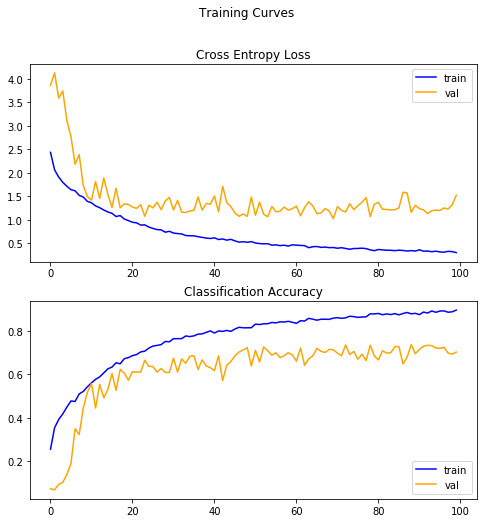


Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.3832 - accuracy: 0.6932
loss: 1.38
accuracy: 0.69


In [0]:
lr = 0.0025
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
loss20_adam_00025, acc20_adam_00025 = opt_train_report(number_of_classes, 128, optimizer, x_train_all, y_train_all)

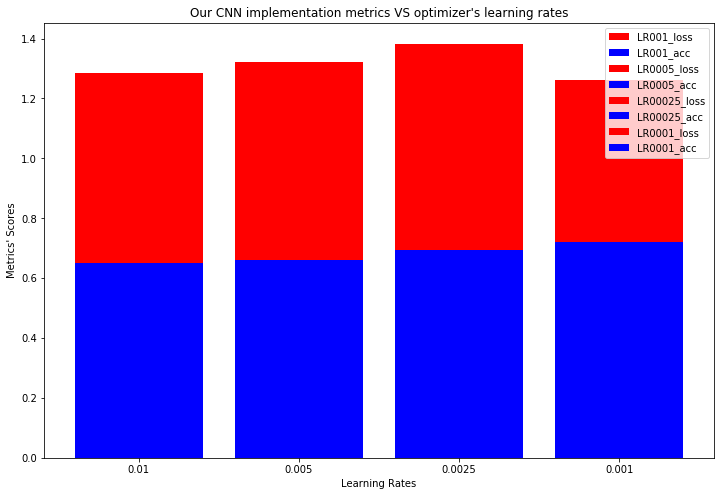

In [0]:
plt.figure(figsize=(12, 8))

plt.bar('0.01', loss20_adam_001, width=0.8, color='red', label='LR001_loss')
plt.bar('0.01', acc20_adam_001, width=0.8, color='blue', label='LR001_acc')

plt.bar('0.005', loss20_adam_0005, width=0.8, color='red', label='LR0005_loss')
plt.bar('0.005', acc20_adam_0005, width=0.8, color='blue', label='LR0005_acc')

plt.bar('0.0025', loss20_adam_00025, width=0.8, color='red', label='LR00025_loss')
plt.bar('0.0025', acc20_adam_00025, width=0.8, color='blue', label='LR00025_acc')

plt.bar('0.001', loss20_adam, width=0.8, color='red', label='LR0001_loss')
plt.bar('0.001', acc20_adam, width=0.8, color='blue', label='LR0001_acc')

plt.legend(loc='upper right')

plt.xlabel("Learning Rates")
plt.ylabel("Metrics' Scores")

plt.title("Our CNN implementation metrics VS optimizer's learning rates")

plt.show()

#### **Βέλτιστο Batch Size**

Από τις παραπάνω μετρήσεις παρατηρούμε ότι τα καλύτερα αποτελέσματα προκύπτουν για ρυθμό μάθησης 0.001(default) για τον optimizer Adam. Στη συνέχεια μελετάμε αν και κατα πόσο επηρεάζει το batch size με το συγκεκριμένο ρυθμό μάθησης το evaluation test. Οι τιμές που χρησιμοποιούνται είναι οι εξης:

1. 32
2. 64
3. 128 (default)
4. 256
5. 512

In [0]:
best_optimizer = tf.keras.optimizers.Adam()

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6525 - accuracy: 0.1973 - val_loss: 2.9156 - val_accuracy: 0.1063
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4323 - accuracy: 0.2437 - val_loss: 3.1748 - val_accuracy: 0.0938
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2748 - accuracy: 0.2773 - val_loss: 3.4358 - val_accuracy: 0.1000
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3223 - accuracy: 0.2744 - val_loss: 3.3561 - val_accuracy: 0.0812
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1697 - accuracy: 0.3135 - val_loss: 2.9897 - val_accuracy: 0.1250
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0889 - accuracy: 0.3423 - val_loss: 2.5840 - val_accuracy: 0.2250
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 1s - loss

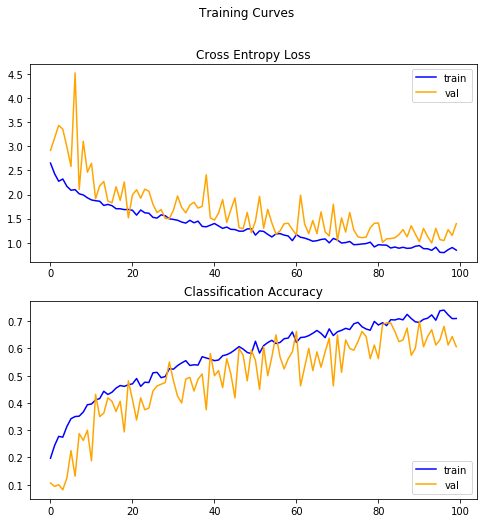


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.1990 - accuracy: 0.6490
loss: 1.20
accuracy: 0.65


In [0]:
batch_size = 32
loss20_bs32, acc20_bs32 = opt_train_report(number_of_classes, batch_size, best_optimizer, x_train_all, y_train_all)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.8595 - accuracy: 0.1858 - val_loss: 4.4669 - val_accuracy: 0.1250
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3687 - accuracy: 0.2651 - val_loss: 2.3560 - val_accuracy: 0.2594
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2441 - accuracy: 0.2837 - val_loss: 2.3682 - val_accuracy: 0.2531
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1374 - accuracy: 0.3191 - val_loss: 2.4269 - val_accuracy: 0.2562
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1125 - accuracy: 0.3291 - val_loss: 2.1209 - val_accuracy: 0.3406
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0657 - accuracy: 0.3430 - val_loss: 2.1072 - val_accuracy: 0.3406
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 1s - loss

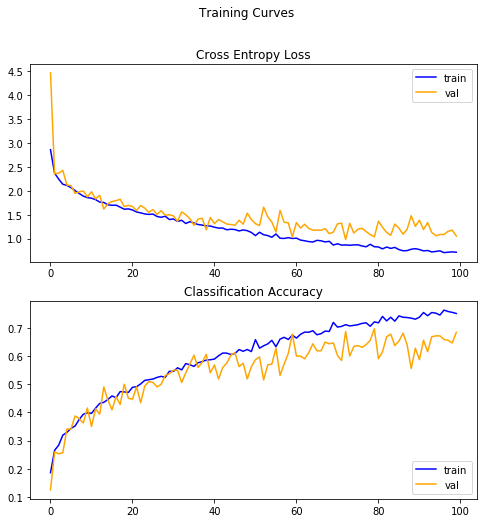


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1709 - accuracy: 0.6594
loss: 1.17
accuracy: 0.66


In [0]:
batch_size = 64
loss20_bs64, acc20_bs64 = opt_train_report(number_of_classes, batch_size, best_optimizer, x_train_all, y_train_all)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.6610 - accuracy: 0.2108 - val_loss: 4.3396 - val_accuracy: 0.1625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.1947 - accuracy: 0.2987 - val_loss: 2.3835 - val_accuracy: 0.2406
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0470 - accuracy: 0.3503 - val_loss: 2.3101 - val_accuracy: 0.2594
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9373 - accuracy: 0.3781 - val_loss: 2.0139 - val_accuracy: 0.3672
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8593 - accuracy: 0.4008 - val_loss: 1.9437 - val_accuracy: 0.3922
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8207 - accuracy: 0.4113 - val_loss: 1.8171 - val_accuracy: 0.4219
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 2s - loss

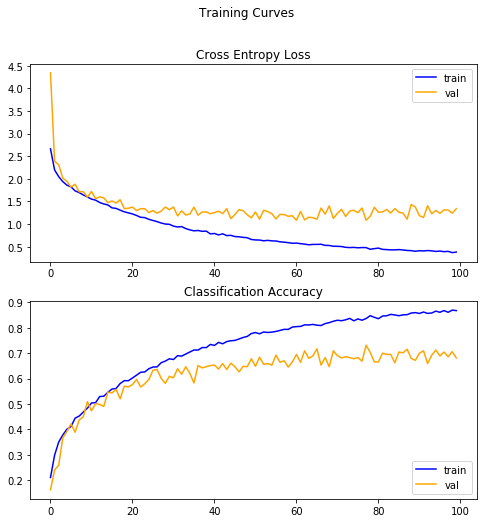


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 1.2383 - accuracy: 0.7003
loss: 1.24
accuracy: 0.70


In [0]:
batch_size = 128
loss20_bs128, acc20_bs128 = opt_train_report(number_of_classes, batch_size, best_optimizer, x_train_all, y_train_all)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 5s - loss: 2.3591 - accuracy: 0.2776 - val_loss: 2.6088 - val_accuracy: 0.1852
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 3s - loss: 1.9416 - accuracy: 0.3792 - val_loss: 3.2766 - val_accuracy: 0.1117
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 3s - loss: 1.7848 - accuracy: 0.4297 - val_loss: 3.0964 - val_accuracy: 0.1219
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 3s - loss: 1.6649 - accuracy: 0.4658 - val_loss: 3.1703 - val_accuracy: 0.0938
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 3s - loss: 1.5830 - accuracy: 0.4904 - val_loss: 2.5672 - val_accuracy: 0.2008
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 3s - loss: 1.4810 - accuracy: 0.5218 - val_loss: 2.2643 - val_accuracy: 0.2781
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 3s - loss

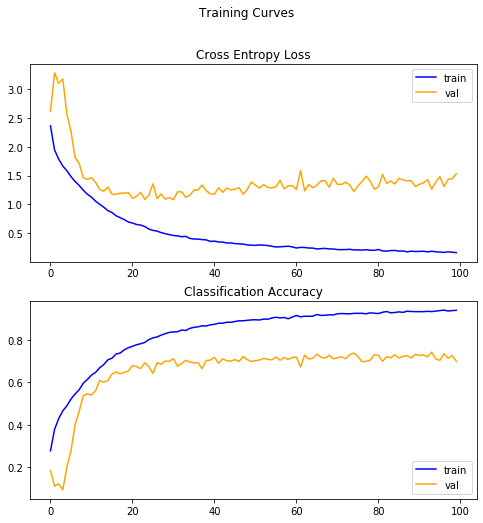


Test set evaluation metrics
30/30 [==============================] - 0s 16ms/step - loss: 1.7340 - accuracy: 0.6776
loss: 1.73
accuracy: 0.68


In [0]:
batch_size = 256
loss20_bs256, acc20_bs256 = opt_train_report(number_of_classes, batch_size, best_optimizer, x_train_all, y_train_all)

Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 9s - loss: 2.2371 - accuracy: 0.3011 - val_loss: 3.0862 - val_accuracy: 0.1484
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 6s - loss: 1.7938 - accuracy: 0.4274 - val_loss: 4.5149 - val_accuracy: 0.0613
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 6s - loss: 1.6118 - accuracy: 0.4802 - val_loss: 3.6986 - val_accuracy: 0.1004
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 6s - loss: 1.4738 - accuracy: 0.5215 - val_loss: 3.6114 - val_accuracy: 0.1023
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 6s - loss: 1.3465 - accuracy: 0.5586 - val_loss: 2.9187 - val_accuracy: 0.1598
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 6s - loss: 1.2206 - accuracy: 0.5998 - val_loss: 2.6222 - val_accuracy: 0.2570
Epoch 7/100

Epoch 00007: saving model to best_weights.hdf5
64/64 - 6s - loss

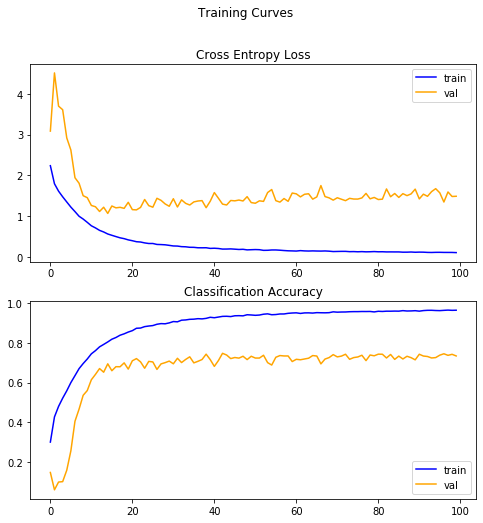


Test set evaluation metrics
30/30 [==============================] - 1s 29ms/step - loss: 1.5720 - accuracy: 0.7319
loss: 1.57
accuracy: 0.73


In [0]:
batch_size = 512
loss20_bs512, acc20_bs512 = opt_train_report(number_of_classes, batch_size, best_optimizer, x_train_all, y_train_all)

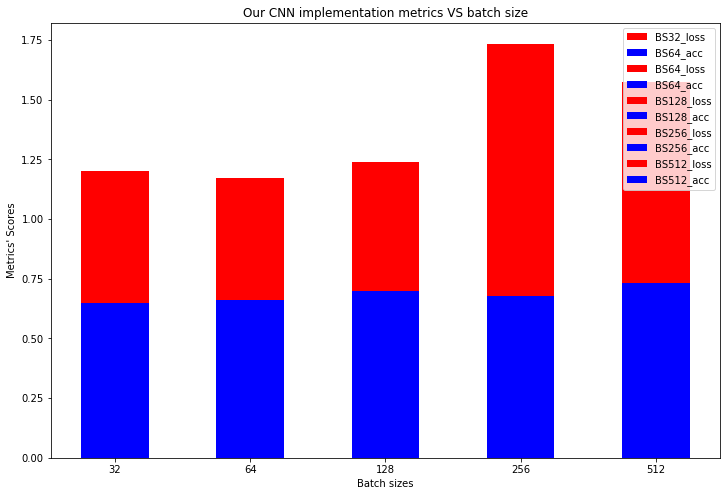

In [0]:
plt.figure(figsize=(12, 8))

plt.bar('32', loss20_bs32, width=0.5, color='red', label='BS32_loss')
plt.bar('32', acc20_bs32, width=0.5, color='blue', label='BS64_acc')

plt.bar('64', loss20_bs64, width=0.5, color='red', label='BS64_loss')
plt.bar('64', acc20_bs64, width=0.5, color='blue', label='BS64_acc')

plt.bar('128', loss20_bs128, width=0.5, color='red', label='BS128_loss')
plt.bar('128', acc20_bs128, width=0.5, color='blue', label='BS128_acc')

plt.bar('256', loss20_bs256, width=0.5, color='red', label='BS256_loss')
plt.bar('256', acc20_bs256, width=0.5, color='blue', label='BS256_acc')

plt.bar('512', loss20_bs512, width=0.5, color='red', label='BS512_loss')
plt.bar('512', acc20_bs512, width=0.5, color='blue', label='BS512_acc')

plt.legend(loc='upper right')

plt.xlabel("Batch sizes")
plt.ylabel("Metrics' Scores")

plt.title("Our CNN implementation metrics VS batch size")

plt.show()

####**Απόκριση Ανα Πλήθος Ομάδων**

Παρατηρούμε πως η καλύτερη απόδοση εκδηλώνεται για batch size 512. Στη συνέχεια θα παρακολουθήσουμε πως λειτουργεί σύμφωνα με τις βέλτιστες τιμές των προηγούμενων υποενοτήτων, το μοντέλο μας για διαφορετικό πλήθος ομάδων.

Train for 64 steps, validate for 5 steps
Epoch 1/100
63/64 [============================>.] - ETA: 0s - loss: 2.0502 - accuracy: 0.3529
Epoch 00001: saving model to best_weights.hdf5
64/64 [==============================] - 12s 184ms/step - loss: 2.0459 - accuracy: 0.3540 - val_loss: 3.4306 - val_accuracy: 0.0582
Epoch 2/100
63/64 [============================>.] - ETA: 0s - loss: 1.5882 - accuracy: 0.4874
Epoch 00002: saving model to best_weights.hdf5
64/64 [==============================] - 4s 67ms/step - loss: 1.5861 - accuracy: 0.4884 - val_loss: 4.2995 - val_accuracy: 0.0547
Epoch 3/100
63/64 [============================>.] - ETA: 0s - loss: 1.3636 - accuracy: 0.5599
Epoch 00003: saving model to best_weights.hdf5
64/64 [==============================] - 4s 65ms/step - loss: 1.3622 - accuracy: 0.5602 - val_loss: 4.3448 - val_accuracy: 0.0566
Epoch 4/100
63/64 [============================>.] - ETA: 0s - loss: 1.2030 - accuracy: 0.6082
Epoch 00004: saving model to best_weights.hdf5

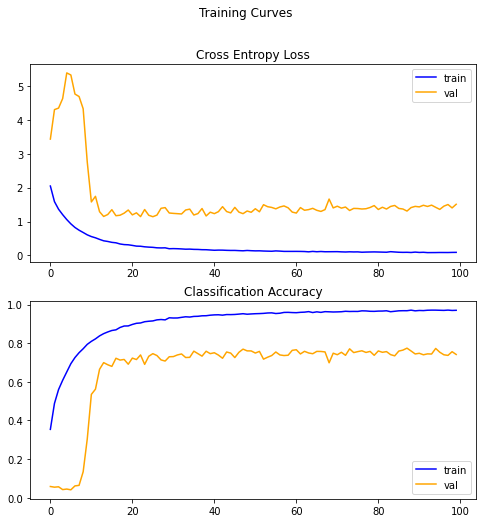


Test set evaluation metrics
30/30 [==============================] - 1s 22ms/step - loss: 1.5646 - accuracy: 0.7256
loss: 1.56
accuracy: 0.73


In [26]:
loss20_manual, acc20_manual = opt_train_report(20, 512, tf.keras.optimizers.Adam(), x_train_all, y_train_all, 100)

Train for 64 steps, validate for 5 steps
Epoch 1/100
63/64 [============================>.] - ETA: 0s - loss: 2.9476 - accuracy: 0.1954
Epoch 00001: saving model to best_weights.hdf5
64/64 [==============================] - 5s 85ms/step - loss: 2.9421 - accuracy: 0.1965 - val_loss: 3.9478 - val_accuracy: 0.0254
Epoch 2/100
63/64 [============================>.] - ETA: 0s - loss: 2.3929 - accuracy: 0.3177
Epoch 00002: saving model to best_weights.hdf5
64/64 [==============================] - 4s 67ms/step - loss: 2.3907 - accuracy: 0.3184 - val_loss: 5.0211 - val_accuracy: 0.0234
Epoch 3/100
63/64 [============================>.] - ETA: 0s - loss: 2.1072 - accuracy: 0.3899
Epoch 00003: saving model to best_weights.hdf5
64/64 [==============================] - 4s 67ms/step - loss: 2.1052 - accuracy: 0.3907 - val_loss: 5.8853 - val_accuracy: 0.0234
Epoch 4/100
63/64 [============================>.] - ETA: 0s - loss: 1.9082 - accuracy: 0.4386
Epoch 00004: saving model to best_weights.hdf5
6

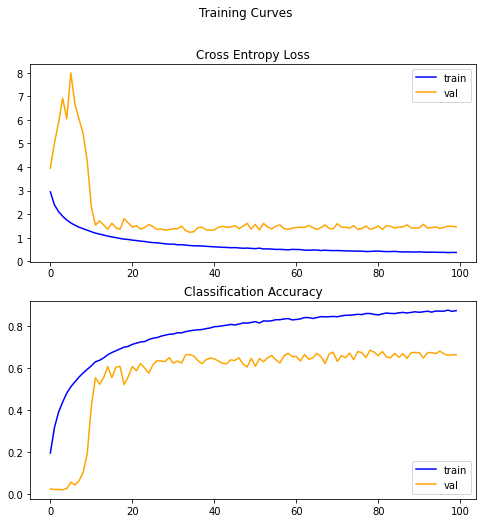


Test set evaluation metrics
30/30 [==============================] - 1s 24ms/step - loss: 1.4342 - accuracy: 0.6676
loss: 1.43
accuracy: 0.67


In [27]:
loss40_manual, acc40_manual = opt_train_report(40, 512, tf.keras.optimizers.Adam(), x_train_all, y_train_all, 100)

Train for 64 steps, validate for 5 steps
Epoch 1/100
63/64 [============================>.] - ETA: 0s - loss: 3.6416 - accuracy: 0.1075
Epoch 00001: saving model to best_weights.hdf5
64/64 [==============================] - 6s 88ms/step - loss: 3.6370 - accuracy: 0.1078 - val_loss: 4.1293 - val_accuracy: 0.0172
Epoch 2/100
63/64 [============================>.] - ETA: 0s - loss: 3.1183 - accuracy: 0.2008
Epoch 00002: saving model to best_weights.hdf5
64/64 [==============================] - 4s 67ms/step - loss: 3.1148 - accuracy: 0.2011 - val_loss: 4.6873 - val_accuracy: 0.0199
Epoch 3/100
63/64 [============================>.] - ETA: 0s - loss: 2.8596 - accuracy: 0.2536
Epoch 00003: saving model to best_weights.hdf5
64/64 [==============================] - 4s 67ms/step - loss: 2.8593 - accuracy: 0.2534 - val_loss: 6.1441 - val_accuracy: 0.0164
Epoch 4/100
63/64 [============================>.] - ETA: 0s - loss: 2.6589 - accuracy: 0.2937
Epoch 00004: saving model to best_weights.hdf5
6

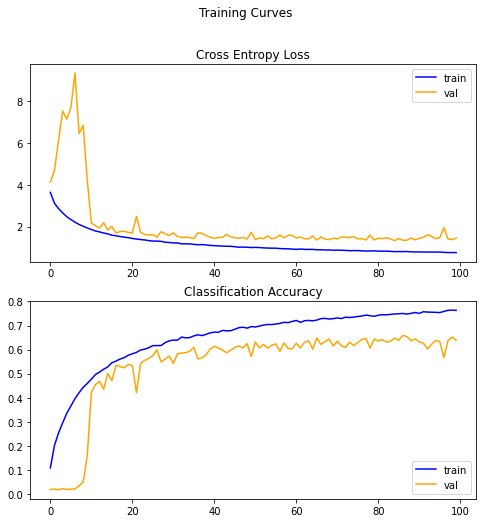


Test set evaluation metrics
30/30 [==============================] - 1s 24ms/step - loss: 1.4024 - accuracy: 0.6542
loss: 1.40
accuracy: 0.65


In [28]:
loss60_manual, acc60_manual = opt_train_report(60, 512, tf.keras.optimizers.Adam(), x_train_all, y_train_all, 100)

Train for 64 steps, validate for 5 steps
Epoch 1/100
63/64 [============================>.] - ETA: 0s - loss: 4.0084 - accuracy: 0.0778
Epoch 00001: saving model to best_weights.hdf5
64/64 [==============================] - 6s 92ms/step - loss: 4.0028 - accuracy: 0.0783 - val_loss: 4.4134 - val_accuracy: 0.0168
Epoch 2/100
63/64 [============================>.] - ETA: 0s - loss: 3.5197 - accuracy: 0.1480
Epoch 00002: saving model to best_weights.hdf5
64/64 [==============================] - 4s 67ms/step - loss: 3.5174 - accuracy: 0.1486 - val_loss: 4.7971 - val_accuracy: 0.0113
Epoch 3/100
63/64 [============================>.] - ETA: 0s - loss: 3.2373 - accuracy: 0.1993
Epoch 00003: saving model to best_weights.hdf5
64/64 [==============================] - 4s 68ms/step - loss: 3.2333 - accuracy: 0.2000 - val_loss: 5.5080 - val_accuracy: 0.0125
Epoch 4/100
63/64 [============================>.] - ETA: 0s - loss: 3.0463 - accuracy: 0.2303
Epoch 00004: saving model to best_weights.hdf5
6

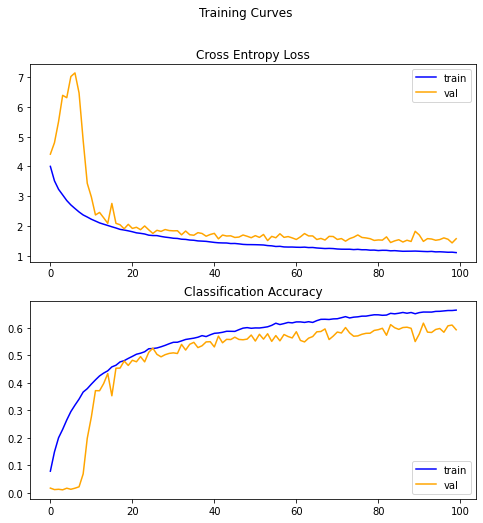


Test set evaluation metrics
30/30 [==============================] - 1s 24ms/step - loss: 1.5730 - accuracy: 0.5934
loss: 1.57
accuracy: 0.59


In [29]:
loss80_manual, acc80_manual = opt_train_report(80, 512, tf.keras.optimizers.Adam(), x_train_all, y_train_all, 100)

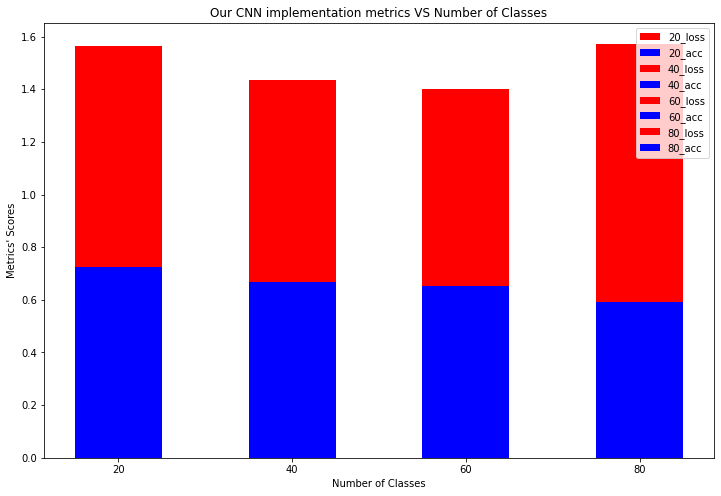

In [30]:
plt.figure(figsize=(12, 8))

plt.bar('20', loss20_manual, width=0.5, color='red', label='20_loss')
plt.bar('20', acc20_manual, width=0.5, color='blue', label='20_acc')

plt.bar('40', loss40_manual, width=0.5, color='red', label='40_loss')
plt.bar('40', acc40_manual, width=0.5, color='blue', label='40_acc')

plt.bar('60', loss60_manual, width=0.5, color='red', label='60_loss')
plt.bar('60', acc60_manual, width=0.5, color='blue', label='60_acc')

plt.bar('80', loss80_manual, width=0.5, color='red', label='80_loss')
plt.bar('80', acc80_manual, width=0.5, color='blue', label='80_acc')

plt.legend(loc='upper right')

plt.xlabel("Number of Classes")
plt.ylabel("Metrics' Scores")

plt.title("Our CNN implementation metrics VS Number of Classes")

plt.show()

###**Βελτιστοποίηση με Gridsearch**

Αποτελεί τη βελτιστοποίηση των υπερπαραμέτρων του δικτύου με αναζήτηση πλέγματος. Αποτελεί τη βασική μέθοδο αναζήτησης (base method) καθώς ελέγχει όλους τους συνδιασμούς υπερπαραμέτρων που της δίνεται. Όντας brute force ως ιδέα είναι πολύ απλή για τη βελτιστοποίηση των υπερπαραμέτρων.

Χρησιμοποιούμε σε αυτό το τμήμα το εργαλείο tensorboard της βιβλιοθήκης tensorflow για την μελέτη της απόκρισης του δικτύου στις διάφορες τιμές των υπεραραμέτρων. Τα αποτελέσματα θα παρουσιαστούν σε μορφή εικόνων μιας και το εργαλείο αυτό 1) αποτελεί εξωτερικό plugin του colab και 2) χρειάζεται να έχει τα δεδομένα εύκαιρα προκειμένου να μπορεί να τα παρουσιάσει ενώ το colab σε κάθε επανεκκίνηση του runtime διαγράφει τα αποθηκευμένα αρχεία (αυτά θα υπάρχουν στο zip του παραδοτέου για περαιτέρω έλεγχο).

In [0]:
# Αρχικά ορίζουμε το που θα αποθηκευτούν τα δεδομένα εκπαίδευσης
logdir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [0]:
'''
Στο σημείο αυτό ορίζουμε τις υπερπαραμέτρους που θέλουμε να ελέγξουμε
Καταγράφουμε το ποιες μετρικές μας ενδιαφέρουν να μελετήσουμε
Τέλος αναγράφουμε το που και πως θα αποθηκεύονται τα δεδομένα
για το tensorboard
'''

# Ορισμός υπερπαραμέτρων
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([64, 128, 256, 320, 512]))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'adamax']))
HP_LEARNING_RATE = hp.HParam('learning_rate', hp.Discrete([0.005, 0.0025, 0.001, 0.0005]))
HP_BATCH_SIZE = hp.HParam('batch_size', hp.Discrete([32, 64, 128, 256]))

# Ορισμός μετρικών προς έλεγχο
METRIC_ACCURACY = 'val_accuracy'
METRIC_LOSS = 'val_loss'

# Ορισμός τοποθεσίας αποθήκευσης δεδομένων tensorboard και αρχείου config 
with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_OPTIMIZER, HP_LEARNING_RATE, HP_BATCH_SIZE],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Validation Accuracy'), 
             hp.Metric(METRIC_LOSS, display_name='Validation Loss')])

In [0]:
'''
Για την αναζήτηση των υπερπαραμέτρων με τη μέθοδο πλέγματος (gridsearch) 
απαιτείται να επαναπροσδιορίσουμε τη συνάρτηση της αρχικοποίησης του μοντέλου
Με την προσθήκη της παραμέτρου -- hparams -- μπορούμε να προσδιορίσουμε τις
υπερπαραμέτρους προς έλεγχο
'''
def init_opt_model_gs(summary, number_of_classes, hparams):
  model = models.Sequential()

  model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)))
  model.add(layers.UpSampling2D(size=(2,2)))
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))

  model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Flatten())
  model.add(layers.Dense(hparams[HP_NUM_UNITS] , activation='relu'))
  model.add(layers.Dense(number_of_classes, activation='softmax'))

  opt = tf.keras.optimizers.deserialize({'class_name': hparams[HP_OPTIMIZER], 
                                         'config': {'learning_rate': hparams[HP_LEARNING_RATE]}})

  model.compile(optimizer=opt, loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])

  if summary: 
    model.summary()
  return model

In [0]:
'''
Η συνάρτηση που θα τρέχουμε συνεχώς για να διεκπεραιώσουμε τη gridsearch
Μέσω αυτή μπορούμε να μελετήσουμε τη σχέση που υπάρχει μεταξύ του learning rate
και batch size που αναγράφεται σε πολλά papers
'''
def opt_train_report_gs(number_of_classes, hparams, x_train_all, y_train_all, num_epochs=100):

  x_train_ds, y_train_ds, x_test_ds, y_test_ds = set_classes(number_of_classes, 
                                                             x_train_all, y_train_all)
  
  train_ds, val_ds, test_ds, classes = set_batch(batch_size=hparams[HP_BATCH_SIZE], 
                                        shift=True, 
                                        x_train_ds=x_train_ds, 
                                        y_train_ds=y_train_ds,
                                        x_test_ds=x_test_ds,
                                        y_test_ds=y_test_ds)
  
  MODEL = init_opt_model_gs(summary = False, number_of_classes=number_of_classes, hparams=hparams)

  MODEL_history = MODEL.fit(train_ds, epochs=num_epochs, steps_per_epoch=64, 
                            validation_data=val_ds, validation_steps=5, 
                            callbacks=[tf.keras.callbacks.TensorBoard(logdir), 
                                       hp.KerasCallback(logdir, hparams)], verbose=2)

  return model_report(MODEL, MODEL_history, test_ds, 30)

In [0]:
def run(run_dir, number_of_classes, hparams, x_train_all, y_train_all):
  with tf.summary.create_file_writer(run_dir).as_default():
    # Καταγραφή τω τιμών σε κάθε δοκιμή
    hp.hparams(hparams)
    # Δημιουργία περίληψης αποτελεσμάτων
    loss, accuracy = opt_train_report(number_of_classes, hparams, x_train_all, y_train_all)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)
    tf.summary.scalar(METRIC_LOSS, loss, step=1)

--- Starting trial: run-0
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.7593 - accuracy: 0.1904 - val_loss: 3.0043 - val_accuracy: 0.0500
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4117 - accuracy: 0.2495 - val_loss: 3.5359 - val_accuracy: 0.0188
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3549 - accuracy: 0.2773 - val_loss: 3.5969 - val_accuracy: 0.0750
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2518 - accuracy: 0.3022 - val_loss: 4.1233 - val_accuracy: 0.0375
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1970 - accuracy: 0.3159 - val_loss: 5.7283 - val_accuracy: 0.0312
Epoch 6/100

Epoch 00006: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1150 - accuracy: 0.3271 - val_loss:

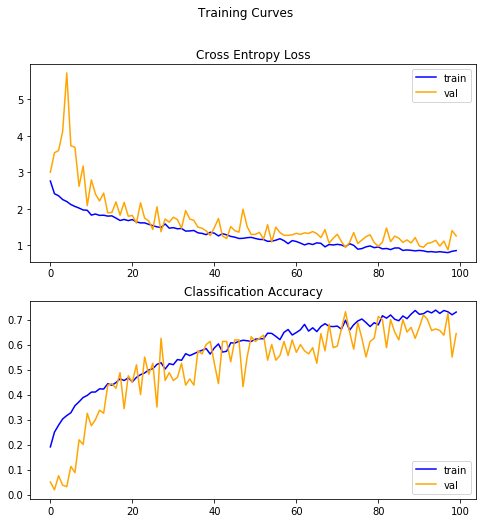


Test set evaluation metrics
30/30 [==============================] - 0s 4ms/step - loss: 0.9941 - accuracy: 0.6854
loss: 0.99
accuracy: 0.69
--- Starting trial: run-1
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6075 - accuracy: 0.2119 - val_loss: 2.9972 - val_accuracy: 0.0562
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2972 - accuracy: 0.2983 - val_loss: 3.3849 - val_accuracy: 0.0719
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1009 - accuracy: 0.3440 - val_loss: 4.0411 - val_accuracy: 0.0500
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0553 - accuracy: 0.3601 - val_loss: 3.9444 - val_accuracy: 0.0656
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9447 - accuracy: 0.3813 - val_loss: 4.20

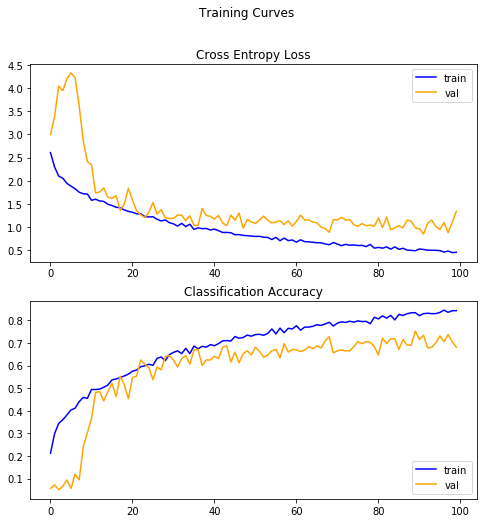


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1502 - accuracy: 0.6833
loss: 1.15
accuracy: 0.68
--- Starting trial: run-2
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4446 - accuracy: 0.2577 - val_loss: 3.0820 - val_accuracy: 0.0688
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0354 - accuracy: 0.3672 - val_loss: 3.5294 - val_accuracy: 0.0484
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9018 - accuracy: 0.3982 - val_loss: 4.0286 - val_accuracy: 0.0594
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7824 - accuracy: 0.4343 - val_loss: 4.4217 - val_accuracy: 0.0641
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.6803 - accuracy: 0.4689 - val_loss: 4.2

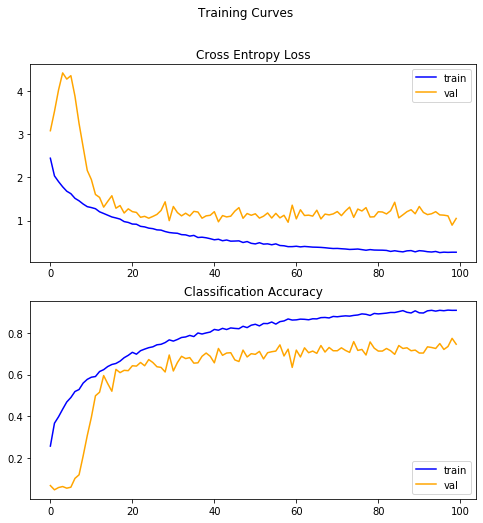


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.1291 - accuracy: 0.7424
loss: 1.13
accuracy: 0.74
--- Starting trial: run-3
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3170 - accuracy: 0.2870 - val_loss: 3.1132 - val_accuracy: 0.0484
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8918 - accuracy: 0.4019 - val_loss: 3.4496 - val_accuracy: 0.0539
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6931 - accuracy: 0.4615 - val_loss: 4.4620 - val_accuracy: 0.0594
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5446 - accuracy: 0.5056 - val_loss: 4.2836 - val_accuracy: 0.0695
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.4545 - accuracy: 0.5335 - val_loss: 4.1

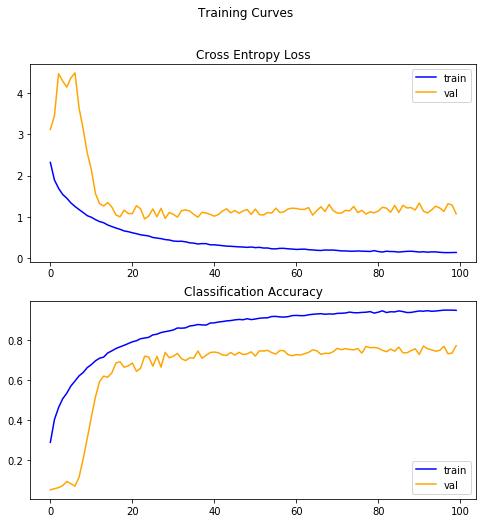


Test set evaluation metrics
30/30 [==============================] - 0s 12ms/step - loss: 1.1705 - accuracy: 0.7583
loss: 1.17
accuracy: 0.76
--- Starting trial: run-4
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8085 - accuracy: 0.1821 - val_loss: 2.9757 - val_accuracy: 0.1125
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5387 - accuracy: 0.2217 - val_loss: 3.4525 - val_accuracy: 0.1187
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3262 - accuracy: 0.2764 - val_loss: 3.2500 - val_accuracy: 0.0375
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2702 - accuracy: 0.2920 - val_loss: 4.3433 - val_accuracy: 0.0812
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1845 - accuracy: 0.3115 - val_loss: 3.24

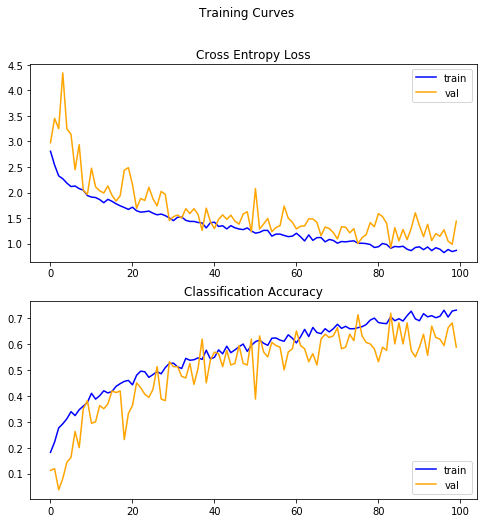


Test set evaluation metrics
30/30 [==============================] - 0s 4ms/step - loss: 1.1284 - accuracy: 0.6750
loss: 1.13
accuracy: 0.68
--- Starting trial: run-5
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6024 - accuracy: 0.2178 - val_loss: 3.0346 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2603 - accuracy: 0.2957 - val_loss: 3.4176 - val_accuracy: 0.0531
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0782 - accuracy: 0.3523 - val_loss: 4.2430 - val_accuracy: 0.0750
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0091 - accuracy: 0.3650 - val_loss: 3.8296 - val_accuracy: 0.0875
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9075 - accuracy: 0.3938 - val_loss: 3.347

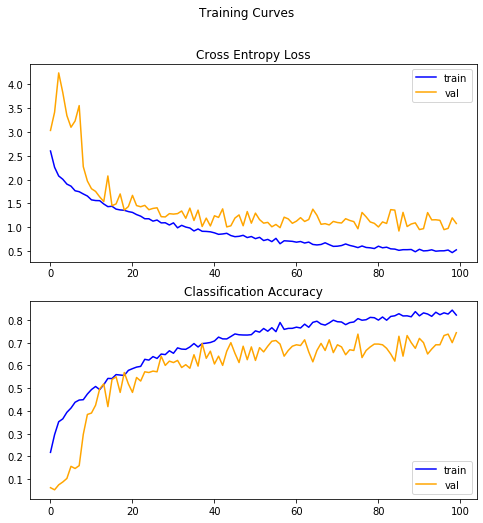


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1182 - accuracy: 0.7094
loss: 1.12
accuracy: 0.71
--- Starting trial: run-6
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4225 - accuracy: 0.2546 - val_loss: 3.2417 - val_accuracy: 0.0516
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0563 - accuracy: 0.3573 - val_loss: 4.3248 - val_accuracy: 0.0672
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8997 - accuracy: 0.3965 - val_loss: 5.2324 - val_accuracy: 0.0719
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7782 - accuracy: 0.4366 - val_loss: 5.6752 - val_accuracy: 0.0578
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.6869 - accuracy: 0.4630 - val_loss: 6.31

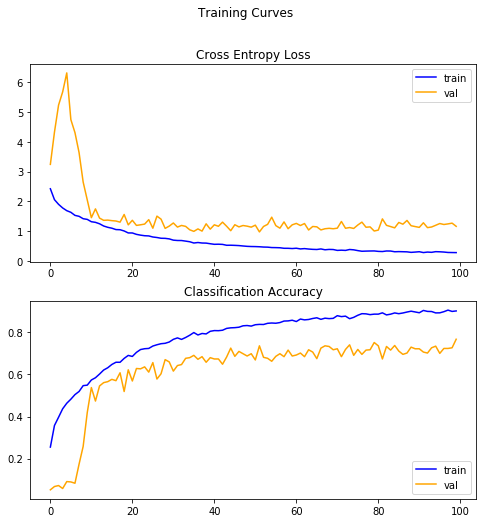


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.2030 - accuracy: 0.7411
loss: 1.20
accuracy: 0.74
--- Starting trial: run-7
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2491 - accuracy: 0.2999 - val_loss: 3.2644 - val_accuracy: 0.0500
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8437 - accuracy: 0.4119 - val_loss: 3.9096 - val_accuracy: 0.0500
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6735 - accuracy: 0.4639 - val_loss: 4.4678 - val_accuracy: 0.0508
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5119 - accuracy: 0.5125 - val_loss: 4.7745 - val_accuracy: 0.0492
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.3920 - accuracy: 0.5492 - val_loss: 5.13

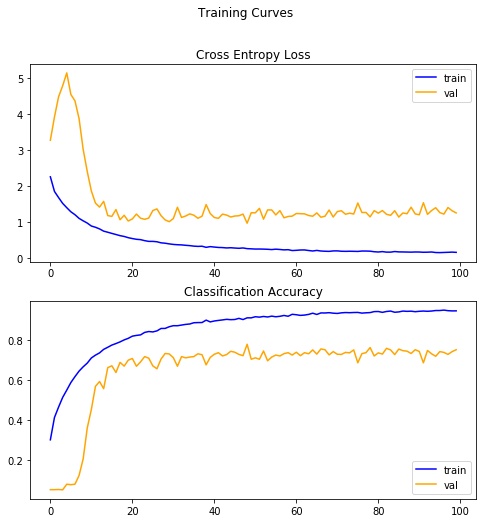


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.2761 - accuracy: 0.7393
loss: 1.28
accuracy: 0.74
--- Starting trial: run-8
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8594 - accuracy: 0.1455 - val_loss: 2.8161 - val_accuracy: 0.0875
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5146 - accuracy: 0.2207 - val_loss: 3.1748 - val_accuracy: 0.1312
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4176 - accuracy: 0.2329 - val_loss: 2.8516 - val_accuracy: 0.1875
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3449 - accuracy: 0.2642 - val_loss: 2.6449 - val_accuracy: 0.1688
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2664 - accuracy: 0.2822 - val_loss: 2.2

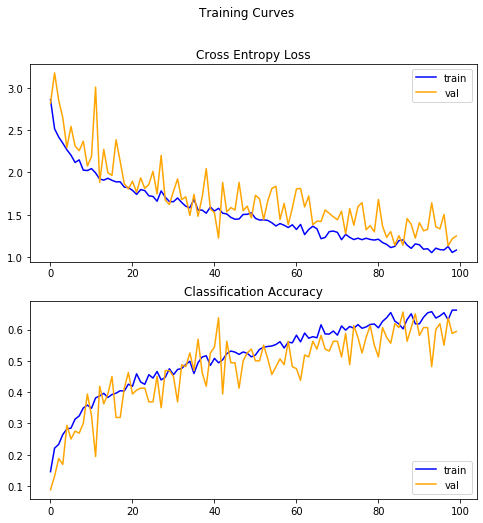


Test set evaluation metrics
30/30 [==============================] - 0s 4ms/step - loss: 1.1606 - accuracy: 0.6354
loss: 1.16
accuracy: 0.64
--- Starting trial: run-9
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6163 - accuracy: 0.2090 - val_loss: 3.0237 - val_accuracy: 0.1500
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3372 - accuracy: 0.2634 - val_loss: 2.8530 - val_accuracy: 0.1625
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1739 - accuracy: 0.3069 - val_loss: 2.4145 - val_accuracy: 0.2594
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1362 - accuracy: 0.3330 - val_loss: 2.2696 - val_accuracy: 0.2750
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9750 - accuracy: 0.3672 - val_loss: 2.39

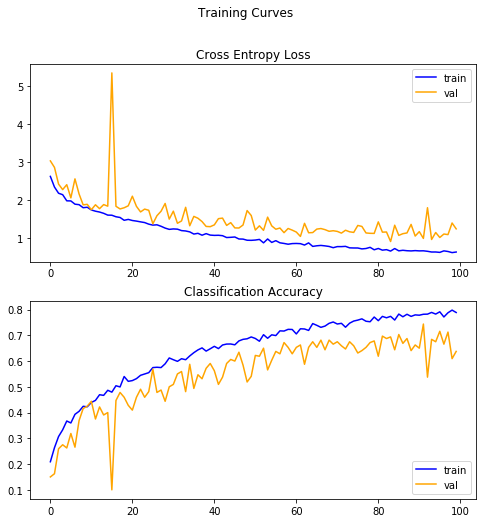


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0582 - accuracy: 0.6964
loss: 1.06
accuracy: 0.70
--- Starting trial: run-10
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4751 - accuracy: 0.2428 - val_loss: 2.9216 - val_accuracy: 0.1172
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1095 - accuracy: 0.3387 - val_loss: 4.1262 - val_accuracy: 0.0500
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9835 - accuracy: 0.3718 - val_loss: 3.3984 - val_accuracy: 0.0734
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9096 - accuracy: 0.3903 - val_loss: 2.7814 - val_accuracy: 0.1656
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8133 - accuracy: 0.4241 - val_loss: 3.

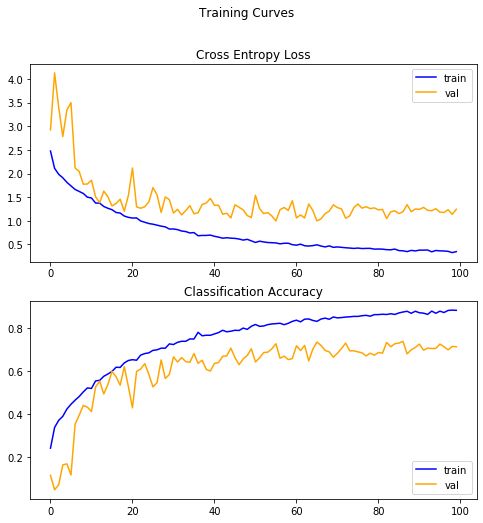


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.2500 - accuracy: 0.7016
loss: 1.25
accuracy: 0.70
--- Starting trial: run-11
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3252 - accuracy: 0.2753 - val_loss: 2.7173 - val_accuracy: 0.1680
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9427 - accuracy: 0.3786 - val_loss: 3.2618 - val_accuracy: 0.0688
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7390 - accuracy: 0.4415 - val_loss: 3.5195 - val_accuracy: 0.0867
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5911 - accuracy: 0.4861 - val_loss: 4.2179 - val_accuracy: 0.0445
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.4959 - accuracy: 0.5185 - val_loss: 3.

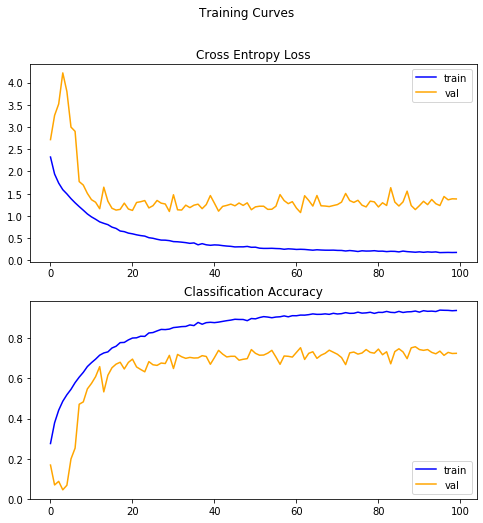


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.3657 - accuracy: 0.7234
loss: 1.37
accuracy: 0.72
--- Starting trial: run-12
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.9749 - accuracy: 0.1440 - val_loss: 8.0289 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5844 - accuracy: 0.1978 - val_loss: 6.0872 - val_accuracy: 0.0938
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5107 - accuracy: 0.2002 - val_loss: 2.4446 - val_accuracy: 0.2438
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4003 - accuracy: 0.2568 - val_loss: 3.8938 - val_accuracy: 0.1500
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3383 - accuracy: 0.2456 - val_loss: 2.6

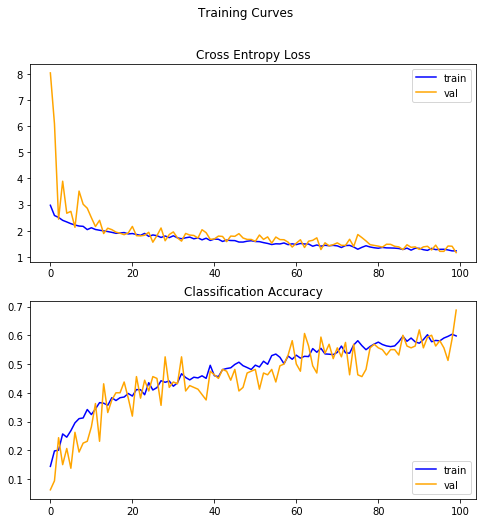


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.3363 - accuracy: 0.5854
loss: 1.34
accuracy: 0.59
--- Starting trial: run-13
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7699 - accuracy: 0.1736 - val_loss: 5.8275 - val_accuracy: 0.1375
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4048 - accuracy: 0.2317 - val_loss: 2.7679 - val_accuracy: 0.1625
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2626 - accuracy: 0.2810 - val_loss: 2.6750 - val_accuracy: 0.2094
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1688 - accuracy: 0.3062 - val_loss: 4.0724 - val_accuracy: 0.1750
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1003 - accuracy: 0.3289 - val_loss: 2.90

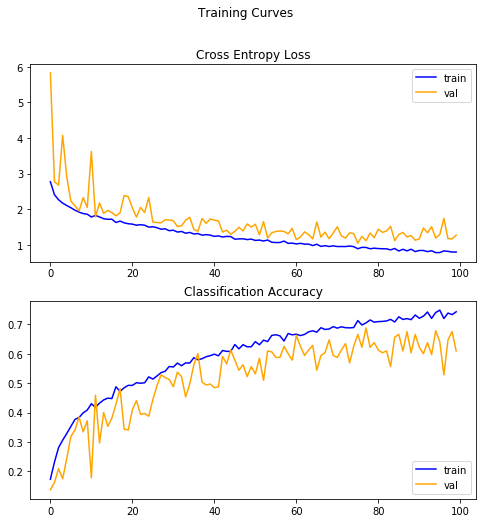


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1930 - accuracy: 0.6427
loss: 1.19
accuracy: 0.64
--- Starting trial: run-14
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5837 - accuracy: 0.2104 - val_loss: 3.5507 - val_accuracy: 0.1125
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2014 - accuracy: 0.3000 - val_loss: 2.2805 - val_accuracy: 0.2750
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0648 - accuracy: 0.3326 - val_loss: 3.0517 - val_accuracy: 0.1719
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9260 - accuracy: 0.3823 - val_loss: 2.1635 - val_accuracy: 0.2922
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8487 - accuracy: 0.4044 - val_loss: 2.3

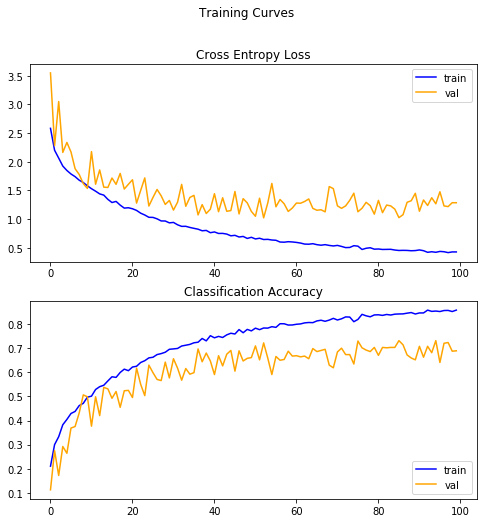


Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.2953 - accuracy: 0.6872
loss: 1.30
accuracy: 0.69
--- Starting trial: run-15
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3982 - accuracy: 0.2531 - val_loss: 3.1218 - val_accuracy: 0.1594
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0150 - accuracy: 0.3577 - val_loss: 2.6436 - val_accuracy: 0.1836
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8411 - accuracy: 0.4088 - val_loss: 3.2521 - val_accuracy: 0.1203
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7080 - accuracy: 0.4525 - val_loss: 2.8506 - val_accuracy: 0.1773
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6029 - accuracy: 0.4857 - val_loss: 1.8

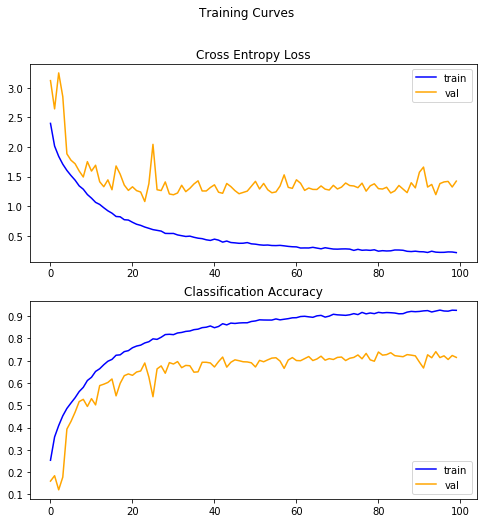


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.3796 - accuracy: 0.7167
loss: 1.38
accuracy: 0.72
--- Starting trial: run-16
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7776 - accuracy: 0.1621 - val_loss: 2.9922 - val_accuracy: 0.0875
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4840 - accuracy: 0.2427 - val_loss: 3.0107 - val_accuracy: 0.0437
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3656 - accuracy: 0.2656 - val_loss: 3.1055 - val_accuracy: 0.0437
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2871 - accuracy: 0.3027 - val_loss: 3.3304 - val_accuracy: 0.0500
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2267 - accuracy: 0.3130 - val_loss: 

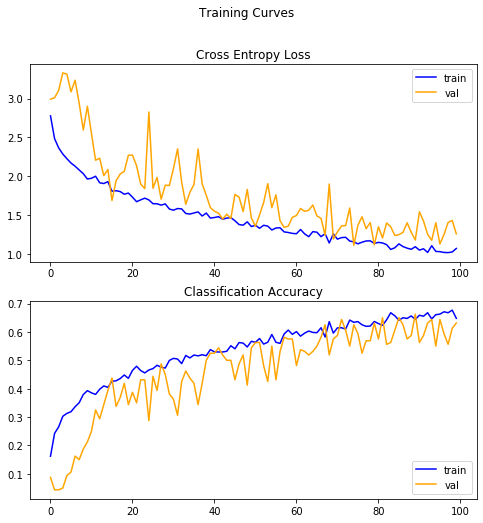


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.1397 - accuracy: 0.6333
loss: 1.14
accuracy: 0.63
--- Starting trial: run-17
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6132 - accuracy: 0.2117 - val_loss: 3.0186 - val_accuracy: 0.0562
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2907 - accuracy: 0.2998 - val_loss: 3.0587 - val_accuracy: 0.0688
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1068 - accuracy: 0.3540 - val_loss: 3.3402 - val_accuracy: 0.0781
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1001 - accuracy: 0.3511 - val_loss: 3.8766 - val_accuracy: 0.0562
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0096 - accuracy: 0.3760 - val_loss: 4

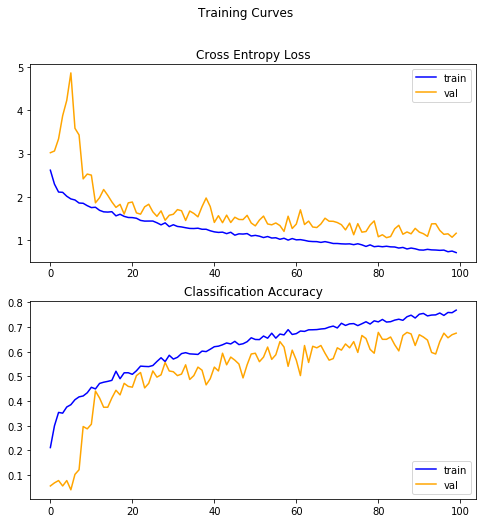


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1736 - accuracy: 0.6615
loss: 1.17
accuracy: 0.66
--- Starting trial: run-18
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4983 - accuracy: 0.2373 - val_loss: 3.0271 - val_accuracy: 0.0672
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1521 - accuracy: 0.3398 - val_loss: 3.2507 - val_accuracy: 0.0531
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9862 - accuracy: 0.3838 - val_loss: 3.4472 - val_accuracy: 0.0734
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9034 - accuracy: 0.4073 - val_loss: 3.9144 - val_accuracy: 0.0547
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7946 - accuracy: 0.4371 - val_loss: 

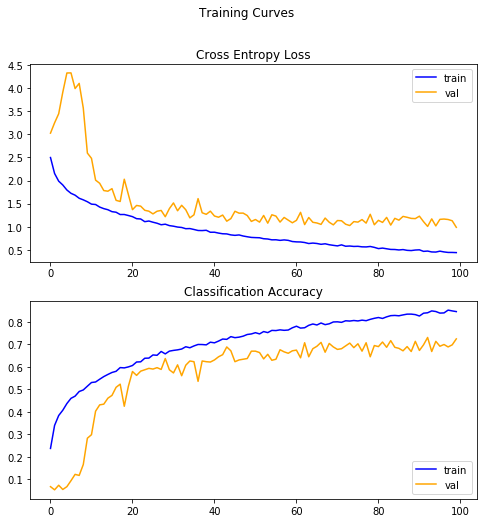


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.0589 - accuracy: 0.7164
loss: 1.06
accuracy: 0.72
--- Starting trial: run-19
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.4456 - accuracy: 0.2572 - val_loss: 3.0131 - val_accuracy: 0.0578
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0577 - accuracy: 0.3685 - val_loss: 3.1912 - val_accuracy: 0.0578
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8820 - accuracy: 0.4122 - val_loss: 3.4991 - val_accuracy: 0.0578
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7686 - accuracy: 0.4473 - val_loss: 3.9492 - val_accuracy: 0.0586
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6861 - accuracy: 0.4736 - val_loss: 

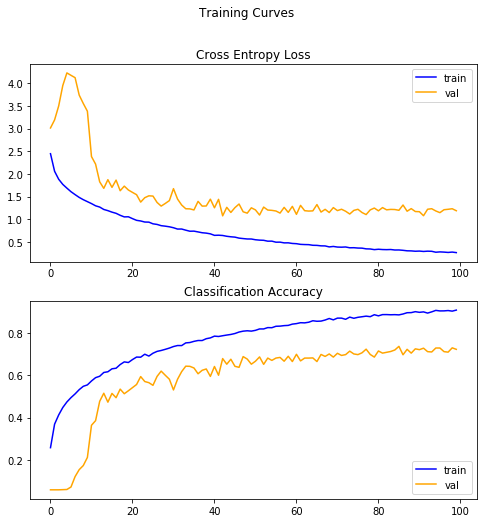


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.2021 - accuracy: 0.7083
loss: 1.20
accuracy: 0.71
--- Starting trial: run-20
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7282 - accuracy: 0.1812 - val_loss: 3.0189 - val_accuracy: 0.0562
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3984 - accuracy: 0.2544 - val_loss: 3.0267 - val_accuracy: 0.0750
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2891 - accuracy: 0.2793 - val_loss: 3.4965 - val_accuracy: 0.0500
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2308 - accuracy: 0.3047 - val_loss: 3.5323 - val_accuracy: 0.0688
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1516 - accuracy: 0.3193 - val_loss: 3

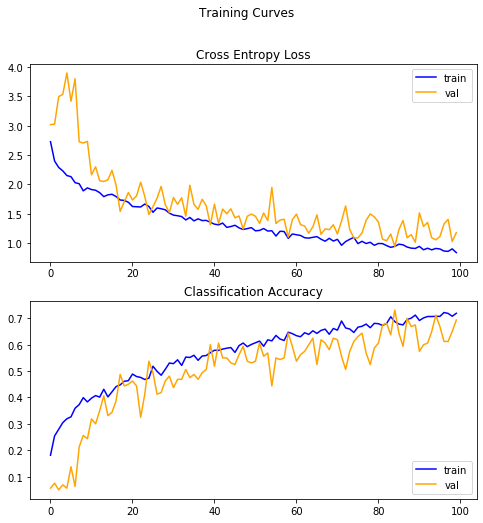


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.0636 - accuracy: 0.6781
loss: 1.06
accuracy: 0.68
--- Starting trial: run-21
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5929 - accuracy: 0.2283 - val_loss: 3.0629 - val_accuracy: 0.0437
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2509 - accuracy: 0.2949 - val_loss: 3.3397 - val_accuracy: 0.0562
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1324 - accuracy: 0.3367 - val_loss: 3.6274 - val_accuracy: 0.0875
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9982 - accuracy: 0.3806 - val_loss: 3.6424 - val_accuracy: 0.0562
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8892 - accuracy: 0.4065 - val_loss: 3.

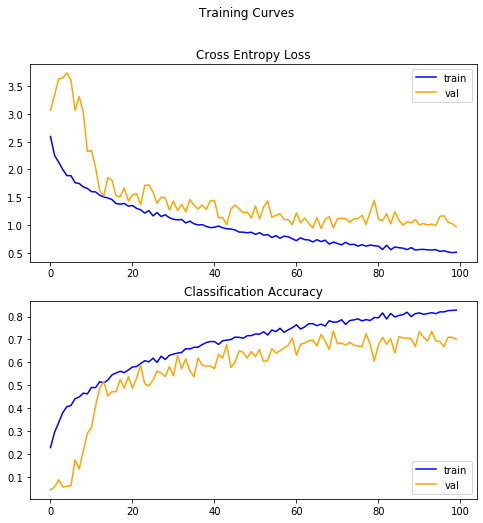


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0940 - accuracy: 0.6990
loss: 1.09
accuracy: 0.70
--- Starting trial: run-22
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4636 - accuracy: 0.2529 - val_loss: 3.1187 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0782 - accuracy: 0.3593 - val_loss: 3.5366 - val_accuracy: 0.0719
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9186 - accuracy: 0.3967 - val_loss: 4.1626 - val_accuracy: 0.0562
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8151 - accuracy: 0.4294 - val_loss: 4.3663 - val_accuracy: 0.0609
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7250 - accuracy: 0.4510 - val_loss: 3

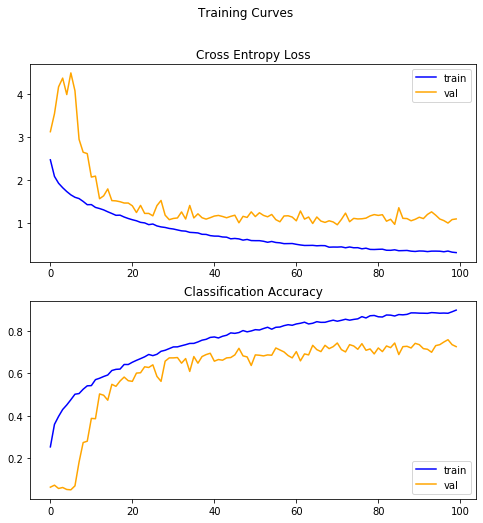


Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.0911 - accuracy: 0.7104
loss: 1.09
accuracy: 0.71
--- Starting trial: run-23
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2882 - accuracy: 0.2877 - val_loss: 3.1472 - val_accuracy: 0.0516
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9165 - accuracy: 0.4009 - val_loss: 3.7538 - val_accuracy: 0.0523
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7442 - accuracy: 0.4523 - val_loss: 4.6960 - val_accuracy: 0.0578
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6443 - accuracy: 0.4778 - val_loss: 5.6357 - val_accuracy: 0.0586
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5290 - accuracy: 0.5105 - val_loss: 4

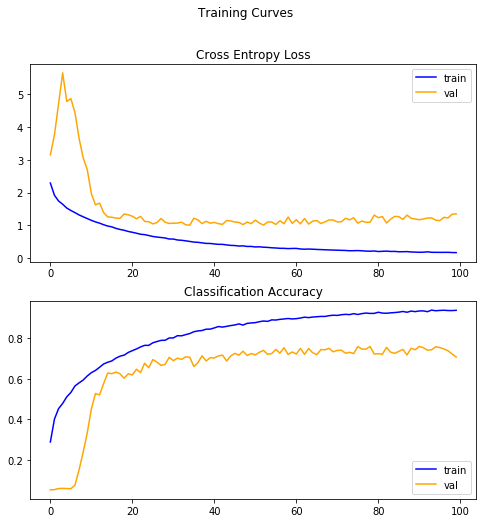


Test set evaluation metrics
30/30 [==============================] - 0s 14ms/step - loss: 1.3421 - accuracy: 0.7105
loss: 1.34
accuracy: 0.71
--- Starting trial: run-24
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7749 - accuracy: 0.1919 - val_loss: 3.0839 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4197 - accuracy: 0.2466 - val_loss: 4.0800 - val_accuracy: 0.0625
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3752 - accuracy: 0.2642 - val_loss: 5.0209 - val_accuracy: 0.0188
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2356 - accuracy: 0.3062 - val_loss: 3.9030 - val_accuracy: 0.0500
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1400 - accuracy: 0.3345 - val_loss: 

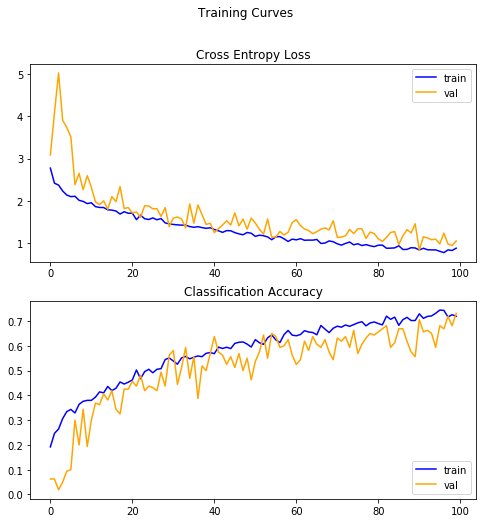


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.0454 - accuracy: 0.6646
loss: 1.05
accuracy: 0.66
--- Starting trial: run-25
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6083 - accuracy: 0.2170 - val_loss: 3.0488 - val_accuracy: 0.0531
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3056 - accuracy: 0.2705 - val_loss: 3.2769 - val_accuracy: 0.0562
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1869 - accuracy: 0.3191 - val_loss: 3.3407 - val_accuracy: 0.0875
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0400 - accuracy: 0.3464 - val_loss: 3.2011 - val_accuracy: 0.0594
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9499 - accuracy: 0.3857 - val_loss: 3

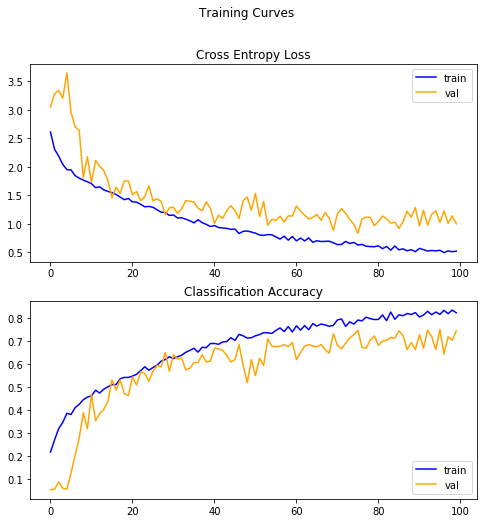


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0689 - accuracy: 0.7083
loss: 1.07
accuracy: 0.71
--- Starting trial: run-26
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4757 - accuracy: 0.2327 - val_loss: 3.1185 - val_accuracy: 0.0672
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1088 - accuracy: 0.3345 - val_loss: 3.5961 - val_accuracy: 0.0625
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9477 - accuracy: 0.3817 - val_loss: 3.5393 - val_accuracy: 0.0672
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8566 - accuracy: 0.4086 - val_loss: 3.7400 - val_accuracy: 0.1172
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7379 - accuracy: 0.4393 - val_loss: 

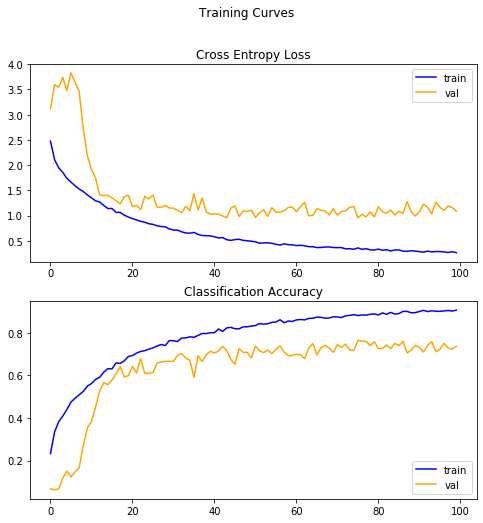


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.0786 - accuracy: 0.7299
loss: 1.08
accuracy: 0.73
--- Starting trial: run-27
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3093 - accuracy: 0.2852 - val_loss: 3.3194 - val_accuracy: 0.0594
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8933 - accuracy: 0.3988 - val_loss: 4.1526 - val_accuracy: 0.0609
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6989 - accuracy: 0.4585 - val_loss: 4.3949 - val_accuracy: 0.0562
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5859 - accuracy: 0.4959 - val_loss: 4.7969 - val_accuracy: 0.0586
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.4717 - accuracy: 0.5266 - val_loss: 

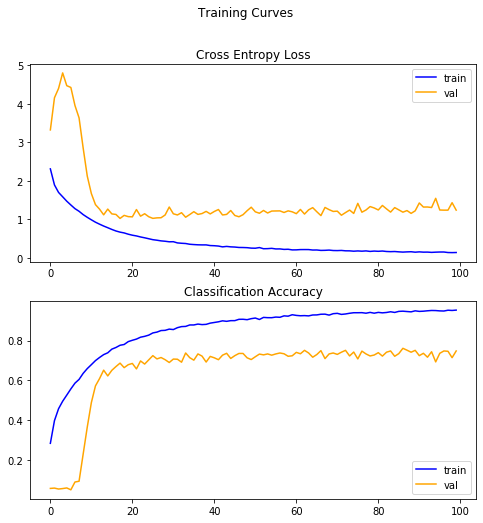


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.2218 - accuracy: 0.7496
loss: 1.22
accuracy: 0.75
--- Starting trial: run-28
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8022 - accuracy: 0.1826 - val_loss: 3.0630 - val_accuracy: 0.1250
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5193 - accuracy: 0.2188 - val_loss: 3.3079 - val_accuracy: 0.0562
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3847 - accuracy: 0.2554 - val_loss: 3.8813 - val_accuracy: 0.0312
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2607 - accuracy: 0.2866 - val_loss: 2.9359 - val_accuracy: 0.1250
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2227 - accuracy: 0.2729 - val_loss: 2

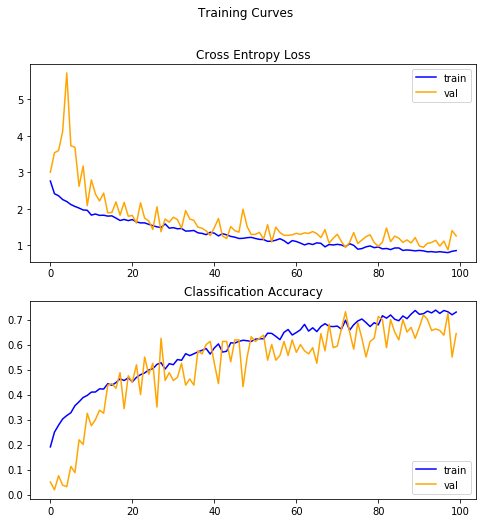


Test set evaluation metrics
30/30 [==============================] - 0s 4ms/step - loss: 0.9941 - accuracy: 0.6854
loss: 0.99
accuracy: 0.69
--- Starting trial: run-1
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6075 - accuracy: 0.2119 - val_loss: 2.9972 - val_accuracy: 0.0562
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2972 - accuracy: 0.2983 - val_loss: 3.3849 - val_accuracy: 0.0719
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1009 - accuracy: 0.3440 - val_loss: 4.0411 - val_accuracy: 0.0500
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0553 - accuracy: 0.3601 - val_loss: 3.9444 - val_accuracy: 0.0656
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9447 - accuracy: 0.3813 - val_loss: 4.20

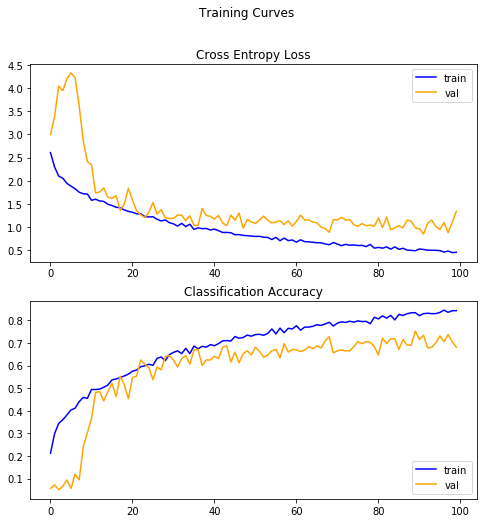


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1502 - accuracy: 0.6833
loss: 1.15
accuracy: 0.68
--- Starting trial: run-2
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4446 - accuracy: 0.2577 - val_loss: 3.0820 - val_accuracy: 0.0688
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0354 - accuracy: 0.3672 - val_loss: 3.5294 - val_accuracy: 0.0484
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9018 - accuracy: 0.3982 - val_loss: 4.0286 - val_accuracy: 0.0594
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7824 - accuracy: 0.4343 - val_loss: 4.4217 - val_accuracy: 0.0641
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.6803 - accuracy: 0.4689 - val_loss: 4.2

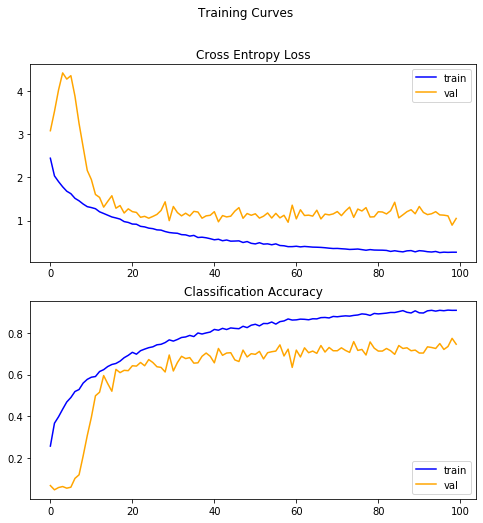


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.1291 - accuracy: 0.7424
loss: 1.13
accuracy: 0.74
--- Starting trial: run-3
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3170 - accuracy: 0.2870 - val_loss: 3.1132 - val_accuracy: 0.0484
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8918 - accuracy: 0.4019 - val_loss: 3.4496 - val_accuracy: 0.0539
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6931 - accuracy: 0.4615 - val_loss: 4.4620 - val_accuracy: 0.0594
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5446 - accuracy: 0.5056 - val_loss: 4.2836 - val_accuracy: 0.0695
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.4545 - accuracy: 0.5335 - val_loss: 4.1

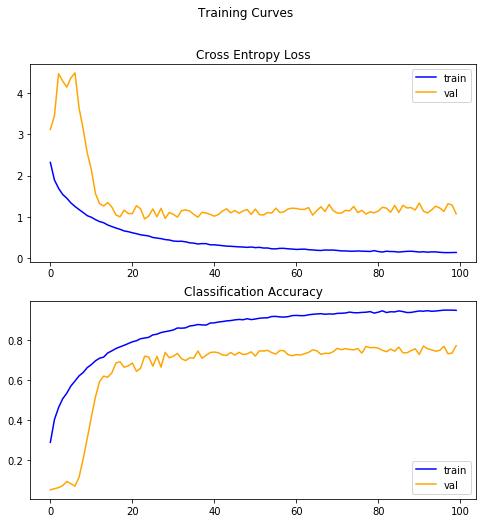


Test set evaluation metrics
30/30 [==============================] - 0s 12ms/step - loss: 1.1705 - accuracy: 0.7583
loss: 1.17
accuracy: 0.76
--- Starting trial: run-4
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8085 - accuracy: 0.1821 - val_loss: 2.9757 - val_accuracy: 0.1125
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5387 - accuracy: 0.2217 - val_loss: 3.4525 - val_accuracy: 0.1187
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3262 - accuracy: 0.2764 - val_loss: 3.2500 - val_accuracy: 0.0375
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2702 - accuracy: 0.2920 - val_loss: 4.3433 - val_accuracy: 0.0812
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1845 - accuracy: 0.3115 - val_loss: 3.24

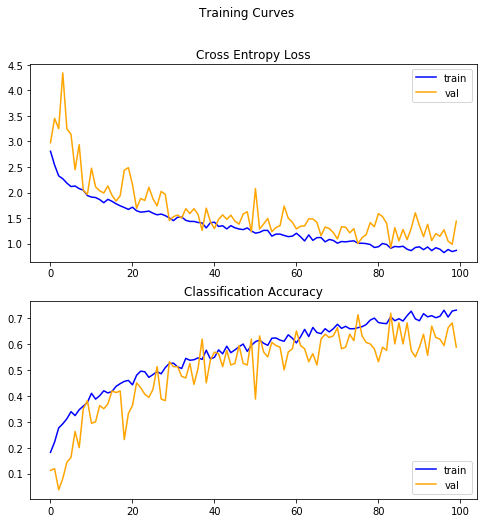


Test set evaluation metrics
30/30 [==============================] - 0s 4ms/step - loss: 1.1284 - accuracy: 0.6750
loss: 1.13
accuracy: 0.68
--- Starting trial: run-5
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6024 - accuracy: 0.2178 - val_loss: 3.0346 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2603 - accuracy: 0.2957 - val_loss: 3.4176 - val_accuracy: 0.0531
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0782 - accuracy: 0.3523 - val_loss: 4.2430 - val_accuracy: 0.0750
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0091 - accuracy: 0.3650 - val_loss: 3.8296 - val_accuracy: 0.0875
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9075 - accuracy: 0.3938 - val_loss: 3.347

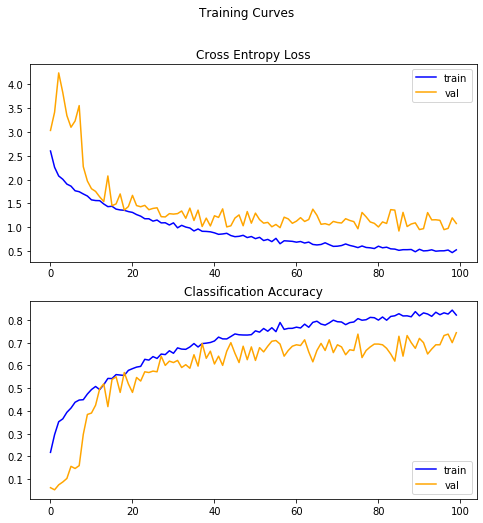


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1182 - accuracy: 0.7094
loss: 1.12
accuracy: 0.71
--- Starting trial: run-6
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4225 - accuracy: 0.2546 - val_loss: 3.2417 - val_accuracy: 0.0516
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0563 - accuracy: 0.3573 - val_loss: 4.3248 - val_accuracy: 0.0672
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8997 - accuracy: 0.3965 - val_loss: 5.2324 - val_accuracy: 0.0719
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7782 - accuracy: 0.4366 - val_loss: 5.6752 - val_accuracy: 0.0578
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.6869 - accuracy: 0.4630 - val_loss: 6.31

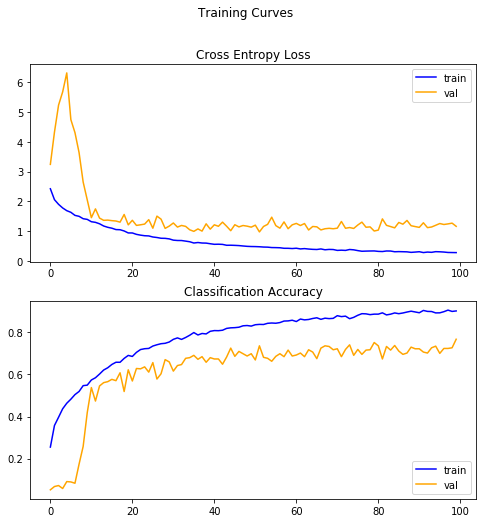


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.2030 - accuracy: 0.7411
loss: 1.20
accuracy: 0.74
--- Starting trial: run-7
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2491 - accuracy: 0.2999 - val_loss: 3.2644 - val_accuracy: 0.0500
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8437 - accuracy: 0.4119 - val_loss: 3.9096 - val_accuracy: 0.0500
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6735 - accuracy: 0.4639 - val_loss: 4.4678 - val_accuracy: 0.0508
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5119 - accuracy: 0.5125 - val_loss: 4.7745 - val_accuracy: 0.0492
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.3920 - accuracy: 0.5492 - val_loss: 5.13

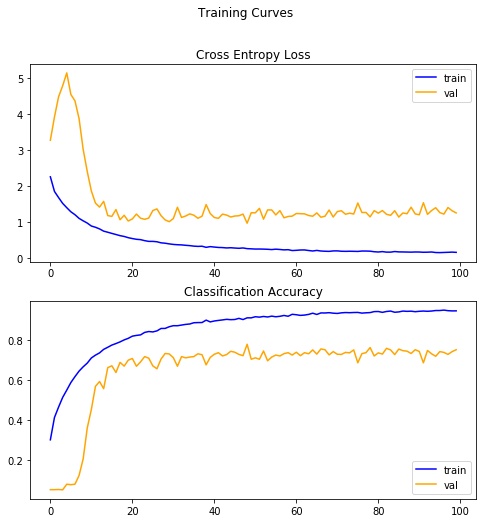


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.2761 - accuracy: 0.7393
loss: 1.28
accuracy: 0.74
--- Starting trial: run-8
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8594 - accuracy: 0.1455 - val_loss: 2.8161 - val_accuracy: 0.0875
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5146 - accuracy: 0.2207 - val_loss: 3.1748 - val_accuracy: 0.1312
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4176 - accuracy: 0.2329 - val_loss: 2.8516 - val_accuracy: 0.1875
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3449 - accuracy: 0.2642 - val_loss: 2.6449 - val_accuracy: 0.1688
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2664 - accuracy: 0.2822 - val_loss: 2.2

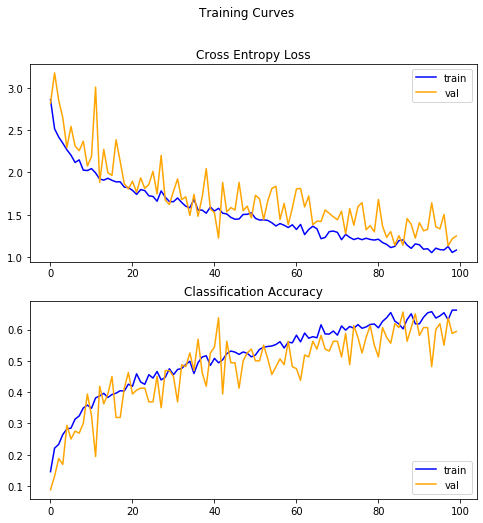


Test set evaluation metrics
30/30 [==============================] - 0s 4ms/step - loss: 1.1606 - accuracy: 0.6354
loss: 1.16
accuracy: 0.64
--- Starting trial: run-9
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6163 - accuracy: 0.2090 - val_loss: 3.0237 - val_accuracy: 0.1500
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3372 - accuracy: 0.2634 - val_loss: 2.8530 - val_accuracy: 0.1625
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1739 - accuracy: 0.3069 - val_loss: 2.4145 - val_accuracy: 0.2594
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1362 - accuracy: 0.3330 - val_loss: 2.2696 - val_accuracy: 0.2750
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9750 - accuracy: 0.3672 - val_loss: 2.39

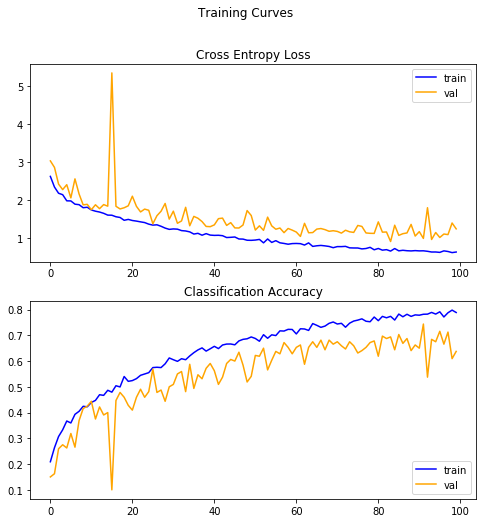


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0582 - accuracy: 0.6964
loss: 1.06
accuracy: 0.70
--- Starting trial: run-10
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4751 - accuracy: 0.2428 - val_loss: 2.9216 - val_accuracy: 0.1172
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1095 - accuracy: 0.3387 - val_loss: 4.1262 - val_accuracy: 0.0500
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9835 - accuracy: 0.3718 - val_loss: 3.3984 - val_accuracy: 0.0734
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9096 - accuracy: 0.3903 - val_loss: 2.7814 - val_accuracy: 0.1656
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8133 - accuracy: 0.4241 - val_loss: 3.

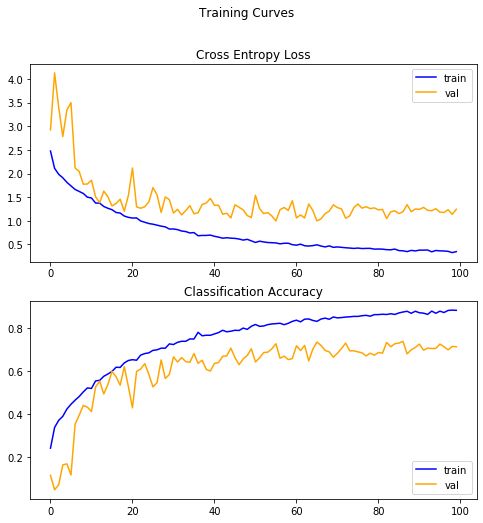


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.2500 - accuracy: 0.7016
loss: 1.25
accuracy: 0.70
--- Starting trial: run-11
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3252 - accuracy: 0.2753 - val_loss: 2.7173 - val_accuracy: 0.1680
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9427 - accuracy: 0.3786 - val_loss: 3.2618 - val_accuracy: 0.0688
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7390 - accuracy: 0.4415 - val_loss: 3.5195 - val_accuracy: 0.0867
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5911 - accuracy: 0.4861 - val_loss: 4.2179 - val_accuracy: 0.0445
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.4959 - accuracy: 0.5185 - val_loss: 3.

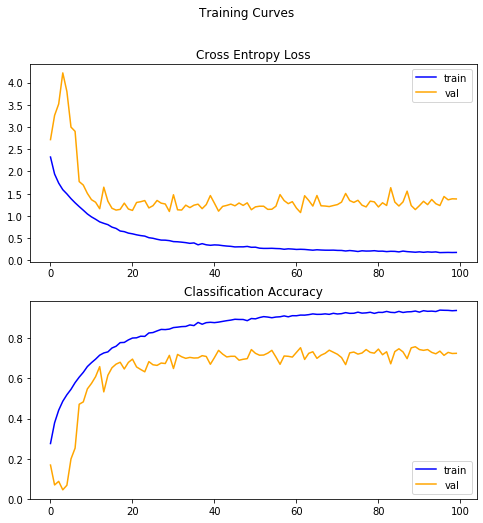


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.3657 - accuracy: 0.7234
loss: 1.37
accuracy: 0.72
--- Starting trial: run-12
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.9749 - accuracy: 0.1440 - val_loss: 8.0289 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5844 - accuracy: 0.1978 - val_loss: 6.0872 - val_accuracy: 0.0938
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5107 - accuracy: 0.2002 - val_loss: 2.4446 - val_accuracy: 0.2438
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4003 - accuracy: 0.2568 - val_loss: 3.8938 - val_accuracy: 0.1500
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3383 - accuracy: 0.2456 - val_loss: 2.6

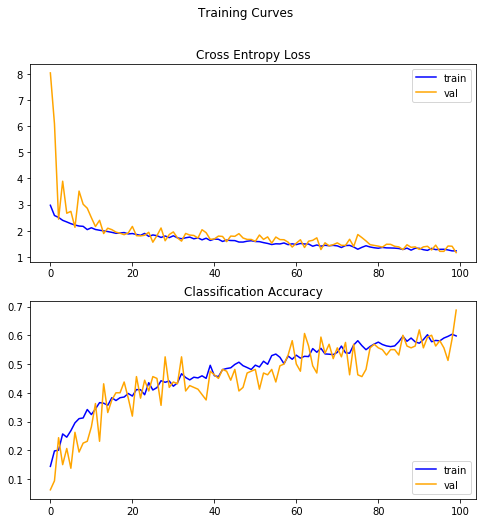


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.3363 - accuracy: 0.5854
loss: 1.34
accuracy: 0.59
--- Starting trial: run-13
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7699 - accuracy: 0.1736 - val_loss: 5.8275 - val_accuracy: 0.1375
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4048 - accuracy: 0.2317 - val_loss: 2.7679 - val_accuracy: 0.1625
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2626 - accuracy: 0.2810 - val_loss: 2.6750 - val_accuracy: 0.2094
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1688 - accuracy: 0.3062 - val_loss: 4.0724 - val_accuracy: 0.1750
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1003 - accuracy: 0.3289 - val_loss: 2.90

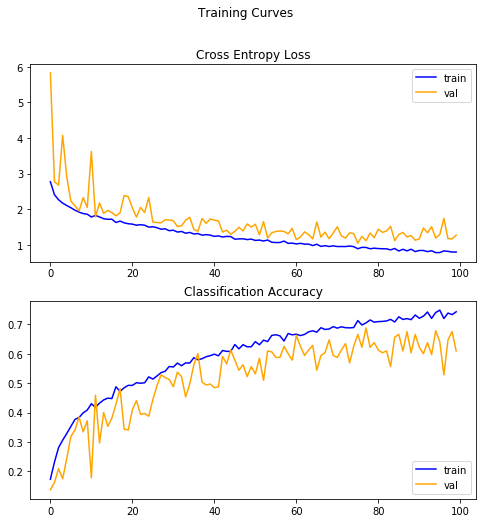


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1930 - accuracy: 0.6427
loss: 1.19
accuracy: 0.64
--- Starting trial: run-14
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5837 - accuracy: 0.2104 - val_loss: 3.5507 - val_accuracy: 0.1125
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2014 - accuracy: 0.3000 - val_loss: 2.2805 - val_accuracy: 0.2750
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0648 - accuracy: 0.3326 - val_loss: 3.0517 - val_accuracy: 0.1719
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9260 - accuracy: 0.3823 - val_loss: 2.1635 - val_accuracy: 0.2922
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8487 - accuracy: 0.4044 - val_loss: 2.3

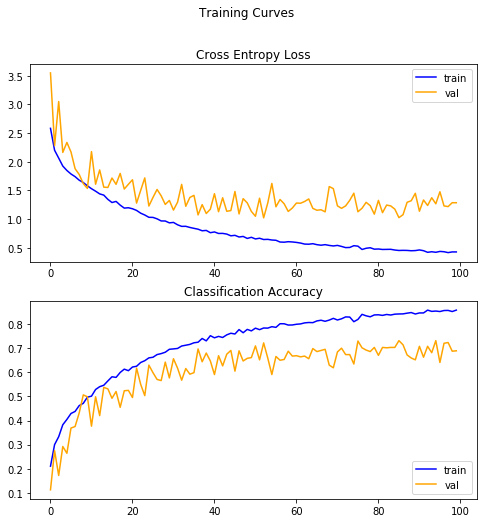


Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.2953 - accuracy: 0.6872
loss: 1.30
accuracy: 0.69
--- Starting trial: run-15
{'num_units': 64, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3982 - accuracy: 0.2531 - val_loss: 3.1218 - val_accuracy: 0.1594
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0150 - accuracy: 0.3577 - val_loss: 2.6436 - val_accuracy: 0.1836
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8411 - accuracy: 0.4088 - val_loss: 3.2521 - val_accuracy: 0.1203
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7080 - accuracy: 0.4525 - val_loss: 2.8506 - val_accuracy: 0.1773
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6029 - accuracy: 0.4857 - val_loss: 1.8

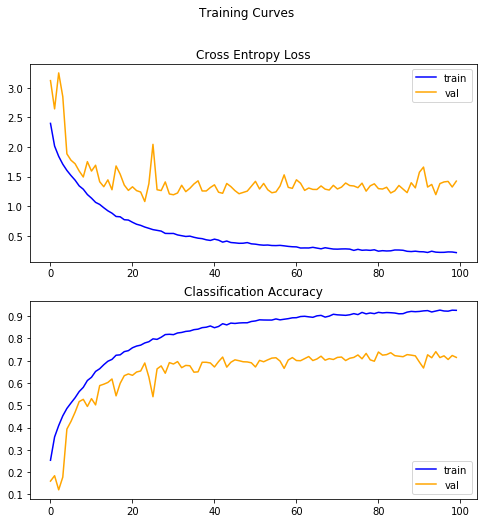


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.3796 - accuracy: 0.7167
loss: 1.38
accuracy: 0.72
--- Starting trial: run-16
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7776 - accuracy: 0.1621 - val_loss: 2.9922 - val_accuracy: 0.0875
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4840 - accuracy: 0.2427 - val_loss: 3.0107 - val_accuracy: 0.0437
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3656 - accuracy: 0.2656 - val_loss: 3.1055 - val_accuracy: 0.0437
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2871 - accuracy: 0.3027 - val_loss: 3.3304 - val_accuracy: 0.0500
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2267 - accuracy: 0.3130 - val_loss: 

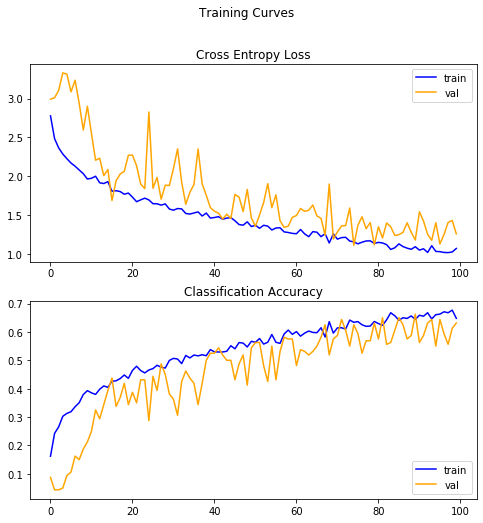


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.1397 - accuracy: 0.6333
loss: 1.14
accuracy: 0.63
--- Starting trial: run-17
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6132 - accuracy: 0.2117 - val_loss: 3.0186 - val_accuracy: 0.0562
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2907 - accuracy: 0.2998 - val_loss: 3.0587 - val_accuracy: 0.0688
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1068 - accuracy: 0.3540 - val_loss: 3.3402 - val_accuracy: 0.0781
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1001 - accuracy: 0.3511 - val_loss: 3.8766 - val_accuracy: 0.0562
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0096 - accuracy: 0.3760 - val_loss: 4

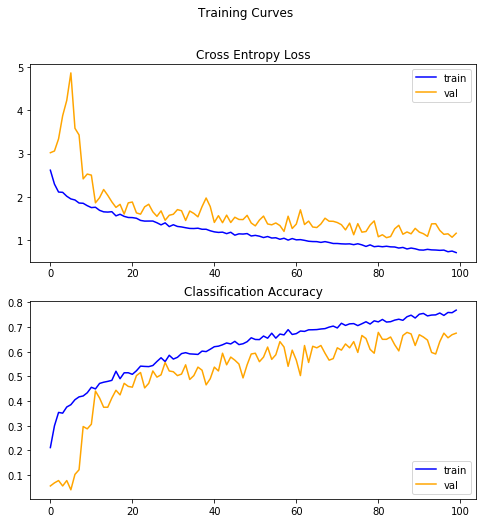


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1736 - accuracy: 0.6615
loss: 1.17
accuracy: 0.66
--- Starting trial: run-18
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4983 - accuracy: 0.2373 - val_loss: 3.0271 - val_accuracy: 0.0672
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1521 - accuracy: 0.3398 - val_loss: 3.2507 - val_accuracy: 0.0531
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9862 - accuracy: 0.3838 - val_loss: 3.4472 - val_accuracy: 0.0734
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9034 - accuracy: 0.4073 - val_loss: 3.9144 - val_accuracy: 0.0547
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7946 - accuracy: 0.4371 - val_loss: 

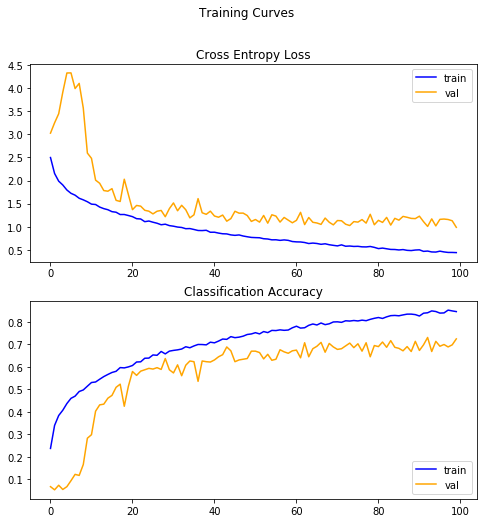


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.0589 - accuracy: 0.7164
loss: 1.06
accuracy: 0.72
--- Starting trial: run-19
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.4456 - accuracy: 0.2572 - val_loss: 3.0131 - val_accuracy: 0.0578
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0577 - accuracy: 0.3685 - val_loss: 3.1912 - val_accuracy: 0.0578
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8820 - accuracy: 0.4122 - val_loss: 3.4991 - val_accuracy: 0.0578
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7686 - accuracy: 0.4473 - val_loss: 3.9492 - val_accuracy: 0.0586
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6861 - accuracy: 0.4736 - val_loss: 

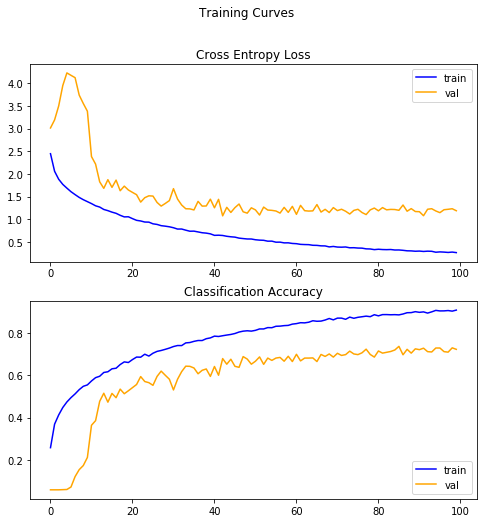


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.2021 - accuracy: 0.7083
loss: 1.20
accuracy: 0.71
--- Starting trial: run-20
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7282 - accuracy: 0.1812 - val_loss: 3.0189 - val_accuracy: 0.0562
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3984 - accuracy: 0.2544 - val_loss: 3.0267 - val_accuracy: 0.0750
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2891 - accuracy: 0.2793 - val_loss: 3.4965 - val_accuracy: 0.0500
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2308 - accuracy: 0.3047 - val_loss: 3.5323 - val_accuracy: 0.0688
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1516 - accuracy: 0.3193 - val_loss: 3

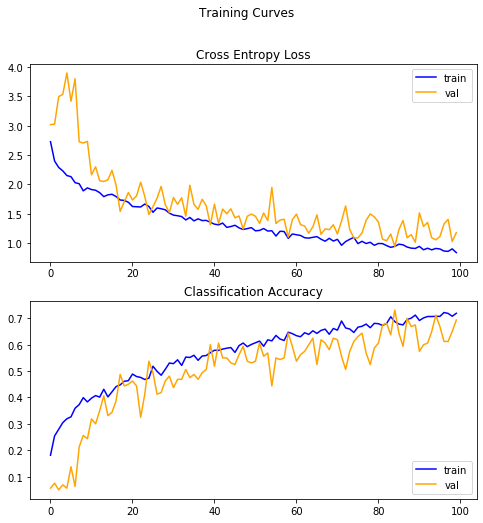


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.0636 - accuracy: 0.6781
loss: 1.06
accuracy: 0.68
--- Starting trial: run-21
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5929 - accuracy: 0.2283 - val_loss: 3.0629 - val_accuracy: 0.0437
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2509 - accuracy: 0.2949 - val_loss: 3.3397 - val_accuracy: 0.0562
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1324 - accuracy: 0.3367 - val_loss: 3.6274 - val_accuracy: 0.0875
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9982 - accuracy: 0.3806 - val_loss: 3.6424 - val_accuracy: 0.0562
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8892 - accuracy: 0.4065 - val_loss: 3.

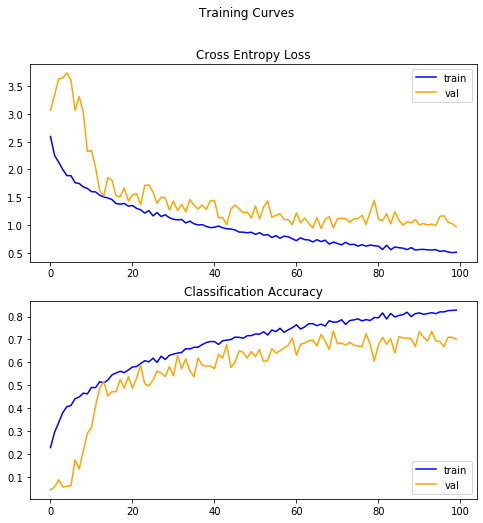


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0940 - accuracy: 0.6990
loss: 1.09
accuracy: 0.70
--- Starting trial: run-22
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4636 - accuracy: 0.2529 - val_loss: 3.1187 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0782 - accuracy: 0.3593 - val_loss: 3.5366 - val_accuracy: 0.0719
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9186 - accuracy: 0.3967 - val_loss: 4.1626 - val_accuracy: 0.0562
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8151 - accuracy: 0.4294 - val_loss: 4.3663 - val_accuracy: 0.0609
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7250 - accuracy: 0.4510 - val_loss: 3

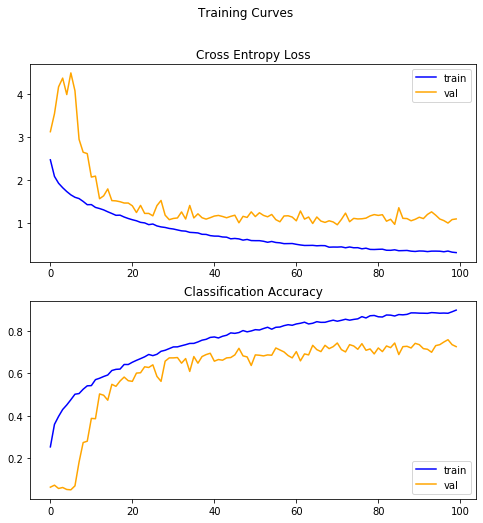


Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.0911 - accuracy: 0.7104
loss: 1.09
accuracy: 0.71
--- Starting trial: run-23
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2882 - accuracy: 0.2877 - val_loss: 3.1472 - val_accuracy: 0.0516
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9165 - accuracy: 0.4009 - val_loss: 3.7538 - val_accuracy: 0.0523
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.7442 - accuracy: 0.4523 - val_loss: 4.6960 - val_accuracy: 0.0578
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6443 - accuracy: 0.4778 - val_loss: 5.6357 - val_accuracy: 0.0586
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5290 - accuracy: 0.5105 - val_loss: 4

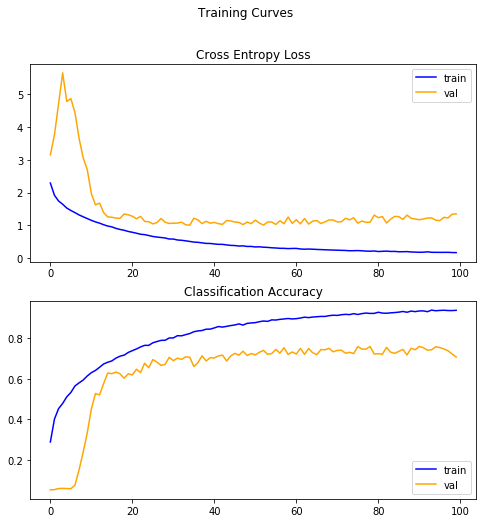


Test set evaluation metrics
30/30 [==============================] - 0s 14ms/step - loss: 1.3421 - accuracy: 0.7105
loss: 1.34
accuracy: 0.71
--- Starting trial: run-24
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7749 - accuracy: 0.1919 - val_loss: 3.0839 - val_accuracy: 0.0625
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4197 - accuracy: 0.2466 - val_loss: 4.0800 - val_accuracy: 0.0625
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3752 - accuracy: 0.2642 - val_loss: 5.0209 - val_accuracy: 0.0188
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2356 - accuracy: 0.3062 - val_loss: 3.9030 - val_accuracy: 0.0500
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1400 - accuracy: 0.3345 - val_loss: 

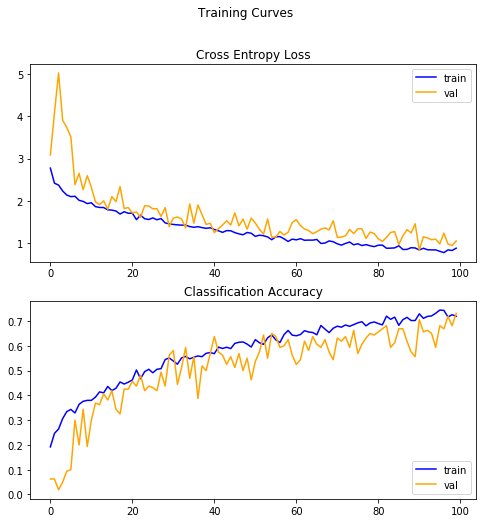


Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.0454 - accuracy: 0.6646
loss: 1.05
accuracy: 0.66
--- Starting trial: run-25
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6083 - accuracy: 0.2170 - val_loss: 3.0488 - val_accuracy: 0.0531
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3056 - accuracy: 0.2705 - val_loss: 3.2769 - val_accuracy: 0.0562
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1869 - accuracy: 0.3191 - val_loss: 3.3407 - val_accuracy: 0.0875
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0400 - accuracy: 0.3464 - val_loss: 3.2011 - val_accuracy: 0.0594
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9499 - accuracy: 0.3857 - val_loss: 3

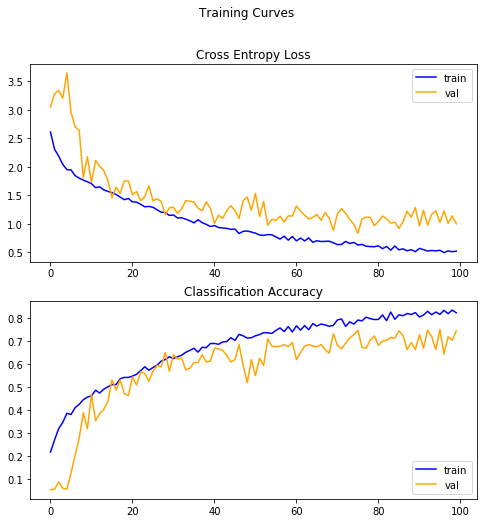


Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0689 - accuracy: 0.7083
loss: 1.07
accuracy: 0.71
--- Starting trial: run-26
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4757 - accuracy: 0.2327 - val_loss: 3.1185 - val_accuracy: 0.0672
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1088 - accuracy: 0.3345 - val_loss: 3.5961 - val_accuracy: 0.0625
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9477 - accuracy: 0.3817 - val_loss: 3.5393 - val_accuracy: 0.0672
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.8566 - accuracy: 0.4086 - val_loss: 3.7400 - val_accuracy: 0.1172
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.7379 - accuracy: 0.4393 - val_loss: 

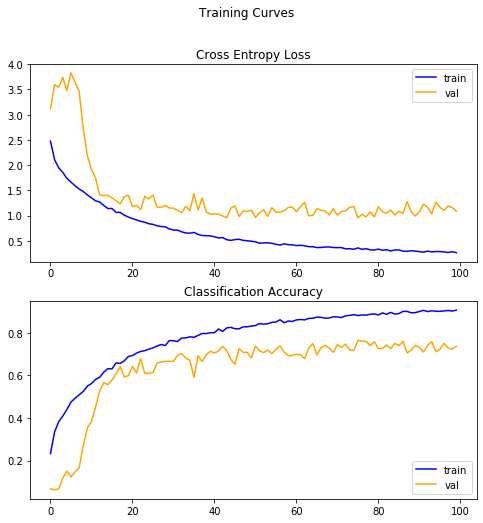


Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.0786 - accuracy: 0.7299
loss: 1.08
accuracy: 0.73
--- Starting trial: run-27
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3093 - accuracy: 0.2852 - val_loss: 3.3194 - val_accuracy: 0.0594
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8933 - accuracy: 0.3988 - val_loss: 4.1526 - val_accuracy: 0.0609
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.6989 - accuracy: 0.4585 - val_loss: 4.3949 - val_accuracy: 0.0562
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.5859 - accuracy: 0.4959 - val_loss: 4.7969 - val_accuracy: 0.0586
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.4717 - accuracy: 0.5266 - val_loss: 

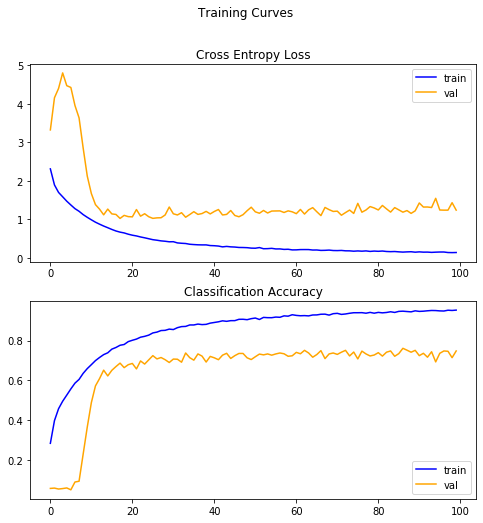


Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.2218 - accuracy: 0.7496
loss: 1.22
accuracy: 0.75
--- Starting trial: run-28
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8022 - accuracy: 0.1826 - val_loss: 3.0630 - val_accuracy: 0.1250
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5193 - accuracy: 0.2188 - val_loss: 3.3079 - val_accuracy: 0.0562
Epoch 3/100

Epoch 00003: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3847 - accuracy: 0.2554 - val_loss: 3.8813 - val_accuracy: 0.0312
Epoch 4/100

Epoch 00004: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2607 - accuracy: 0.2866 - val_loss: 2.9359 - val_accuracy: 0.1250
Epoch 5/100

Epoch 00005: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2227 - accuracy: 0.2729 - val_loss: 2

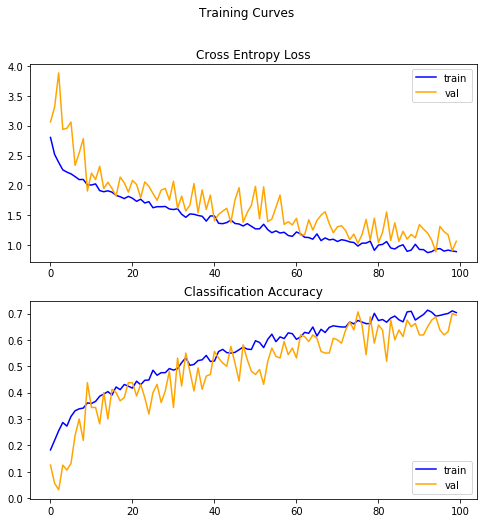

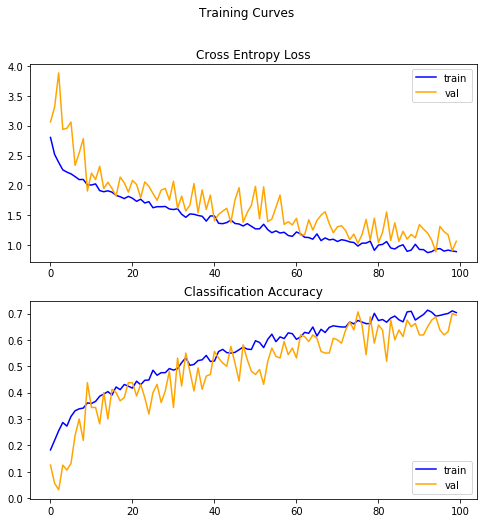


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 0.9259 - accuracy: 0.6875
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.0816 - accuracy: 0.6792
loss: 1.08
accuracy: 0.68
--- Starting trial: run-29
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 64}
loss: 1.08
accuracy: 0.68
--- Starting trial: run-29
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6745 - accuracy: 0.1873 - val_loss: 3.0537 - val_accuracy: 0.1000

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6745 - accuracy: 0.1873 - val_loss: 3.0537 - val_accuracy: 0.1000
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2970 - accuracy: 0.2725 - val_lo

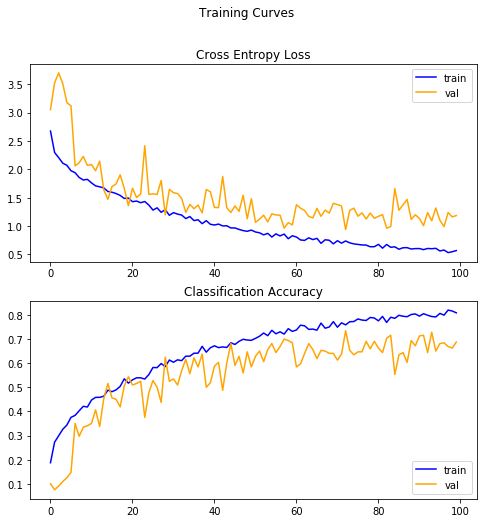

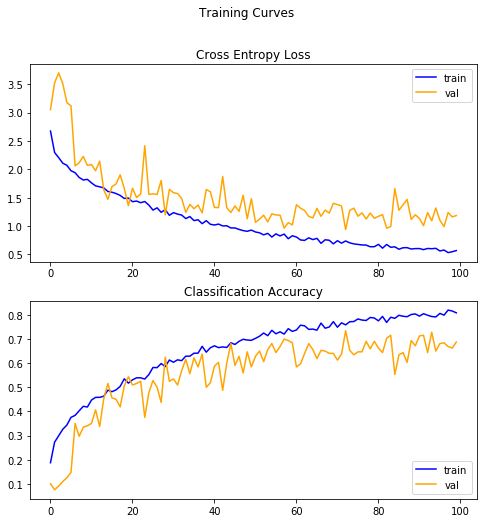


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.1517 - accuracy: 0.7188
Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0800 - accuracy: 0.6833
loss: 1.08
accuracy: 0.68
--- Starting trial: run-30
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 128}
loss: 1.08
accuracy: 0.68
--- Starting trial: run-30
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4978 - accuracy: 0.2311 - val_loss: 3.0082 - val_accuracy: 0.1219

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4978 - accuracy: 0.2311 - val_loss: 3.0082 - val_accuracy: 0.1219
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1282 - accuracy: 0.3337 - val_

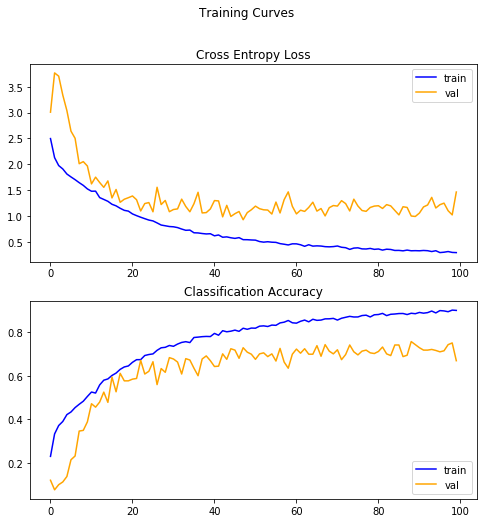

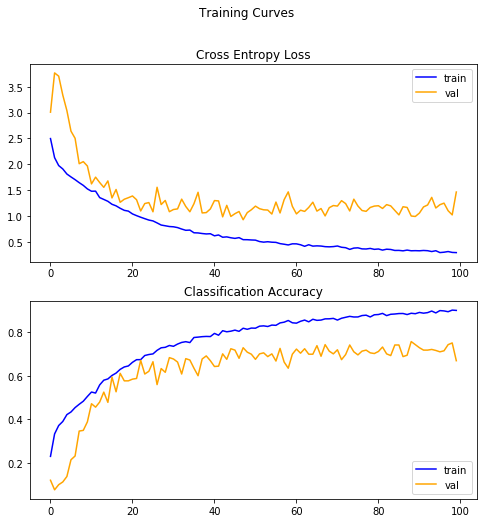


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 0.8277 - accuracy: 0.7422
Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.3940 - accuracy: 0.6961
loss: 1.39
accuracy: 0.70
--- Starting trial: run-31
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 256}
loss: 1.39
accuracy: 0.70
--- Starting trial: run-31
{'num_units': 64, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3303 - accuracy: 0.2798 - val_loss: 3.2755 - val_accuracy: 0.0734

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3303 - accuracy: 0.2798 - val_loss: 3.2755 - val_accuracy: 0.0734
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9621 - accuracy: 0.3746 - val_

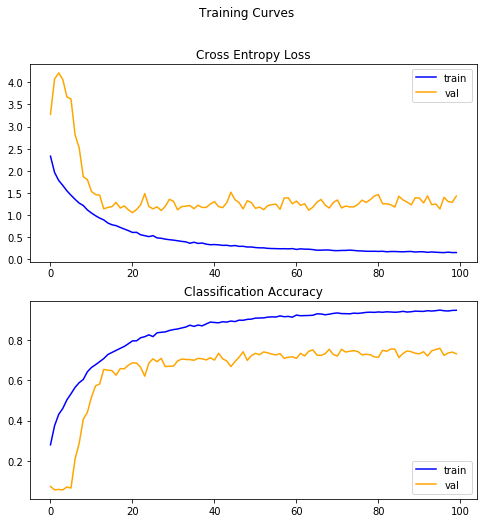

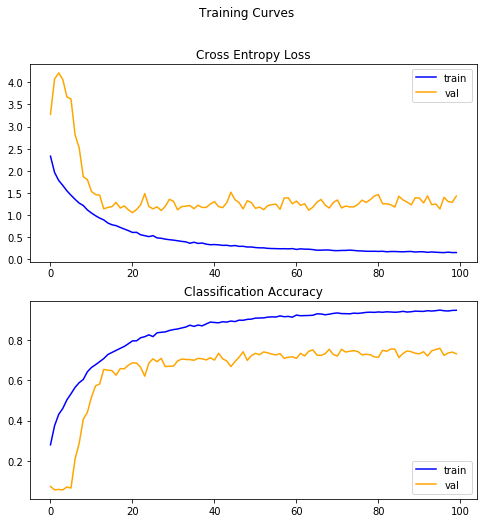


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.5815 - accuracy: 0.7344
Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.4030 - accuracy: 0.7397
loss: 1.40
accuracy: 0.74
--- Starting trial: run-32
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 32}
loss: 1.40
accuracy: 0.74
--- Starting trial: run-32
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6363 - accuracy: 0.2046 - val_loss: 3.0361 - val_accuracy: 0.0437

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6363 - accuracy: 0.2046 - val_loss: 3.0361 - val_accuracy: 0.0437
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4206 - accuracy: 0.2495 - val_l

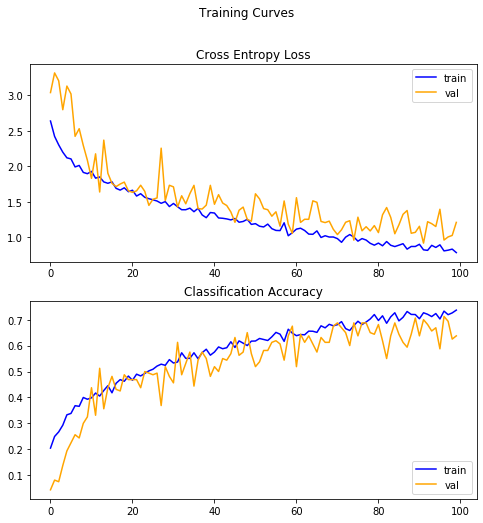

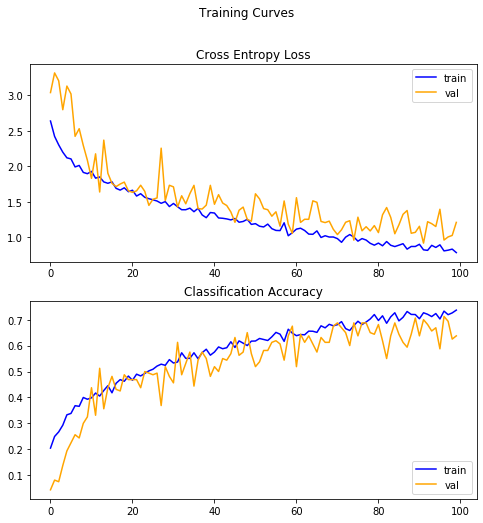


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.6202 - accuracy: 0.5625
Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.2465 - accuracy: 0.6354
loss: 1.25
accuracy: 0.64
--- Starting trial: run-33
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 64}
loss: 1.25
accuracy: 0.64
--- Starting trial: run-33
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5389 - accuracy: 0.2183 - val_loss: 3.0412 - val_accuracy: 0.0562

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5389 - accuracy: 0.2183 - val_loss: 3.0412 - val_accuracy: 0.0562
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2267 - accuracy: 0.2981 - val_lo

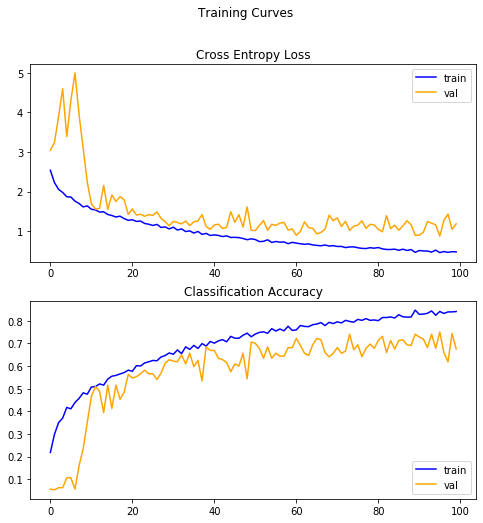

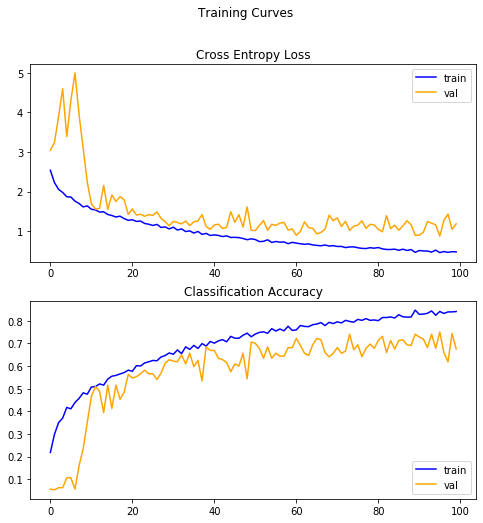


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.3655 - accuracy: 0.7344
Test set evaluation metrics
30/30 [==============================] - 0s 7ms/step - loss: 1.0920 - accuracy: 0.7036
loss: 1.09
accuracy: 0.70
--- Starting trial: run-34
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 128}
loss: 1.09
accuracy: 0.70
--- Starting trial: run-34
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4377 - accuracy: 0.2498 - val_loss: 3.0516 - val_accuracy: 0.0672

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4377 - accuracy: 0.2498 - val_loss: 3.0516 - val_accuracy: 0.0672
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0581 - accuracy: 0.3540 - val_

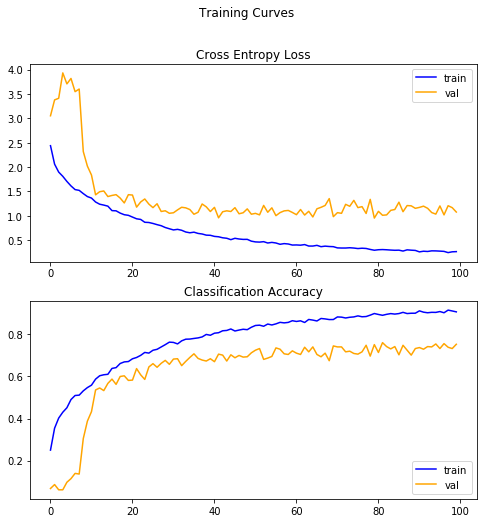

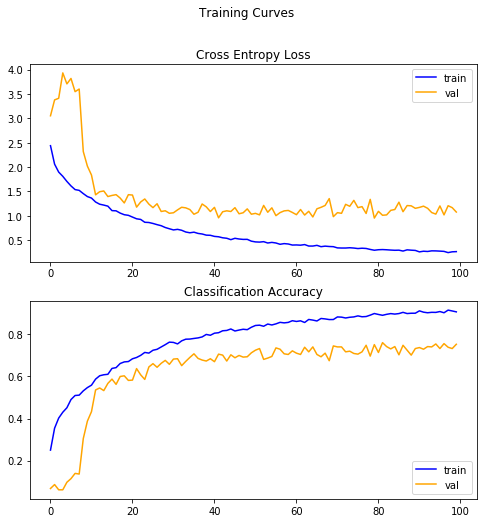


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.3509 - accuracy: 0.7422
Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.1339 - accuracy: 0.7331
loss: 1.13
accuracy: 0.73
--- Starting trial: run-35
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 256}
loss: 1.13
accuracy: 0.73
--- Starting trial: run-35
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2728 - accuracy: 0.2897 - val_loss: 3.0842 - val_accuracy: 0.0578

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2728 - accuracy: 0.2897 - val_loss: 3.0842 - val_accuracy: 0.0578
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8573 - accuracy: 0.4135 - val_

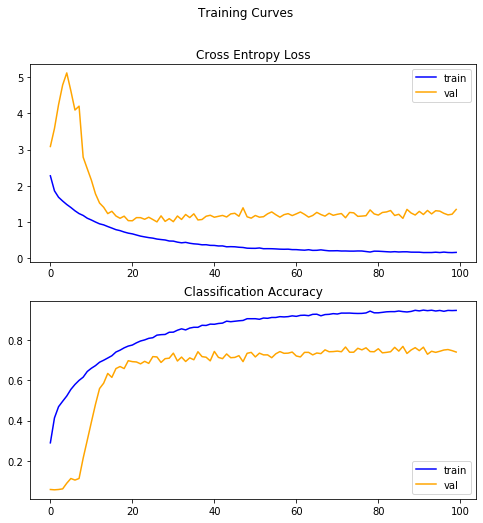

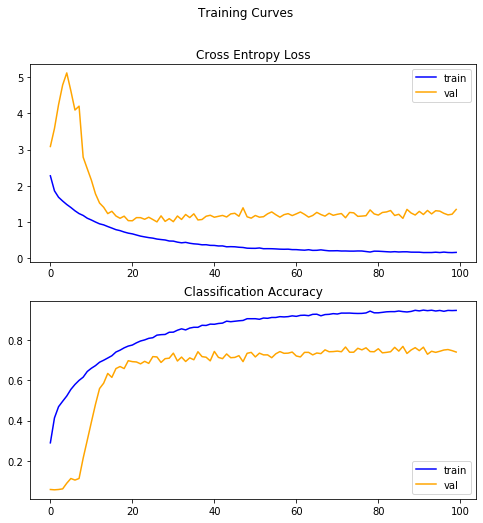


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.6172 - accuracy: 0.7031
Test set evaluation metrics
30/30 [==============================] - 0s 14ms/step - loss: 1.3315 - accuracy: 0.7436
loss: 1.33
accuracy: 0.74
--- Starting trial: run-36
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 32}
loss: 1.33
accuracy: 0.74
--- Starting trial: run-36
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7107 - accuracy: 0.1792 - val_loss: 2.9934 - val_accuracy: 0.0938

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7107 - accuracy: 0.1792 - val_loss: 2.9934 - val_accuracy: 0.0938
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4698 - accuracy: 0.2466 - val_los

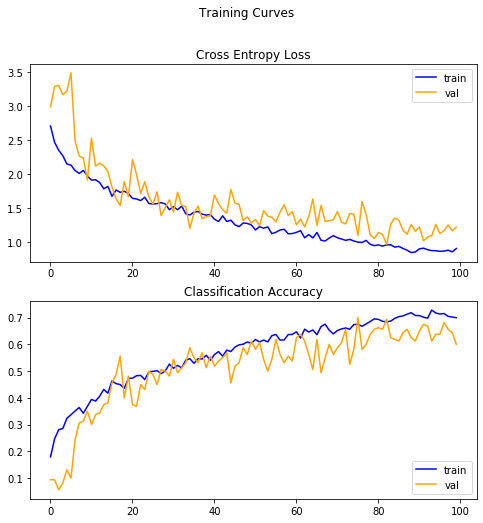

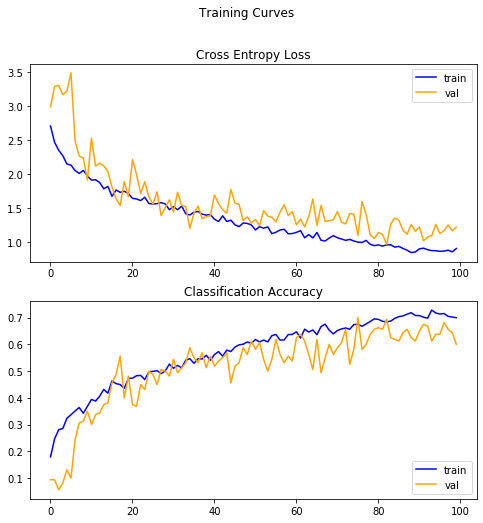


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 0.9998 - accuracy: 0.6562
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.1723 - accuracy: 0.6406
loss: 1.17
accuracy: 0.64
--- Starting trial: run-37
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 64}
loss: 1.17
accuracy: 0.64
--- Starting trial: run-37
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5270 - accuracy: 0.2197 - val_loss: 3.1049 - val_accuracy: 0.0625

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5270 - accuracy: 0.2197 - val_loss: 3.1049 - val_accuracy: 0.0625
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2351 - accuracy: 0.3010 - val_loss

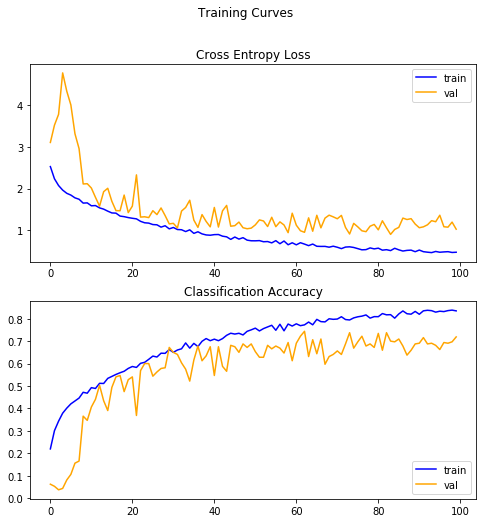

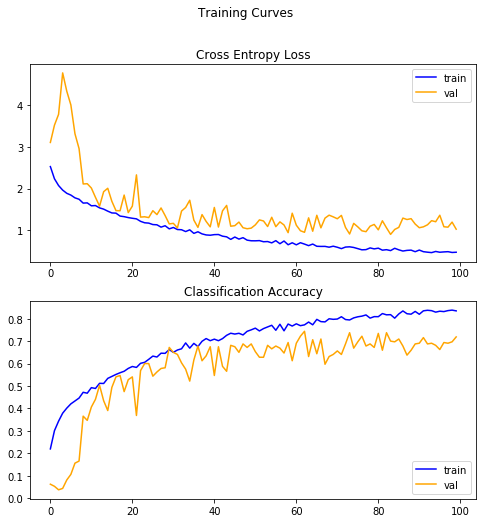


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.0334 - accuracy: 0.7344
Test set evaluation metrics
30/30 [==============================] - 0s 7ms/step - loss: 1.0433 - accuracy: 0.7255
loss: 1.04
accuracy: 0.73
--- Starting trial: run-38
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 128}
loss: 1.04
accuracy: 0.73
--- Starting trial: run-38
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.3975 - accuracy: 0.2518 - val_loss: 3.2233 - val_accuracy: 0.0531

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.3975 - accuracy: 0.2518 - val_loss: 3.2233 - val_accuracy: 0.0531
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0046 - accuracy: 0.3676 - val_lo

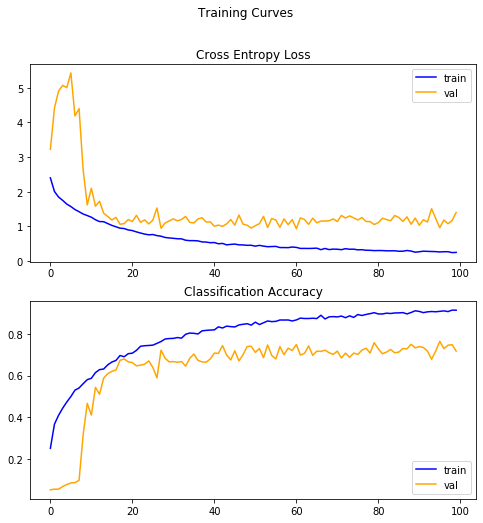

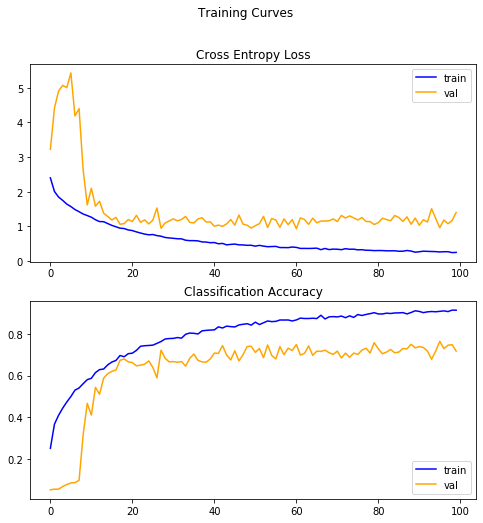


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.1494 - accuracy: 0.7344
Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.3601 - accuracy: 0.7086
loss: 1.36
accuracy: 0.71
--- Starting trial: run-39
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 256}
loss: 1.36
accuracy: 0.71
--- Starting trial: run-39
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2445 - accuracy: 0.3030 - val_loss: 3.3456 - val_accuracy: 0.0516

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2445 - accuracy: 0.3030 - val_loss: 3.3456 - val_accuracy: 0.0516
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8402 - accuracy: 0.4187 - val_lo

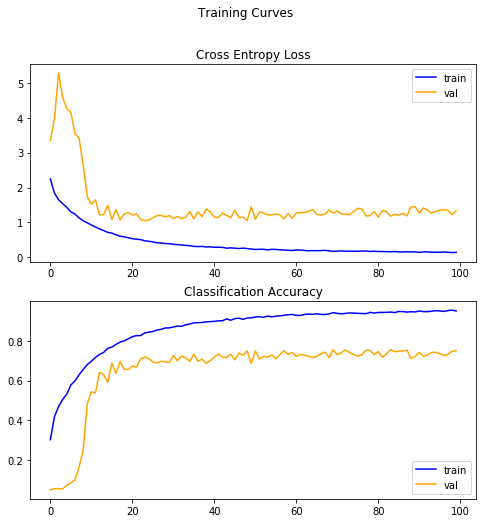

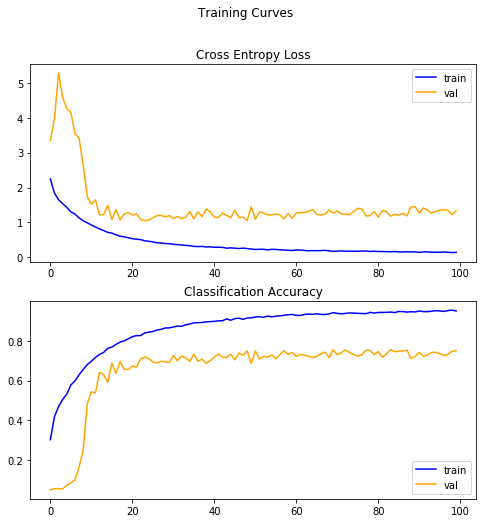


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.5622 - accuracy: 0.7227
Test set evaluation metrics
30/30 [==============================] - 0s 14ms/step - loss: 1.2573 - accuracy: 0.7572
loss: 1.26
accuracy: 0.76
--- Starting trial: run-40
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 32}
loss: 1.26
accuracy: 0.76
--- Starting trial: run-40
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8341 - accuracy: 0.1724 - val_loss: 2.6878 - val_accuracy: 0.1312

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8341 - accuracy: 0.1724 - val_loss: 2.6878 - val_accuracy: 0.1312
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5341 - accuracy: 0.2158 - val_l

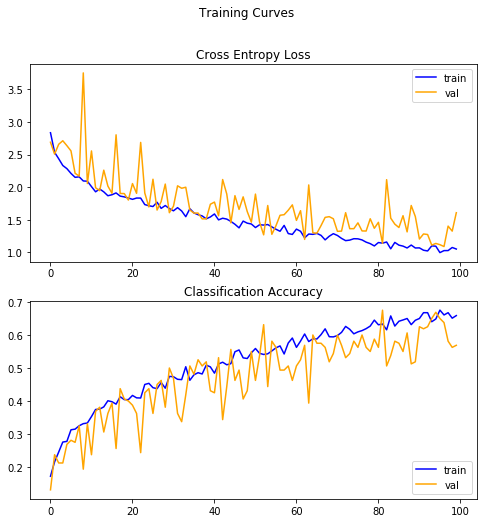

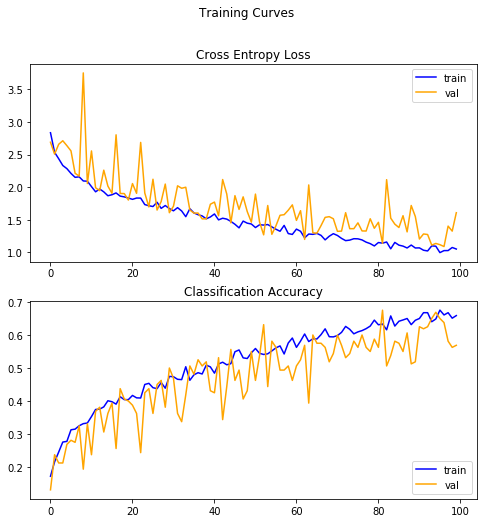


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.1724 - accuracy: 0.7188
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.2593 - accuracy: 0.6250
loss: 1.26
accuracy: 0.62
--- Starting trial: run-41
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 64}
loss: 1.26
accuracy: 0.62
--- Starting trial: run-41
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6213 - accuracy: 0.2102 - val_loss: 2.7215 - val_accuracy: 0.1625

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6213 - accuracy: 0.2102 - val_loss: 2.7215 - val_accuracy: 0.1625
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3451 - accuracy: 0.2625 - val_lo

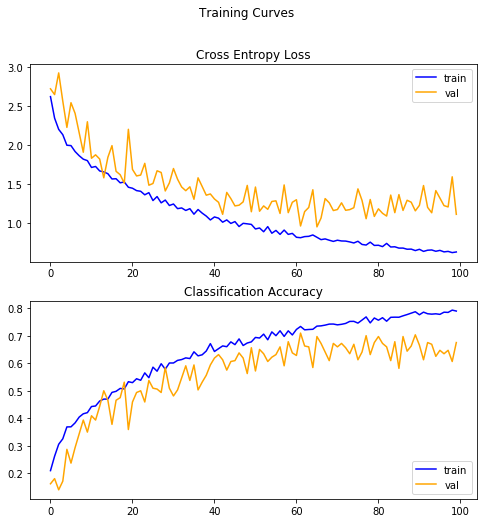

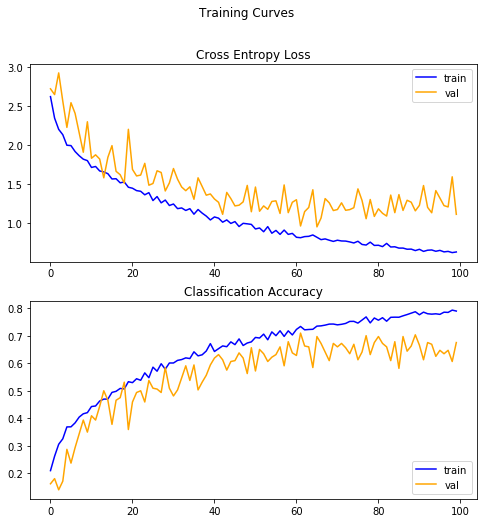


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 0.9134 - accuracy: 0.7031
Test set evaluation metrics
30/30 [==============================] - 0s 7ms/step - loss: 1.1043 - accuracy: 0.6984
loss: 1.10
accuracy: 0.70
--- Starting trial: run-42
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 128}
loss: 1.10
accuracy: 0.70
--- Starting trial: run-42
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.4402 - accuracy: 0.2504 - val_loss: 3.0394 - val_accuracy: 0.1047

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.4402 - accuracy: 0.2504 - val_loss: 3.0394 - val_accuracy: 0.1047
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0935 - accuracy: 0.3407 - val_

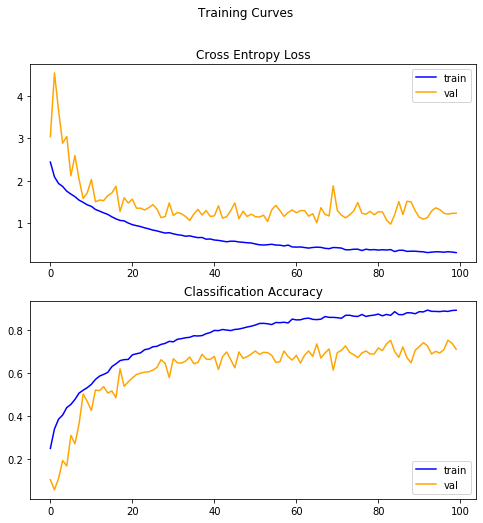

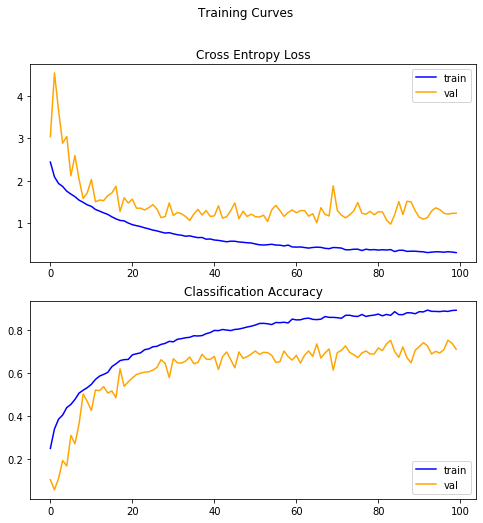


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.2678 - accuracy: 0.6875
Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 1.2470 - accuracy: 0.7073
loss: 1.25
accuracy: 0.71
--- Starting trial: run-43
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 256}
loss: 1.25
accuracy: 0.71
--- Starting trial: run-43
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2276 - accuracy: 0.3105 - val_loss: 3.9665 - val_accuracy: 0.0617

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2276 - accuracy: 0.3105 - val_loss: 3.9665 - val_accuracy: 0.0617
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8610 - accuracy: 0.4092 - val

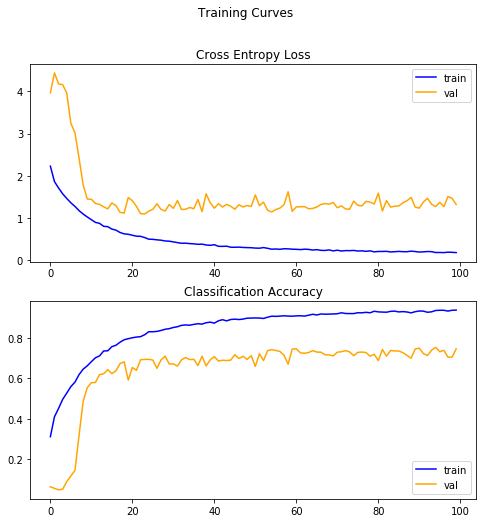

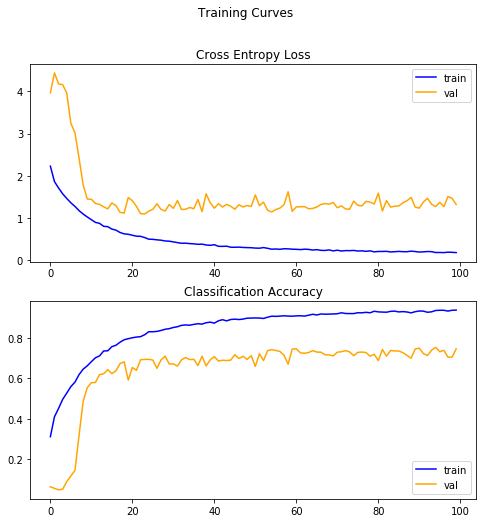


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.6134 - accuracy: 0.7188
Test set evaluation metrics
30/30 [==============================] - 0s 14ms/step - loss: 1.3805 - accuracy: 0.7318
loss: 1.38
accuracy: 0.73
--- Starting trial: run-44
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 32}
loss: 1.38
accuracy: 0.73
--- Starting trial: run-44
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 3.0526 - accuracy: 0.1509 - val_loss: 9.9289 - val_accuracy: 0.0500

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 3.0526 - accuracy: 0.1509 - val_loss: 9.9289 - val_accuracy: 0.0500
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.6702 - accuracy: 0.1919 - val_los

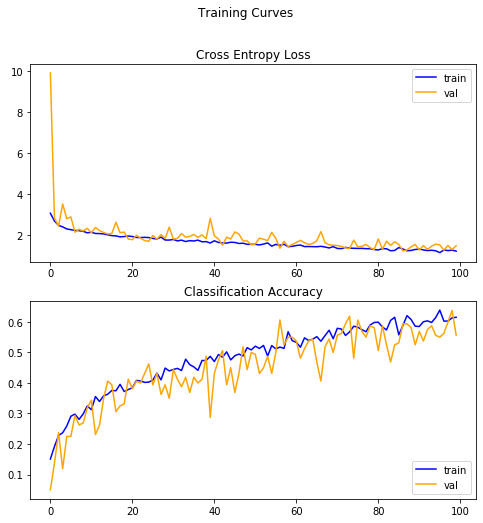

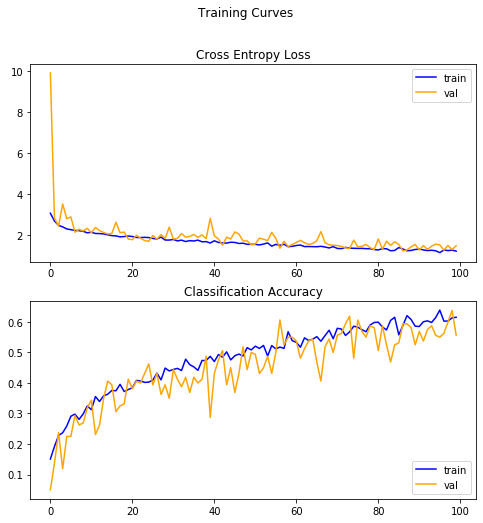


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.3972 - accuracy: 0.6875
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.4186 - accuracy: 0.5677
loss: 1.42
accuracy: 0.57
--- Starting trial: run-45
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 64}
loss: 1.42
accuracy: 0.57
--- Starting trial: run-45
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7964 - accuracy: 0.1570 - val_loss: 3.8779 - val_accuracy: 0.1187

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7964 - accuracy: 0.1570 - val_loss: 3.8779 - val_accuracy: 0.1187
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4101 - accuracy: 0.2419 - val_loss

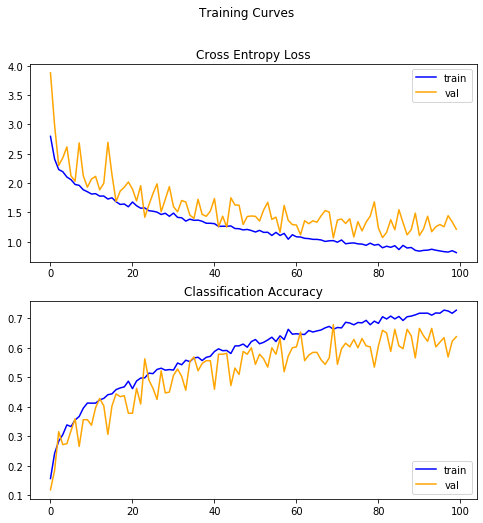

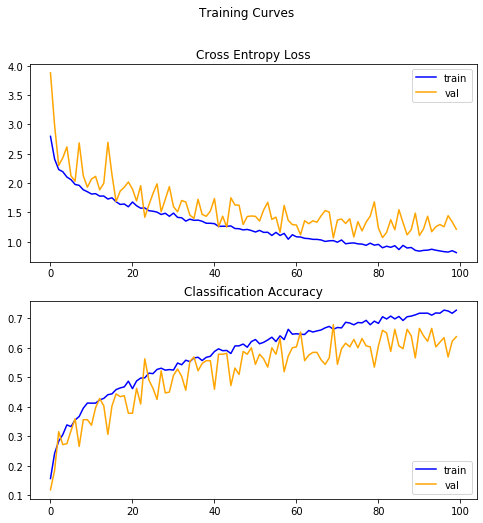


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.1804 - accuracy: 0.6406
Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1229 - accuracy: 0.6677
loss: 1.12
accuracy: 0.67
--- Starting trial: run-46
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 128}
loss: 1.12
accuracy: 0.67
--- Starting trial: run-46
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5447 - accuracy: 0.2264 - val_loss: 2.5565 - val_accuracy: 0.2062

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5447 - accuracy: 0.2264 - val_loss: 2.5565 - val_accuracy: 0.2062
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1281 - accuracy: 0.3253 - val_lo

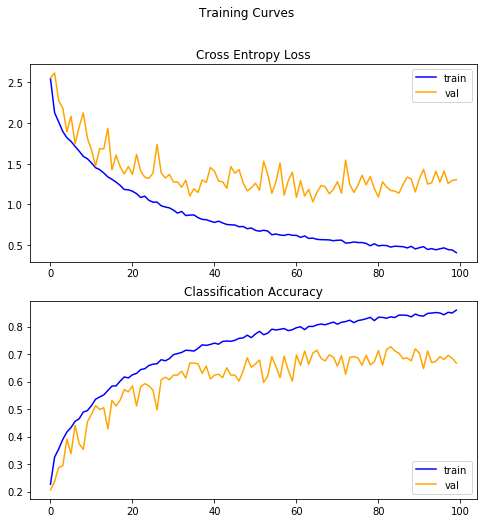

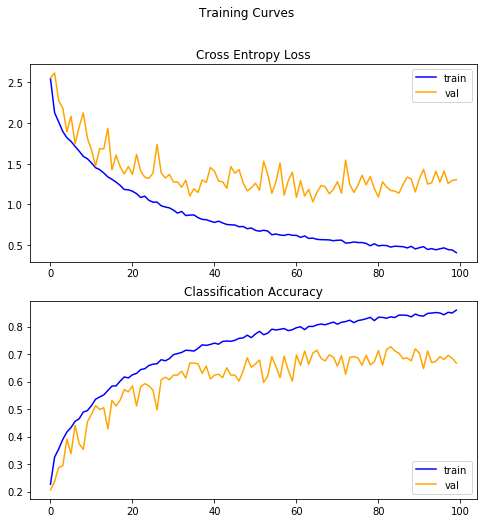


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.3074 - accuracy: 0.6719
Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.2286 - accuracy: 0.6969
loss: 1.23loss: 1.23
accuracy: 0.70
--- Starting trial: run-47
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 256}

accuracy: 0.70
--- Starting trial: run-47
{'num_units': 128, 'optimizer': 'adam', 'learning_rate': 0.005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3820 - accuracy: 0.2563 - val_loss: 2.6025 - val_accuracy: 0.2102

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3820 - accuracy: 0.2563 - val_loss: 2.6025 - val_accuracy: 0.2102
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9906 - accuracy: 0.3593 - val_lo

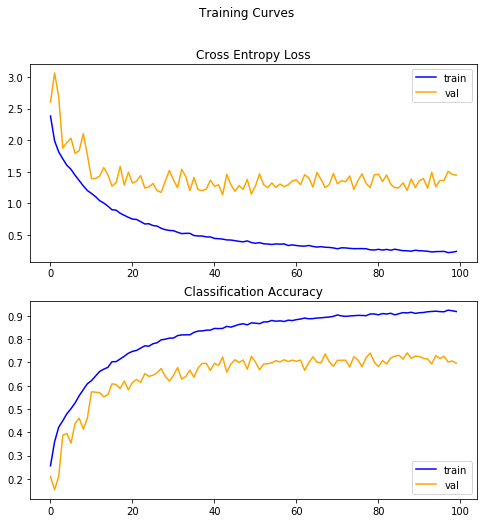

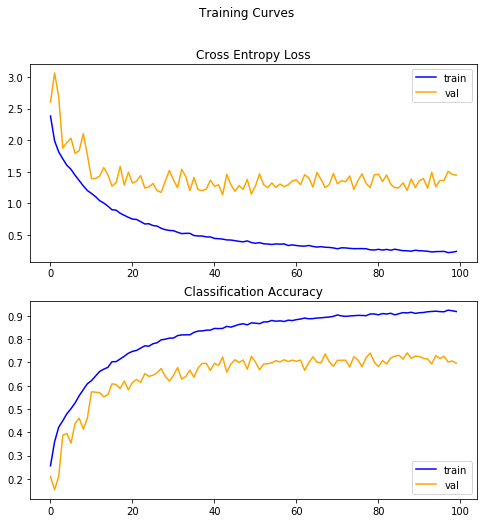


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.4524 - accuracy: 0.7227
Test set evaluation metrics
30/30 [==============================] - 0s 14ms/step - loss: 1.4154 - accuracy: 0.7021
loss: 1.42
accuracy: 0.70
--- Starting trial: run-48
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 32}
loss: 1.42
accuracy: 0.70
--- Starting trial: run-48
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6780 - accuracy: 0.1851 - val_loss: 3.0065 - val_accuracy: 0.0562

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6780 - accuracy: 0.1851 - val_loss: 3.0065 - val_accuracy: 0.0562
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3850 - accuracy: 0.2656 - v

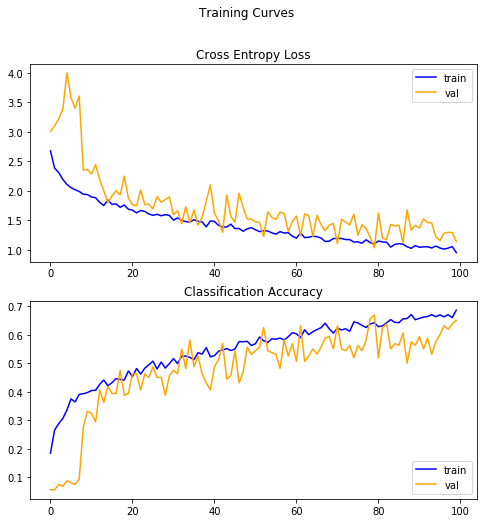

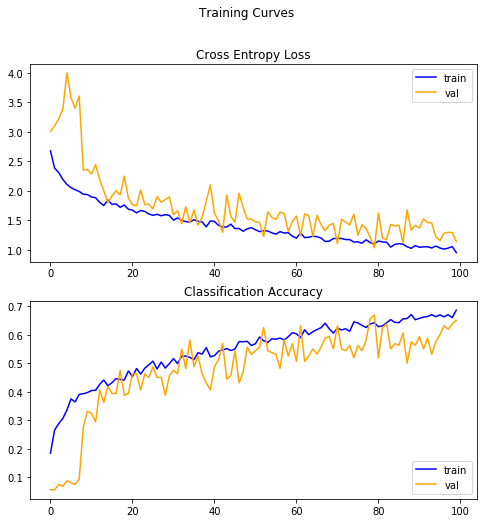


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.5308 - accuracy: 0.5938
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.1840 - accuracy: 0.6354
loss: 1.18
accuracy: 0.64
--- Starting trial: run-49
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 64}
loss: 1.18
accuracy: 0.64
--- Starting trial: run-49
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5424 - accuracy: 0.2231 - val_loss: 2.9953 - val_accuracy: 0.0469

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5424 - accuracy: 0.2231 - val_loss: 2.9953 - val_accuracy: 0.0469
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2339 - accuracy: 0.3044 - va

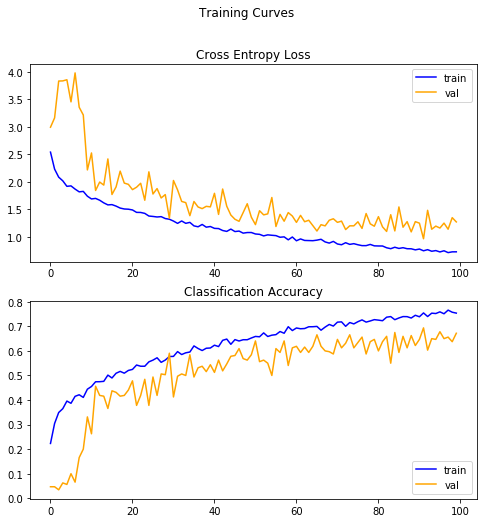

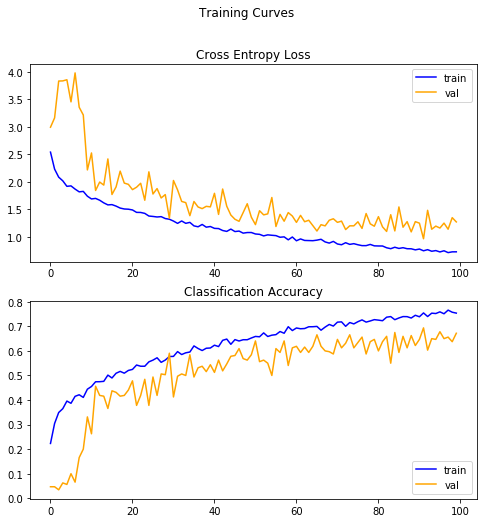


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 0.9468 - accuracy: 0.6406
Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1258 - accuracy: 0.6693
loss: 1.13
accuracy: 0.67
--- Starting trial: run-50
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 128}
loss: 1.13
accuracy: 0.67
--- Starting trial: run-50
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4344 - accuracy: 0.2445 - val_loss: 3.0379 - val_accuracy: 0.0484

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4344 - accuracy: 0.2445 - val_loss: 3.0379 - val_accuracy: 0.0484
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0964 - accuracy: 0.3472 - 

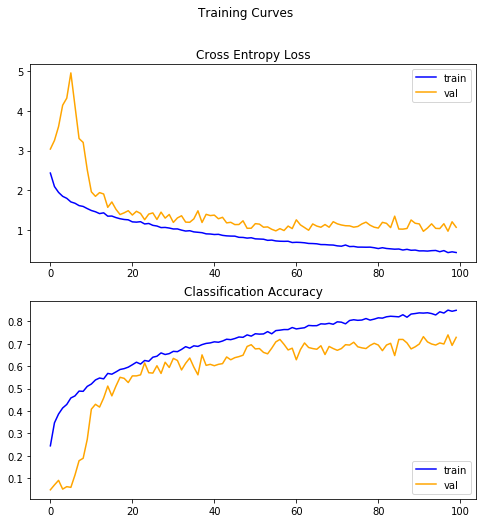

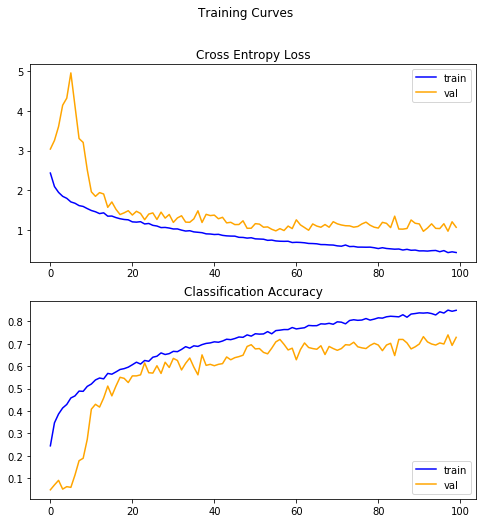


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.4080 - accuracy: 0.6797
Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.0815 - accuracy: 0.7195
loss: 1.08
accuracy: 0.72
--- Starting trial: run-51
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 256}
loss: 1.08
accuracy: 0.72
--- Starting trial: run-51
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3889 - accuracy: 0.2706 - val_loss: 3.0262 - val_accuracy: 0.0484

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3889 - accuracy: 0.2706 - val_loss: 3.0262 - val_accuracy: 0.0484
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.0072 - accuracy: 0.3720 - 

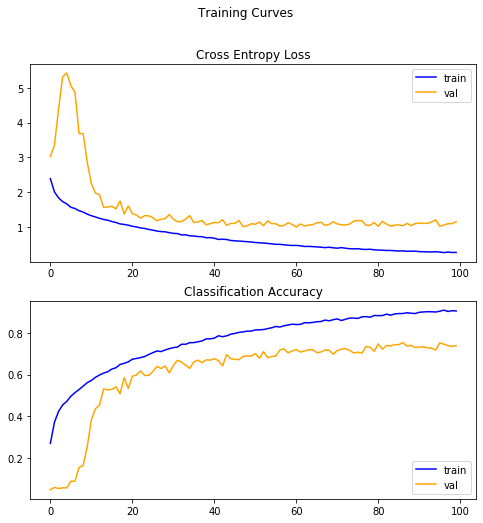

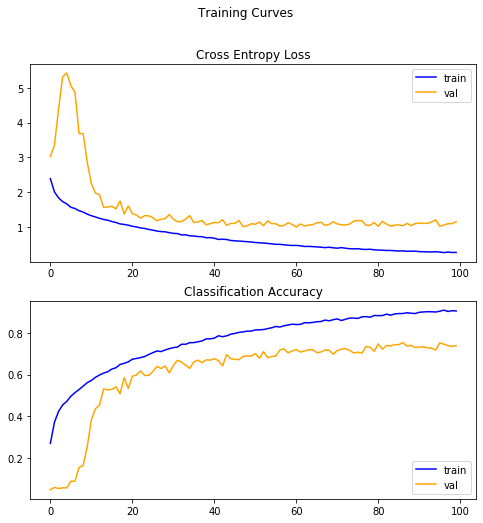


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.2302 - accuracy: 0.7344
Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.1802 - accuracy: 0.7293
loss: 1.18
accuracy: 0.73
--- Starting trial: run-52
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 32}
loss: 1.18
accuracy: 0.73
--- Starting trial: run-52
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6410 - accuracy: 0.2021 - val_loss: 3.0601 - val_accuracy: 0.0750

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6410 - accuracy: 0.2021 - val_loss: 3.0601 - val_accuracy: 0.0750
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3865 - accuracy: 0.2666 - val

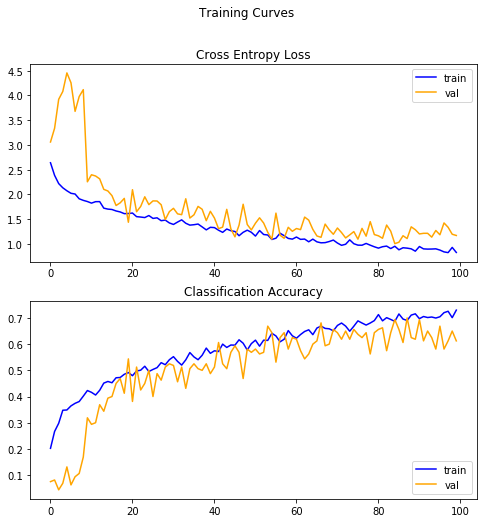

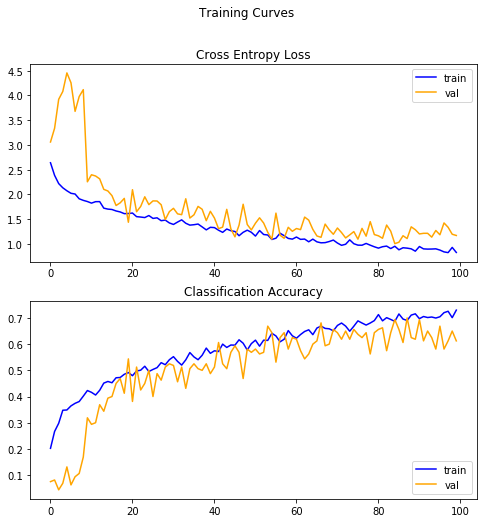


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.3983 - accuracy: 0.6562
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.1833 - accuracy: 0.6604
loss: 1.18
accuracy: 0.66
--- Starting trial: run-53
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 64}
loss: 1.18
accuracy: 0.66
--- Starting trial: run-53
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5256 - accuracy: 0.2246 - val_loss: 3.0434 - val_accuracy: 0.0656

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5256 - accuracy: 0.2246 - val_loss: 3.0434 - val_accuracy: 0.0656
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1862 - accuracy: 0.3149 - val_

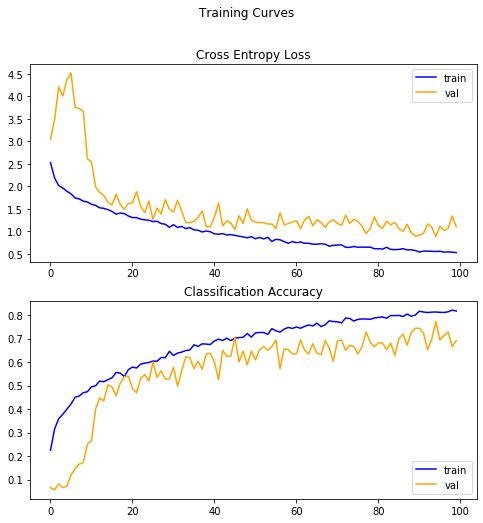

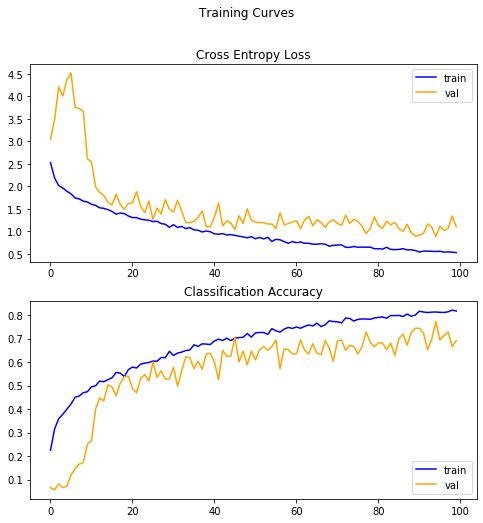


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.1573 - accuracy: 0.6875
Test set evaluation metrics
30/30 [==============================] - 0s 7ms/step - loss: 1.0328 - accuracy: 0.6969
loss: 1.03
accuracy: 0.70
--- Starting trial: run-54
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 128}
loss: 1.03
accuracy: 0.70
--- Starting trial: run-54
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4061 - accuracy: 0.2555 - val_loss: 3.0942 - val_accuracy: 0.0516

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4061 - accuracy: 0.2555 - val_loss: 3.0942 - val_accuracy: 0.0516
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0284 - accuracy: 0.3629 - va

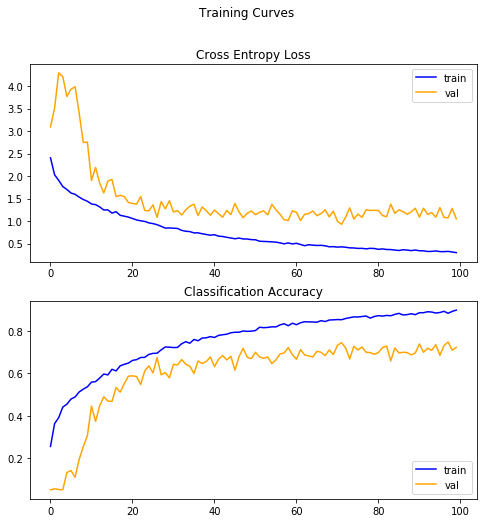

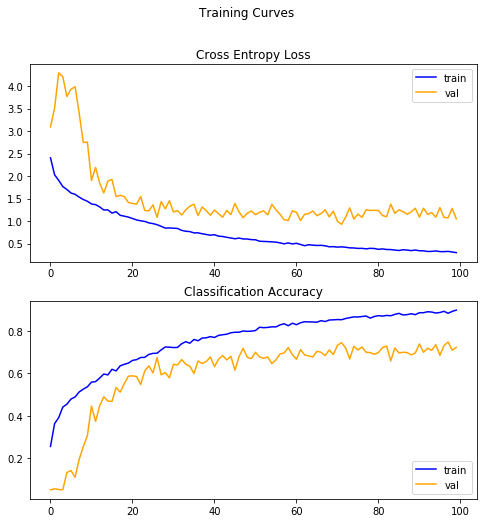


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.2354 - accuracy: 0.7109
Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.1151 - accuracy: 0.7273
loss: 1.12
accuracy: 0.73
loss: 1.12
accuracy: 0.73
--- Starting trial: run-55
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 256}
--- Starting trial: run-55
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.001, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2721 - accuracy: 0.2993 - val_loss: 3.1147 - val_accuracy: 0.0766

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2721 - accuracy: 0.2993 - val_loss: 3.1147 - val_accuracy: 0.0766
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8772 - accuracy: 0.4069 - va

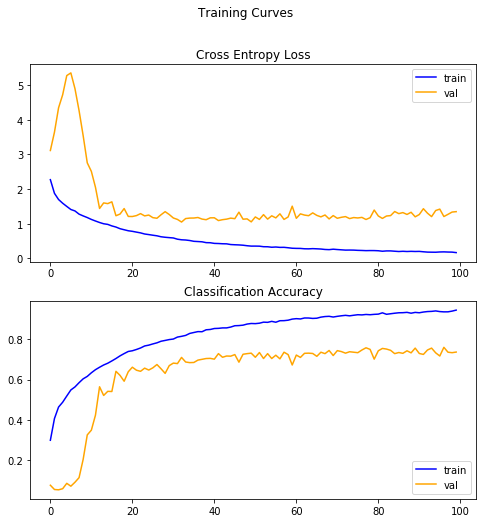

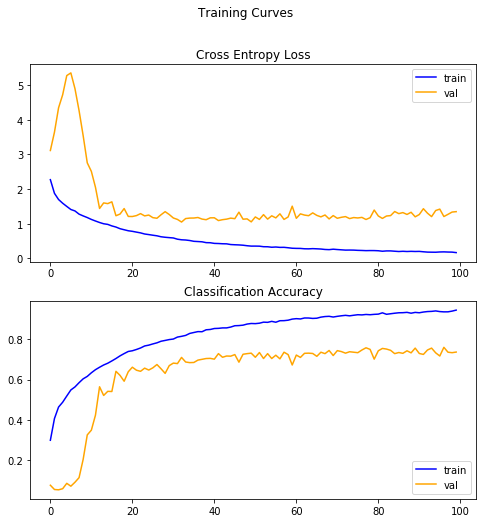


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.3838 - accuracy: 0.7109
Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.3764 - accuracy: 0.7232
loss: 1.38
accuracy: 0.72
--- Starting trial: run-56
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 32}
loss: 1.38
accuracy: 0.72
--- Starting trial: run-56
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7711 - accuracy: 0.1792 - val_loss: 3.0889 - val_accuracy: 0.0437

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.7711 - accuracy: 0.1792 - val_loss: 3.0889 - val_accuracy: 0.0437
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4567 - accuracy: 0.2461 - v

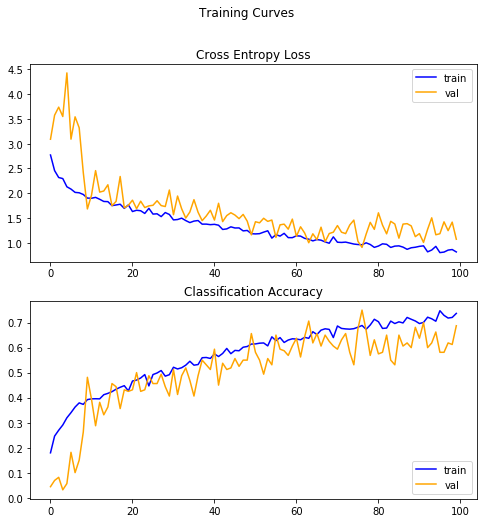

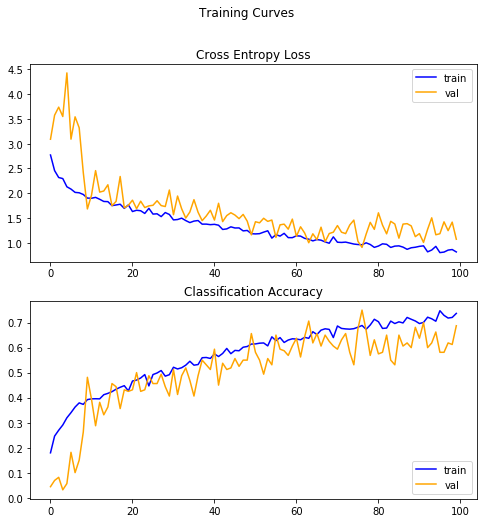


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 0.8192 - accuracy: 0.7188
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.0793 - accuracy: 0.6667
loss: 1.08
accuracy: 0.67
--- Starting trial: run-57
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 64}
loss: 1.08
accuracy: 0.67
--- Starting trial: run-57
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5463 - accuracy: 0.2295 - val_loss: 3.0669 - val_accuracy: 0.0594

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5463 - accuracy: 0.2295 - val_loss: 3.0669 - val_accuracy: 0.0594
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2315 - accuracy: 0.2964 - va

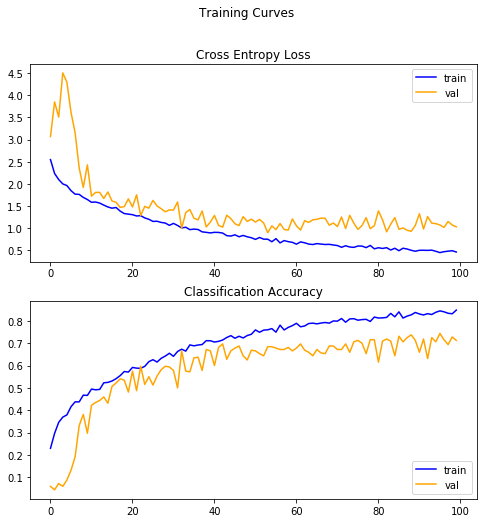

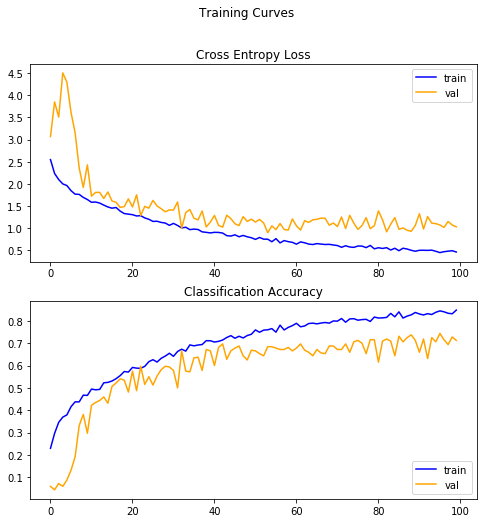


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.2115 - accuracy: 0.7656
Test set evaluation metrics
30/30 [==============================] - 0s 7ms/step - loss: 1.0745 - accuracy: 0.7094
loss: 1.07
accuracy: 0.71
--- Starting trial: run-58
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 128}
loss: 1.07
accuracy: 0.71
--- Starting trial: run-58
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4135 - accuracy: 0.2559 - val_loss: 3.1315 - val_accuracy: 0.0891

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4135 - accuracy: 0.2559 - val_loss: 3.1315 - val_accuracy: 0.0891
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.0454 - accuracy: 0.3545 - 

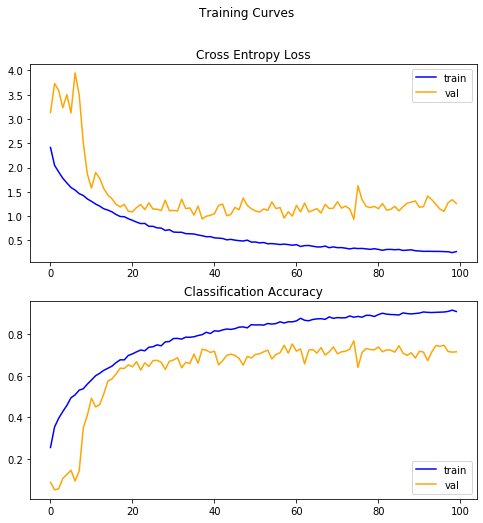

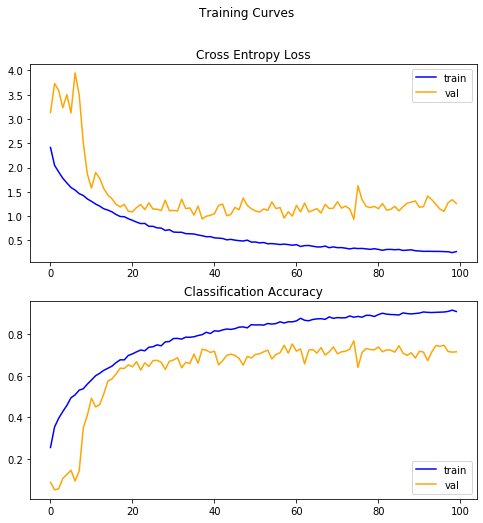


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.3252 - accuracy: 0.6797
Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.2475 - accuracy: 0.7081
loss: 1.25
accuracy: 0.71
--- Starting trial: run-59
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 256}
loss: 1.25
accuracy: 0.71
--- Starting trial: run-59
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.0025, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2843 - accuracy: 0.2854 - val_loss: 3.2468 - val_accuracy: 0.0570

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2843 - accuracy: 0.2854 - val_loss: 3.2468 - val_accuracy: 0.0570
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8710 - accuracy: 0.4034 - 

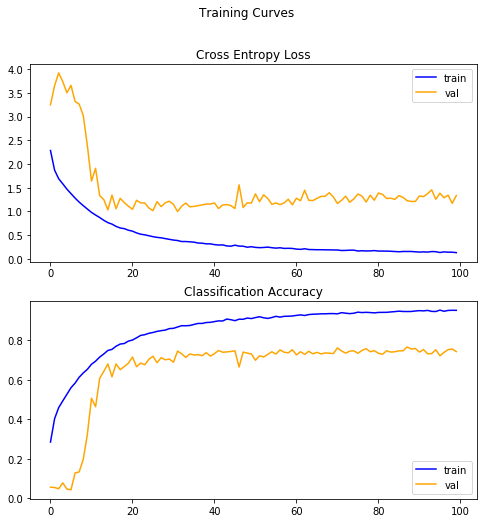

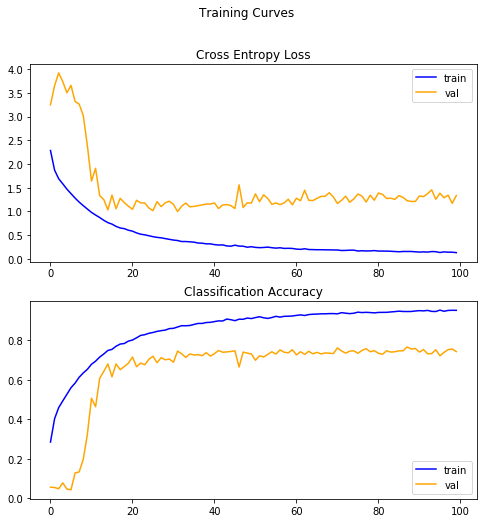


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.5035 - accuracy: 0.7305
Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.2792 - accuracy: 0.7596
loss: 1.28
accuracy: 0.76
--- Starting trial: run-60
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 32}
loss: 1.28
accuracy: 0.76
--- Starting trial: run-60
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8119 - accuracy: 0.1724 - val_loss: 2.7715 - val_accuracy: 0.1187

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8119 - accuracy: 0.1724 - val_loss: 2.7715 - val_accuracy: 0.1187
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5751 - accuracy: 0.2100 - val

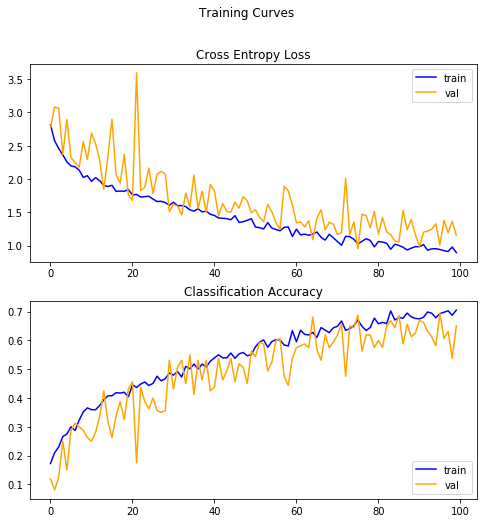

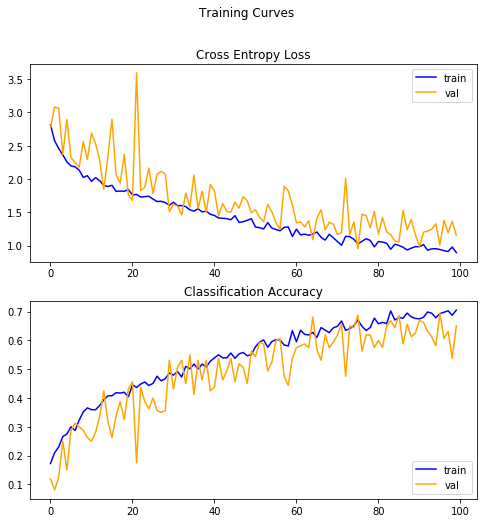


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.3757 - accuracy: 0.5938
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.1259 - accuracy: 0.6604
loss: 1.13
accuracy: 0.66
--- Starting trial: run-61
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 64}
loss: 1.13
accuracy: 0.66
--- Starting trial: run-61
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6681 - accuracy: 0.2056 - val_loss: 2.8285 - val_accuracy: 0.1281

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6681 - accuracy: 0.2056 - val_loss: 2.8285 - val_accuracy: 0.1281
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3021 - accuracy: 0.2715 - val_

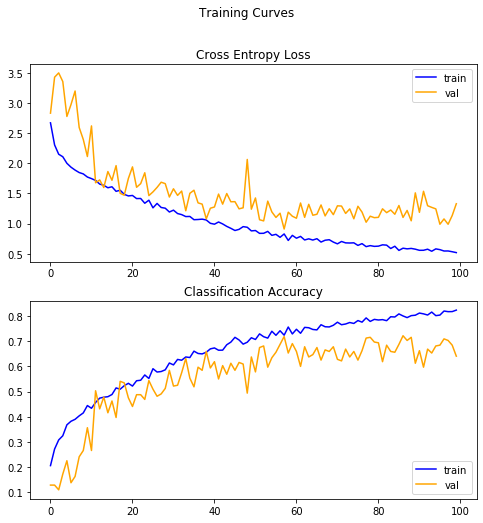

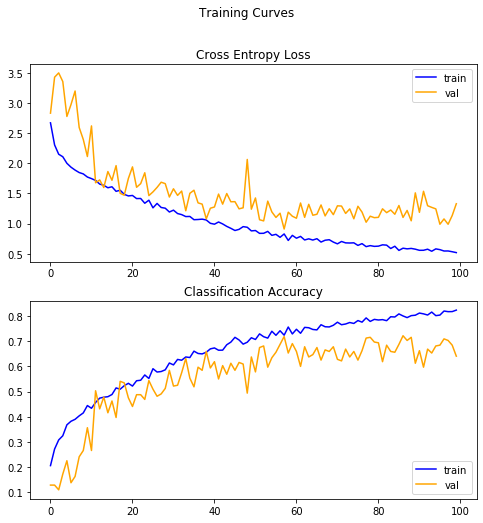


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.0474 - accuracy: 0.7031
Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.1654 - accuracy: 0.6786
loss: 1.17
accuracy: 0.68
--- Starting trial: run-62
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 128}
loss: 1.17
accuracy: 0.68
--- Starting trial: run-62
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4696 - accuracy: 0.2402 - val_loss: 2.9980 - val_accuracy: 0.1250

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4696 - accuracy: 0.2402 - val_loss: 2.9980 - val_accuracy: 0.1250
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1365 - accuracy: 0.3236 - va

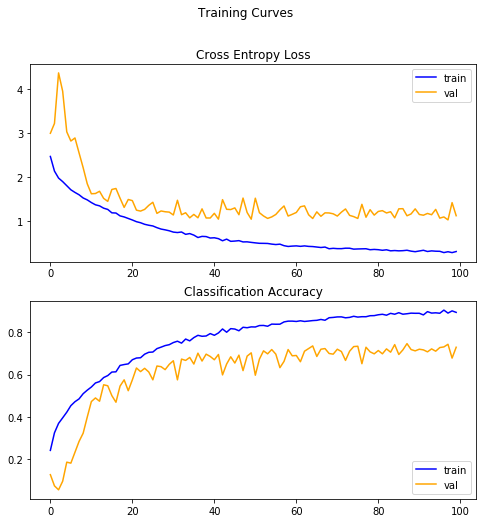

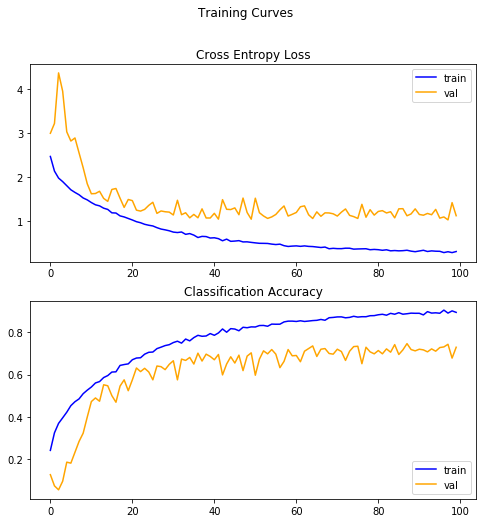


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 0.9989 - accuracy: 0.7500
Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.2242 - accuracy: 0.7167
loss: 1.22
accuracy: 0.72
--- Starting trial: run-63
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 256}
loss: 1.22
accuracy: 0.72
--- Starting trial: run-63
{'num_units': 128, 'optimizer': 'adamax', 'learning_rate': 0.005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3669 - accuracy: 0.2574 - val_loss: 2.8433 - val_accuracy: 0.1242

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.3669 - accuracy: 0.2574 - val_loss: 2.8433 - val_accuracy: 0.1242
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.9925 - accuracy: 0.3644 - va

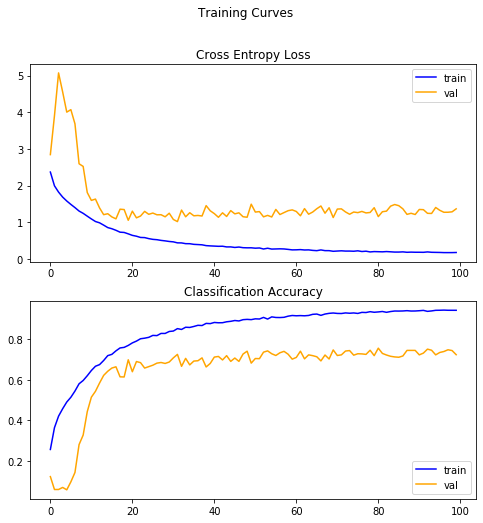

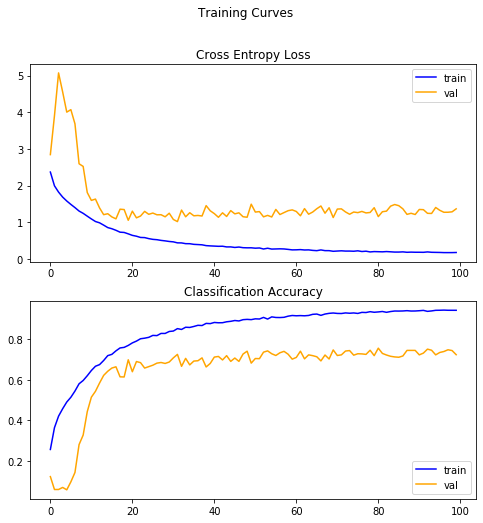


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.6365 - accuracy: 0.6484
Test set evaluation metrics
30/30 [==============================] - 0s 13ms/step - loss: 1.4067 - accuracy: 0.7245
loss: 1.41
accuracy: 0.72
--- Starting trial: run-64
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 32}
loss: 1.41
accuracy: 0.72
--- Starting trial: run-64
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6009 - accuracy: 0.2036 - val_loss: 3.0261 - val_accuracy: 0.0875

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6009 - accuracy: 0.2036 - val_loss: 3.0261 - val_accuracy: 0.0875
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2861 - accuracy: 0.2803 - val_l

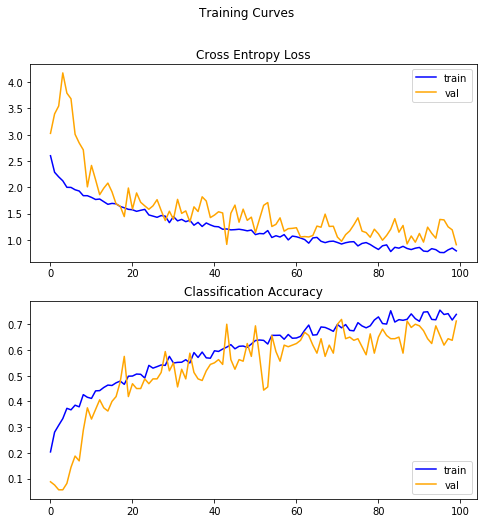

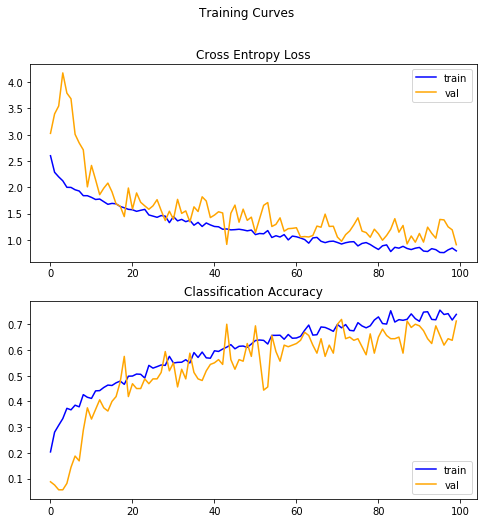


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.3311 - accuracy: 0.5625
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.1814 - accuracy: 0.6427
loss: 1.18
accuracy: 0.64
--- Starting trial: run-65
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 64}
loss: 1.18
accuracy: 0.64
--- Starting trial: run-65
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4932 - accuracy: 0.2268 - val_loss: 3.0878 - val_accuracy: 0.0656

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4932 - accuracy: 0.2268 - val_loss: 3.0878 - val_accuracy: 0.0656
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1551 - accuracy: 0.3198 - val_lo

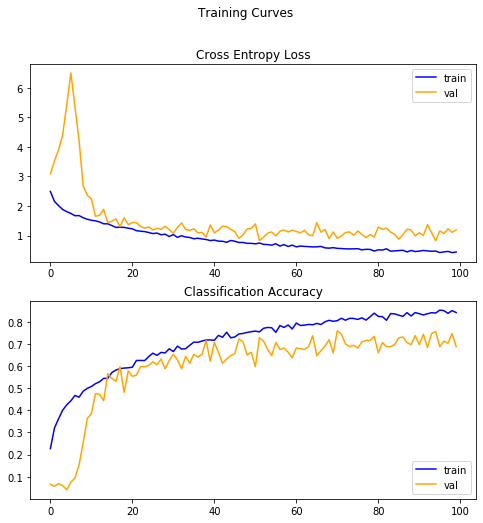

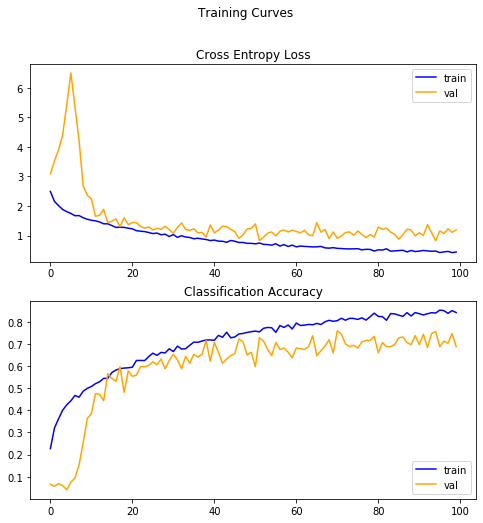


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 0.7303 - accuracy: 0.7656
Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0522 - accuracy: 0.7203
loss: 1.05
accuracy: 0.72
--- Starting trial: run-66
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 128}
loss: 1.05
accuracy: 0.72
--- Starting trial: run-66
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.3562 - accuracy: 0.2728 - val_loss: 3.1067 - val_accuracy: 0.0578

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.3562 - accuracy: 0.2728 - val_loss: 3.1067 - val_accuracy: 0.0578
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9842 - accuracy: 0.3745 - val_

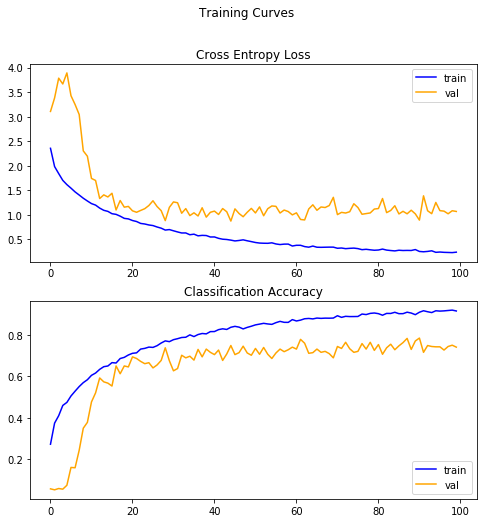

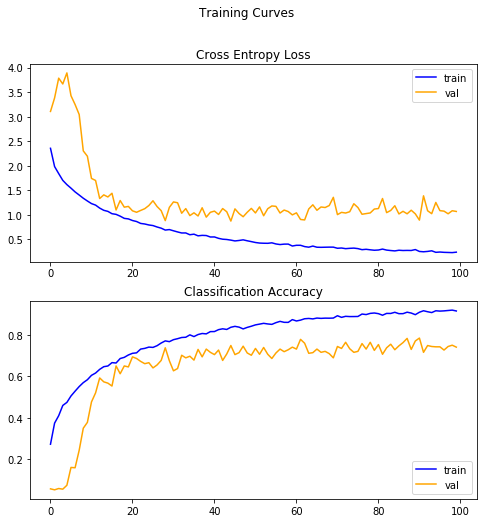


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.3166 - accuracy: 0.7344
Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.1987 - accuracy: 0.7349
loss: 1.20
accuracy: 0.73
--- Starting trial: run-67
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 256}
loss: 1.20
accuracy: 0.73
--- Starting trial: run-67
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0005, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 4s - loss: 2.2334 - accuracy: 0.3016 - val_loss: 3.1769 - val_accuracy: 0.0578

Epoch 00001: saving model to best_weights.hdf5
64/64 - 4s - loss: 2.2334 - accuracy: 0.3016 - val_loss: 3.1769 - val_accuracy: 0.0578
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8345 - accuracy: 0.4169 - val_

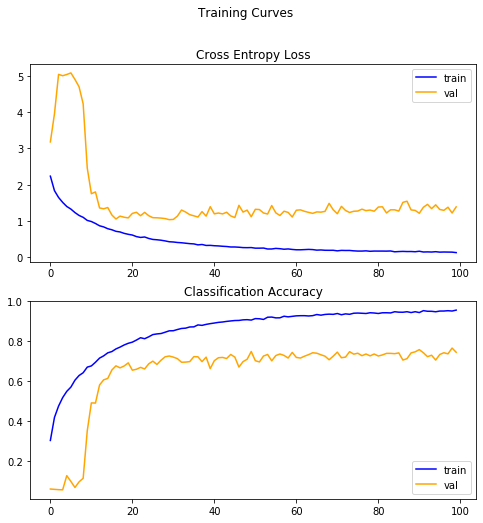

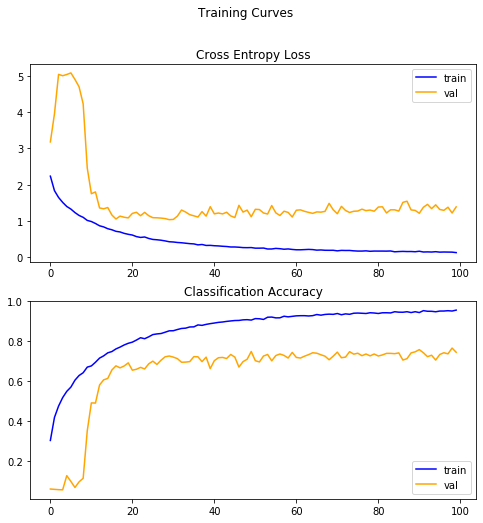


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.3233 - accuracy: 0.7461
Test set evaluation metrics
30/30 [==============================] - 0s 14ms/step - loss: 1.3755 - accuracy: 0.7393
loss: 1.38
accuracy: 0.74
--- Starting trial: run-68
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 32}
loss: 1.38
accuracy: 0.74
--- Starting trial: run-68
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6372 - accuracy: 0.1914 - val_loss: 3.1092 - val_accuracy: 0.0875

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6372 - accuracy: 0.1914 - val_loss: 3.1092 - val_accuracy: 0.0875
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.4574 - accuracy: 0.2388 - val_los

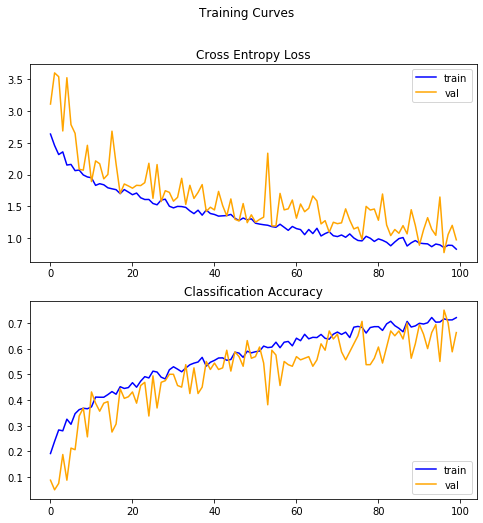

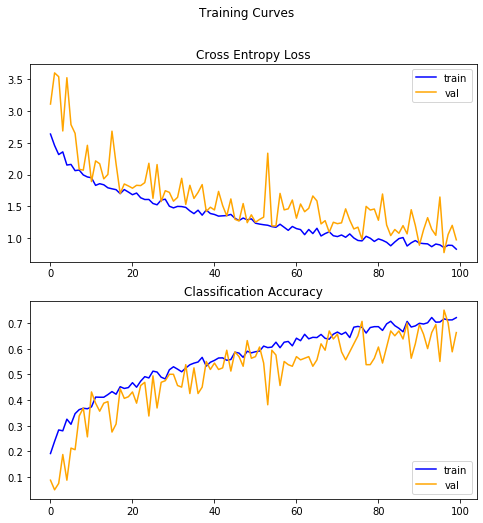


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 0.9548 - accuracy: 0.6250
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.0353 - accuracy: 0.6719
loss: 1.04
accuracy: 0.67
--- Starting trial: run-69
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 64}
loss: 1.04
accuracy: 0.67
--- Starting trial: run-69
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5128 - accuracy: 0.2192 - val_loss: 3.2693 - val_accuracy: 0.0531

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.5128 - accuracy: 0.2192 - val_loss: 3.2693 - val_accuracy: 0.0531
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.2067 - accuracy: 0.3110 - val_loss

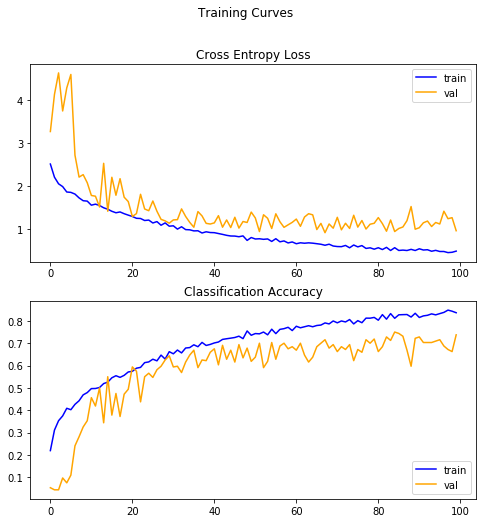

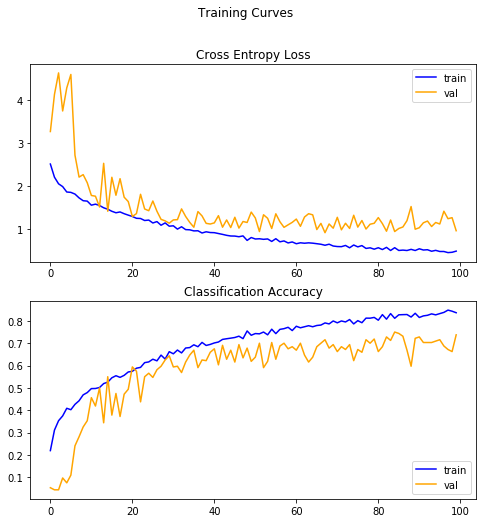


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 0.7873 - accuracy: 0.7500
Test set evaluation metrics
30/30 [==============================] - 0s 7ms/step - loss: 1.0294 - accuracy: 0.7219
loss: 1.03
accuracy: 0.72
--- Starting trial: run-70
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 128}
loss: 1.03
accuracy: 0.72
--- Starting trial: run-70
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.3525 - accuracy: 0.2715 - val_loss: 3.4091 - val_accuracy: 0.0656

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.3525 - accuracy: 0.2715 - val_loss: 3.4091 - val_accuracy: 0.0656
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 1.9754 - accuracy: 0.3713 - val_lo

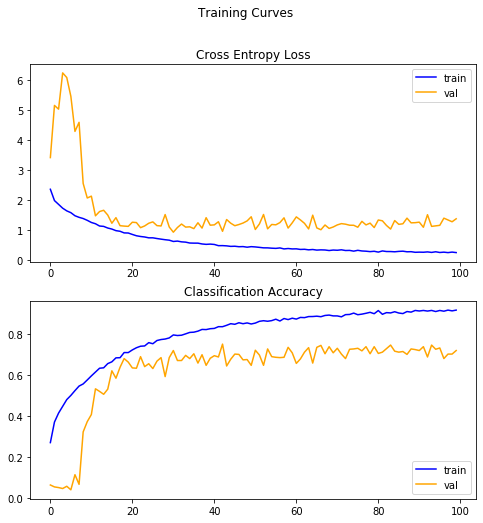

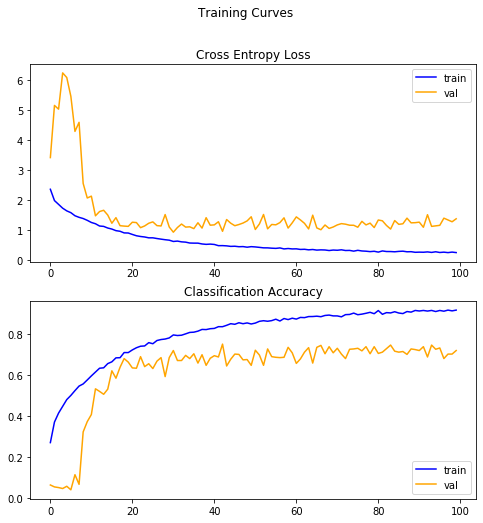


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.1266 - accuracy: 0.7500
Test set evaluation metrics
30/30 [==============================] - 0s 8ms/step - loss: 1.3293 - accuracy: 0.7198
loss: 1.33
accuracy: 0.72
--- Starting trial: run-71
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 256}
loss: 1.33
accuracy: 0.72
--- Starting trial: run-71
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.001, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2154 - accuracy: 0.3029 - val_loss: 3.2811 - val_accuracy: 0.0570

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2154 - accuracy: 0.3029 - val_loss: 3.2811 - val_accuracy: 0.0570
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8418 - accuracy: 0.4127 - val_lo

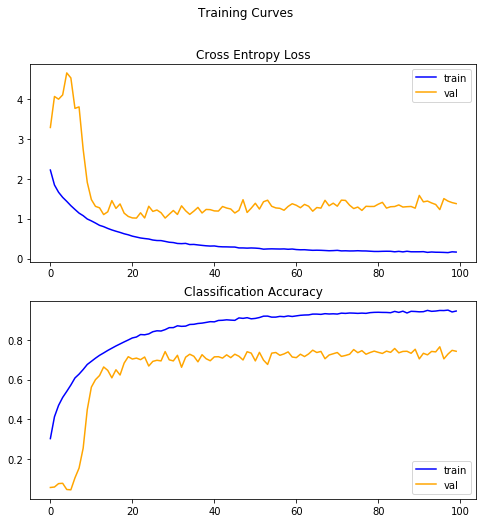

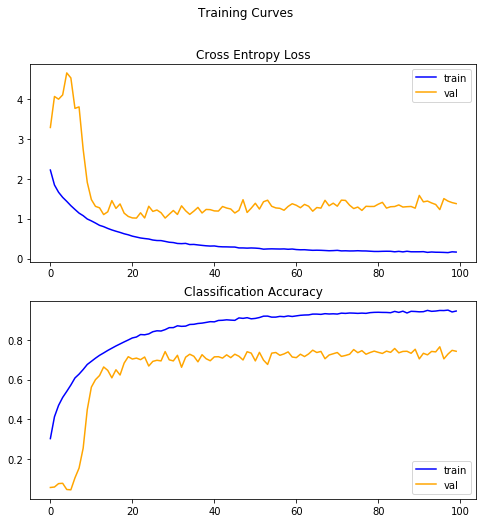


Test set evaluation metrics
 1/30 [>.............................] - ETA: 1s - loss: 1.3633 - accuracy: 0.7266
Test set evaluation metrics
30/30 [==============================] - 0s 14ms/step - loss: 1.3813 - accuracy: 0.7346
loss: 1.38
accuracy: 0.73
--- Starting trial: run-72
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 32}
loss: 1.38
accuracy: 0.73
--- Starting trial: run-72
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 32}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8417 - accuracy: 0.1743 - val_loss: 3.7838 - val_accuracy: 0.1187

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.8417 - accuracy: 0.1743 - val_loss: 3.7838 - val_accuracy: 0.1187
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.5792 - accuracy: 0.2222 - val_l

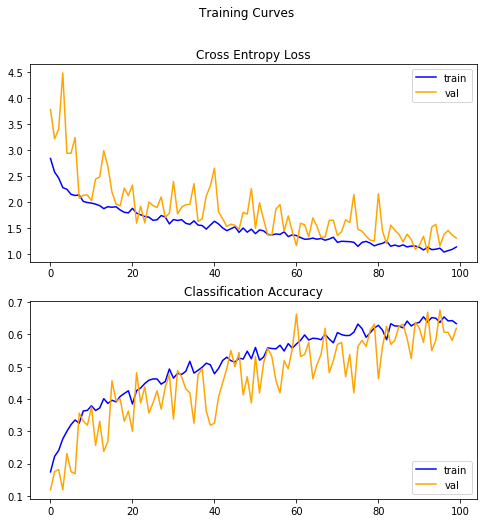

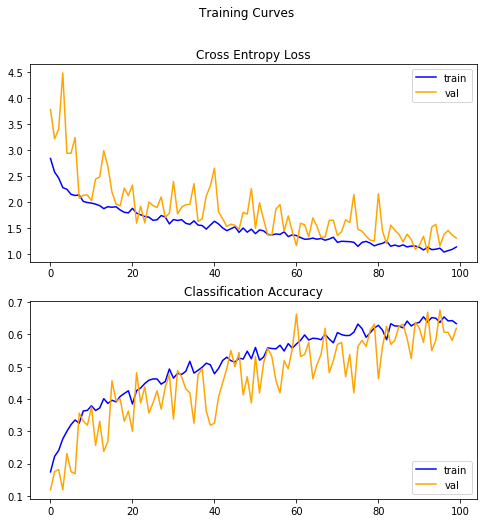


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.2785 - accuracy: 0.6875
Test set evaluation metrics
30/30 [==============================] - 0s 5ms/step - loss: 1.4225 - accuracy: 0.5542
loss: 1.42
accuracy: 0.55
--- Starting trial: run-73
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 64}
loss: 1.42
accuracy: 0.55
--- Starting trial: run-73
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 64}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6672 - accuracy: 0.1902 - val_loss: 2.7386 - val_accuracy: 0.1750

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.6672 - accuracy: 0.1902 - val_loss: 2.7386 - val_accuracy: 0.1750
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.3803 - accuracy: 0.2639 - val_lo

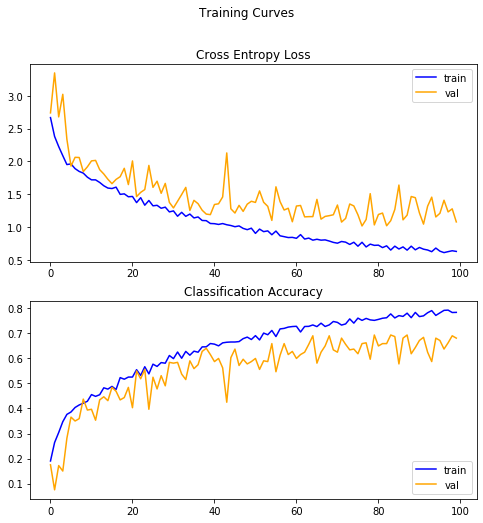

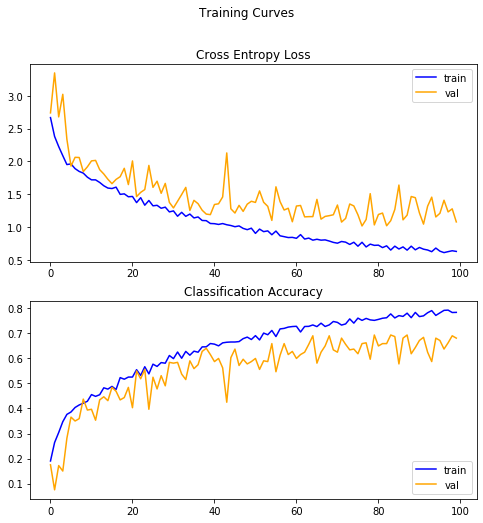


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.2615 - accuracy: 0.6406
Test set evaluation metrics
30/30 [==============================] - 0s 6ms/step - loss: 1.0773 - accuracy: 0.6932
loss: 1.08
accuracy: 0.69
--- Starting trial: run-74
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 128}
loss: 1.08
accuracy: 0.69
--- Starting trial: run-74
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 128}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4184 - accuracy: 0.2495 - val_loss: 3.3022 - val_accuracy: 0.0875

Epoch 00001: saving model to best_weights.hdf5
64/64 - 2s - loss: 2.4184 - accuracy: 0.2495 - val_loss: 3.3022 - val_accuracy: 0.0875
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 1s - loss: 2.1120 - accuracy: 0.3367 - val_

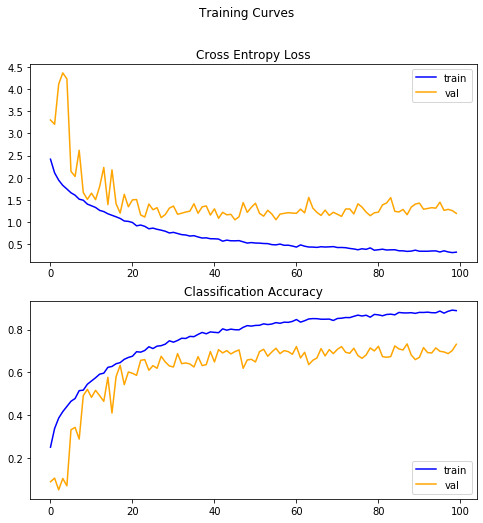

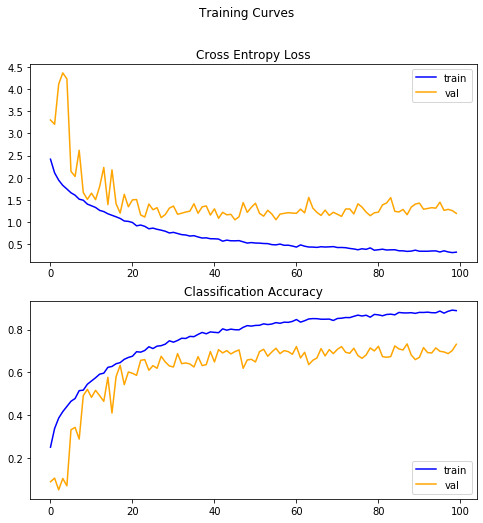


Test set evaluation metrics
 1/30 [>.............................] - ETA: 0s - loss: 1.1696 - accuracy: 0.7109
Test set evaluation metrics
30/30 [==============================] - 0s 9ms/step - loss: 1.1479 - accuracy: 0.7367
loss: 1.15
accuracy: 0.74
--- Starting trial: run-75
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 256}
loss: 1.15
accuracy: 0.74
--- Starting trial: run-75
{'num_units': 256, 'optimizer': 'adam', 'learning_rate': 0.0025, 'batch_size': 256}
Train for 64 steps, validate for 5 steps
Train for 64 steps, validate for 5 steps
Epoch 1/100
Epoch 1/100

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2713 - accuracy: 0.2882 - val_loss: 4.2141 - val_accuracy: 0.0477

Epoch 00001: saving model to best_weights.hdf5
64/64 - 3s - loss: 2.2713 - accuracy: 0.2882 - val_loss: 4.2141 - val_accuracy: 0.0477
Epoch 2/100
Epoch 2/100

Epoch 00002: saving model to best_weights.hdf5
64/64 - 2s - loss: 1.8683 - accuracy: 0.3986 - val_

In [0]:
'''
Στο σημείο αυτό εκτελούμε τη Gridsearch για όλες
τις τιμές των υπερπαραμέτρων
'''
session_num = 0

for num_units in HP_NUM_UNITS.domain.values:
  for optimizer in HP_OPTIMIZER.domain.values:
    for lr in HP_LEARNING_RATE.domain.values:
      for bs in HP_BATCH_SIZE.domain.values:
        hparams = {
            HP_NUM_UNITS: num_units,
            HP_OPTIMIZER: optimizer,
            HP_LEARNING_RATE: lr,
            HP_BATCH_SIZE: bs
        }
        run_name = "run-%d" % session_num
        print('--- Starting trial: %s' % run_name)
        print({h.name: hparams[h] for h in hparams})
        run('logs/hparam_tuning/' + run_name, 20, hparams, x_train_all, y_train_all)
        session_num += 1


In [0]:
# Εμφανίζουμε τα αποτελέσματα μέσω του tensorbard 
# (μέσω Firefox υπάρχει πρόβλημα - δούλεψαμε μέσω Chrome)
%tensorboard --logdir './logs'

<IPython.core.display.Javascript object>

Το περιβάλλον Tensorboard στη κεφαλίδα των υπερπαραμέτρων (HPARAMS). Σε κάθε γραμμή αναγράφεται το αναγνωριστικό της δοκιμής, οι τιμές των υπερπαραμέτρων και οι μετρικές validation accuracy και validation loss.

![](https://drive.google.com/uc?id=11ht9cq79IfgrPiec2gAL3iLghpZ9lGv9)

Ο βέλτιστος συνδιασμός των υπερπαραμέτρων παρουσιάζεται με την πράσινη γραμμή στην γραφική των πολλών παράλληλων συντεταγμένων ενώ οι βέλτιστες τιμές των υπερπαραμέτρων παρουσιάζονται στον πίνακα από κάτω.

![](https://drive.google.com/uc?id=1UnGAB1McaLZuWsYHXrYxt3UBgYu2LEkg)

###**Βελτιστοποίηση με RandomSearch**

Στο σημείο αυτό θα χρησιμοποιήσουμε βελτιστοποίηση με τη μέθοδο RandomSearch κατα την οποία επιλέγονται τυχαία οι τιμές των υπερπαραμέτρων από ένα πεδίο ορισμού αυτών. Θεωρητικά και πειραματικά η βελτιστοποίηση μέσω αυτής της μεθόδου επιστρέφει καλύτερες εκτιμήσεις των υπερπαραμέτρων όπως αναφέρεται σε πολλά papers. Ακολουθούν δύο papers ως παράδειγμα.

[Random Search for Hyper-Parameter Optimization, James Bergstra, Yoshua Bengio](http://www.jmlr.org/papers/volume13/bergstra12a/bergstra12a.pdf)

[Why is Differential Evolution Better than Grid Search for Tuning Defect Predictors?Wei Fu, Vivek Nair, Tim Menzies](https://arxiv.org/pdf/1609.02613.pdf)

Για να εκτελέσουμε την τυχαία αναζήτηση στο χώρο των υπερπαραμέτρων θα χρησιμοποιήσουμε αυτή τη φορά το εργαλείο Keras Tuner, το οποίο όπως και το Tensorboard παράγει κάποιες περιλήψεις για τις δοκιμές αλλά σε αντίθεση με αυτό επιστρέφει και το καλύτερο δυνατό μοντέλο. To Keras Tuner είναι πολύ εύκολο σαν εργαλείο σε σχέση με το Tensorboard αλλά προσφέρει λιγότερες δυνατότητες.

Θα επικεντρωθούμε σε πιο στενά πεδία ορισμού για τις προηγούμενες υπερπαραμέτρους μιας και οι δύο προηγούμενοι τρόποι μας κατεύθυναν κάπως το πλάνο. Στο χώρο αναζήτησης προστίθεται η πληθικότητα σε νευρώνεες του πρωτελευταίου πυκνού layer - πριν το output layer. Επειδή το Keras Tuner μελετάει την επίδραση των υπερπαραμέτρων επί τόπου πάνω στο νευρωνικό δίκτυο δεν επεκτείνεται σε παραμέτρους πέραν της αρχιεκτονικής αυτού. Επομένως το batch size το διατηρούμε σταθερό στην τιμή 256 σύμφωνα με το gridsearch.

In [0]:
from kerastuner.tuners import RandomSearch

In [0]:
def init_opt_model_rs(hp):
  model = models.Sequential()

  model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)))
  model.add(layers.UpSampling2D(size=(2,2)))
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))

  model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Flatten())
  model.add(layers.Dense(hp.Choice('num_units', [256, 320, 384, 448]) , activation='relu'))
  model.add(layers.Dense(20, activation='softmax'))

  opt = tf.keras.optimizers.deserialize({'class_name': hp.Choice('optimizer', ['adam', 'adamax']), 
                                         'config': {'learning_rate': hp.Choice('learning rate', [0.0025, 0.001, 0.0005])}})

  model.compile(optimizer=opt, loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])

  return model

In [0]:
tuner = RandomSearch(
    init_opt_model_rs,
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=3,
    directory='randomsearch',
    project_name='optimizing')

In [0]:
tuner.search_space_summary()

In [0]:
x_train_ds, y_train_ds, x_test_ds, y_test_ds = set_classes(20, x_train_all, y_train_all)
  
train_ds, val_ds, test_ds, classes = set_batch(batch_size=256, 
                                        shift=True,
                                        x_train_ds=x_train_ds, 
                                        y_train_ds=y_train_ds,
                                        x_test_ds=x_test_ds,
                                        y_test_ds=y_test_ds)

tuner.search(train_ds, epochs=50, steps_per_epoch=30, validation_steps=5, validation_data=val_ds)

Train for 30 steps, validate for 5 steps
Epoch 1/50
30/30 [==============================] - 3s 114ms/step - loss: 2.3636 - accuracy: 0.2572 - val_loss: 3.0311 - val_accuracy: 0.0664
Epoch 2/50
30/30 [==============================] - 2s 78ms/step - loss: 1.9646 - accuracy: 0.3759 - val_loss: 3.3285 - val_accuracy: 0.0547
Epoch 3/50
30/30 [==============================] - 2s 79ms/step - loss: 1.8349 - accuracy: 0.4124 - val_loss: 3.8427 - val_accuracy: 0.0508
Epoch 4/50
30/30 [==============================] - 2s 79ms/step - loss: 1.7372 - accuracy: 0.4439 - val_loss: 4.1635 - val_accuracy: 0.0453
Epoch 5/50
30/30 [==============================] - 2s 79ms/step - loss: 1.6224 - accuracy: 0.4741 - val_loss: 4.3551 - val_accuracy: 0.0430
Epoch 6/50
30/30 [==============================] - 2s 80ms/step - loss: 1.5717 - accuracy: 0.4975 - val_loss: 4.5680 - val_accuracy: 0.0516
Epoch 7/50
30/30 [==============================] - 2s 80ms/step - loss: 1.5194 - accuracy: 0.5174 - val_loss: 4

Train for 30 steps, validate for 5 steps
Epoch 1/50
30/30 [==============================] - 3s 111ms/step - loss: 2.3259 - accuracy: 0.2754 - val_loss: 2.9774 - val_accuracy: 0.0875
Epoch 2/50
30/30 [==============================] - 2s 78ms/step - loss: 1.9657 - accuracy: 0.3728 - val_loss: 3.3287 - val_accuracy: 0.0578
Epoch 3/50
30/30 [==============================] - 2s 79ms/step - loss: 1.8533 - accuracy: 0.4094 - val_loss: 3.6116 - val_accuracy: 0.0602
Epoch 4/50
30/30 [==============================] - 2s 80ms/step - loss: 1.7586 - accuracy: 0.4363 - val_loss: 4.0476 - val_accuracy: 0.0633
Epoch 5/50
30/30 [==============================] - 2s 79ms/step - loss: 1.6754 - accuracy: 0.4625 - val_loss: 4.6780 - val_accuracy: 0.0609
Epoch 6/50
30/30 [==============================] - 2s 80ms/step - loss: 1.5728 - accuracy: 0.4865 - val_loss: 5.2304 - val_accuracy: 0.0578
Epoch 7/50
30/30 [==============================] - 2s 80ms/step - loss: 1.5040 - accuracy: 0.5172 - val_loss: 6

Train for 30 steps, validate for 5 steps
Epoch 1/50
30/30 [==============================] - 3s 114ms/step - loss: 2.4293 - accuracy: 0.2423 - val_loss: 2.9085 - val_accuracy: 0.0883
Epoch 2/50
30/30 [==============================] - 2s 79ms/step - loss: 2.0610 - accuracy: 0.3469 - val_loss: 3.4309 - val_accuracy: 0.0570
Epoch 3/50
30/30 [==============================] - 2s 81ms/step - loss: 1.9175 - accuracy: 0.3882 - val_loss: 3.6560 - val_accuracy: 0.0594
Epoch 4/50
30/30 [==============================] - 2s 79ms/step - loss: 1.7737 - accuracy: 0.4264 - val_loss: 3.9734 - val_accuracy: 0.0586
Epoch 5/50
30/30 [==============================] - 2s 79ms/step - loss: 1.7295 - accuracy: 0.4422 - val_loss: 4.4591 - val_accuracy: 0.0547
Epoch 6/50
30/30 [==============================] - 2s 78ms/step - loss: 1.6365 - accuracy: 0.4737 - val_loss: 4.7460 - val_accuracy: 0.0555
Epoch 7/50
30/30 [==============================] - 2s 79ms/step - loss: 1.6137 - accuracy: 0.4801 - val_loss: 3

Train for 30 steps, validate for 5 steps
Epoch 1/50
30/30 [==============================] - 3s 111ms/step - loss: 2.3748 - accuracy: 0.2505 - val_loss: 3.0015 - val_accuracy: 0.0648
Epoch 2/50
30/30 [==============================] - 2s 79ms/step - loss: 2.0295 - accuracy: 0.3582 - val_loss: 3.1463 - val_accuracy: 0.0492
Epoch 3/50
30/30 [==============================] - 2s 78ms/step - loss: 1.9103 - accuracy: 0.3914 - val_loss: 3.3553 - val_accuracy: 0.0453
Epoch 4/50
30/30 [==============================] - 2s 80ms/step - loss: 1.8191 - accuracy: 0.4181 - val_loss: 3.6616 - val_accuracy: 0.0508
Epoch 5/50
30/30 [==============================] - 2s 78ms/step - loss: 1.7324 - accuracy: 0.4540 - val_loss: 3.7431 - val_accuracy: 0.0523
Epoch 6/50
30/30 [==============================] - 2s 80ms/step - loss: 1.6546 - accuracy: 0.4695 - val_loss: 4.1496 - val_accuracy: 0.0578
Epoch 7/50
30/30 [==============================] - 2s 80ms/step - loss: 1.6123 - accuracy: 0.4872 - val_loss: 3

Train for 30 steps, validate for 5 steps
Epoch 1/50
30/30 [==============================] - 3s 112ms/step - loss: 2.4661 - accuracy: 0.2414 - val_loss: 2.7255 - val_accuracy: 0.1484
Epoch 2/50
30/30 [==============================] - 2s 78ms/step - loss: 2.1166 - accuracy: 0.3255 - val_loss: 3.1169 - val_accuracy: 0.0797
Epoch 3/50
30/30 [==============================] - 2s 79ms/step - loss: 1.9199 - accuracy: 0.3862 - val_loss: 4.9305 - val_accuracy: 0.0594
Epoch 4/50
30/30 [==============================] - 2s 80ms/step - loss: 1.8523 - accuracy: 0.4061 - val_loss: 5.1655 - val_accuracy: 0.0609
Epoch 5/50
30/30 [==============================] - 2s 78ms/step - loss: 1.7626 - accuracy: 0.4336 - val_loss: 5.1230 - val_accuracy: 0.0562
Epoch 6/50
30/30 [==============================] - 2s 80ms/step - loss: 1.6611 - accuracy: 0.4659 - val_loss: 5.0010 - val_accuracy: 0.0492
Epoch 7/50
30/30 [==============================] - 2s 79ms/step - loss: 1.6226 - accuracy: 0.4803 - val_loss: 4

INFO:tensorflow:Oracle triggered exit


In [0]:
tuner.results_summary()

###**Τελικό Μοντέλο**

In [0]:
def init_opt_model_final(num_of_classes):
  model = models.Sequential()

  model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)))
  model.add(layers.UpSampling2D(size=(2,2)))
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))

  model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.AveragePooling2D((3, 3), (2, 2)))
  model.add(layers.Dropout(0.5))

  model.add(layers.Flatten())
  model.add(layers.Dense(6400 // num_of_classes, activation='relu'))
  model.add(layers.Dense(num_of_classes, activation='softmax'))

  opt = tf.keras.optimizers.Adam(learning_rate=0.001)

  model.compile(optimizer=opt, loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])

  return model

In [0]:
def opt_train_report_final(number_of_classes, batch_size, x_train_all, y_train_all, num_epochs=100):

  filepath = 'best_weights' + str(number_of_classes) + '.hdf5'

  if path.exists("/content/" + filepath):
    os.remove("/content/" + filepath)

  x_train_ds, y_train_ds, x_test_ds, y_test_ds = set_classes(number_of_classes, 
                                                             x_train_all, y_train_all)
  
  train_ds, val_ds, test_ds, classes = set_batch(batch_size=batch_size, 
                                        shift=True, 
                                        x_train_ds=x_train_ds, 
                                        y_train_ds=y_train_ds,
                                        x_test_ds=x_test_ds,
                                        y_test_ds=y_test_ds)
  
  checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=filepath,
                                                  monitor='val_accuracy',
                                                  verbose=1,
                                                  save_best_only=True)

  MODEL = init_opt_model_final(number_of_classes)
  
  MODEL_history = MODEL.fit(train_ds, epochs=num_epochs, steps_per_epoch=64, 
                            validation_data=val_ds, validation_steps=5, 
                            callbacks=[checkpoint])

  MODEL.load_weights("/content/" + filepath)  

  return model_report(MODEL, MODEL_history, test_ds, 30)

Train for 64 steps, validate for 5 steps
Epoch 1/600
63/64 [============================>.] - ETA: 0s - loss: 2.1360 - accuracy: 0.3275
Epoch 00001: val_accuracy improved from -inf to 0.05859, saving model to best_weights20.hdf5
64/64 [==============================] - 12s 194ms/step - loss: 2.1324 - accuracy: 0.3285 - val_loss: 3.6808 - val_accuracy: 0.0586
Epoch 2/600
63/64 [============================>.] - ETA: 0s - loss: 1.7402 - accuracy: 0.4422
Epoch 00002: val_accuracy did not improve from 0.05859
64/64 [==============================] - 5s 74ms/step - loss: 1.7378 - accuracy: 0.4424 - val_loss: 4.7633 - val_accuracy: 0.0578
Epoch 3/600
63/64 [============================>.] - ETA: 0s - loss: 1.5649 - accuracy: 0.4966
Epoch 00003: val_accuracy improved from 0.05859 to 0.06172, saving model to best_weights20.hdf5
64/64 [==============================] - 5s 74ms/step - loss: 1.5637 - accuracy: 0.4972 - val_loss: 4.6844 - val_accuracy: 0.0617
Epoch 4/600
63/64 [===================

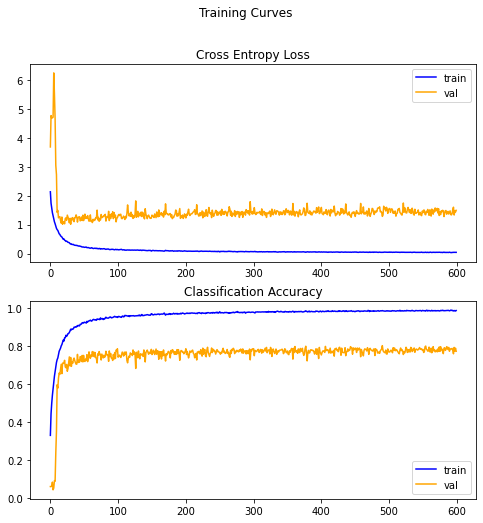


Test set evaluation metrics
30/30 [==============================] - 1s 22ms/step - loss: 1.5062 - accuracy: 0.7681
loss: 1.51
accuracy: 0.77


In [0]:
loss20_final, acc20_final = opt_train_report_final(20, 256, x_train_all, y_train_all, 600)

Train for 64 steps, validate for 5 steps
Epoch 1/600
63/64 [============================>.] - ETA: 0s - loss: 3.1446 - accuracy: 0.1609
Epoch 00001: val_accuracy improved from -inf to 0.02422, saving model to best_weights40.hdf5
64/64 [==============================] - 8s 123ms/step - loss: 3.1391 - accuracy: 0.1620 - val_loss: 3.9918 - val_accuracy: 0.0242
Epoch 2/600
63/64 [============================>.] - ETA: 0s - loss: 2.6749 - accuracy: 0.2509
Epoch 00002: val_accuracy improved from 0.02422 to 0.03125, saving model to best_weights40.hdf5
64/64 [==============================] - 5s 76ms/step - loss: 2.6728 - accuracy: 0.2512 - val_loss: 4.6830 - val_accuracy: 0.0312
Epoch 3/600
63/64 [============================>.] - ETA: 0s - loss: 2.4591 - accuracy: 0.2979
Epoch 00003: val_accuracy did not improve from 0.03125
64/64 [==============================] - 5s 73ms/step - loss: 2.4586 - accuracy: 0.2985 - val_loss: 5.8052 - val_accuracy: 0.0305
Epoch 4/600
63/64 [====================

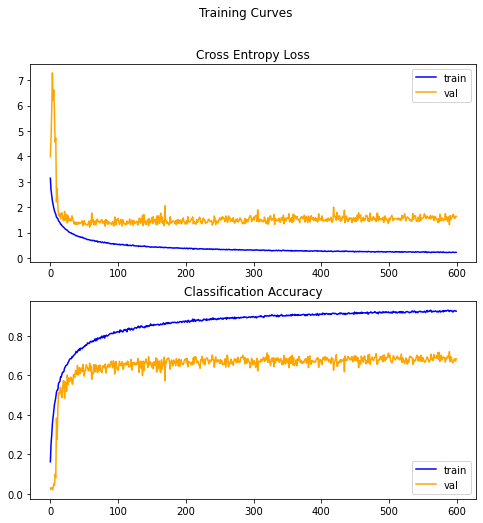


Test set evaluation metrics
30/30 [==============================] - 1s 23ms/step - loss: 1.4746 - accuracy: 0.7094
loss: 1.47
accuracy: 0.71


In [0]:
loss40_final, acc40_final = opt_train_report_final(40, 256, x_train_all, y_train_all, 600)

Train for 64 steps, validate for 5 steps
Epoch 1/400
63/64 [============================>.] - ETA: 0s - loss: 3.7848 - accuracy: 0.0821
Epoch 00001: val_accuracy improved from -inf to 0.02109, saving model to best_weights60.hdf5
64/64 [==============================] - 6s 99ms/step - loss: 3.7809 - accuracy: 0.0825 - val_loss: 4.1306 - val_accuracy: 0.0211
Epoch 2/400
63/64 [============================>.] - ETA: 0s - loss: 3.3615 - accuracy: 0.1558
Epoch 00002: val_accuracy did not improve from 0.02109
64/64 [==============================] - 5s 75ms/step - loss: 3.3597 - accuracy: 0.1564 - val_loss: 4.7696 - val_accuracy: 0.0133
Epoch 3/400
63/64 [============================>.] - ETA: 0s - loss: 3.1543 - accuracy: 0.1978
Epoch 00003: val_accuracy did not improve from 0.02109
64/64 [==============================] - 5s 75ms/step - loss: 3.1529 - accuracy: 0.1975 - val_loss: 6.3498 - val_accuracy: 0.0094
Epoch 4/400
63/64 [============================>.] - ETA: 0s - loss: 2.9498 - acc

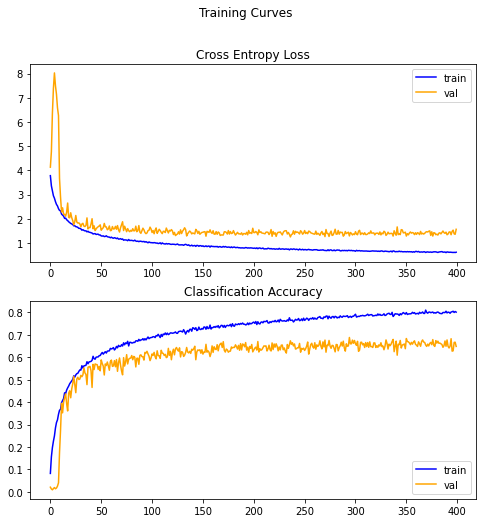


Test set evaluation metrics
30/30 [==============================] - 1s 24ms/step - loss: 1.3328 - accuracy: 0.6673
loss: 1.33
accuracy: 0.67


In [0]:
loss60_final, acc60_final = opt_train_report_final(60, 256, x_train_all, y_train_all, 400)

Train for 64 steps, validate for 5 steps
Epoch 1/400
63/64 [============================>.] - ETA: 0s - loss: 4.1292 - accuracy: 0.0644
Epoch 00001: val_accuracy improved from -inf to 0.00859, saving model to best_weights80.hdf5
64/64 [==============================] - 6s 100ms/step - loss: 4.1240 - accuracy: 0.0655 - val_loss: 4.4106 - val_accuracy: 0.0086
Epoch 2/400
63/64 [============================>.] - ETA: 0s - loss: 3.7218 - accuracy: 0.1155
Epoch 00002: val_accuracy did not improve from 0.00859
64/64 [==============================] - 5s 74ms/step - loss: 3.7188 - accuracy: 0.1158 - val_loss: 4.7303 - val_accuracy: 0.0039
Epoch 3/400
63/64 [============================>.] - ETA: 0s - loss: 3.4880 - accuracy: 0.1486
Epoch 00003: val_accuracy did not improve from 0.00859
64/64 [==============================] - 5s 75ms/step - loss: 3.4873 - accuracy: 0.1497 - val_loss: 5.9356 - val_accuracy: 0.0086
Epoch 4/400
63/64 [============================>.] - ETA: 0s - loss: 3.3245 - ac

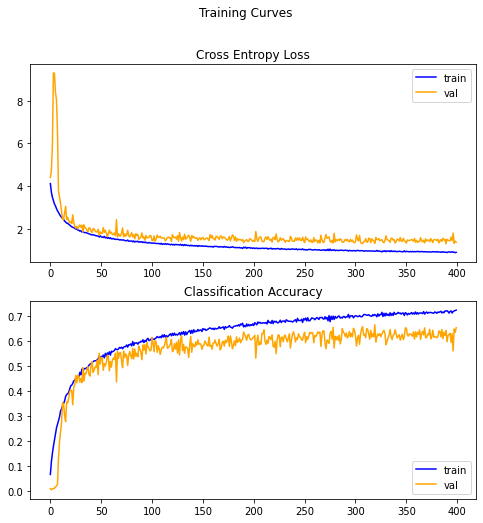


Test set evaluation metrics
30/30 [==============================] - 1s 25ms/step - loss: 1.3517 - accuracy: 0.6368
loss: 1.35
accuracy: 0.64


In [0]:
loss80_final, acc80_final = opt_train_report_final(80, 256, x_train_all, y_train_all, 400)

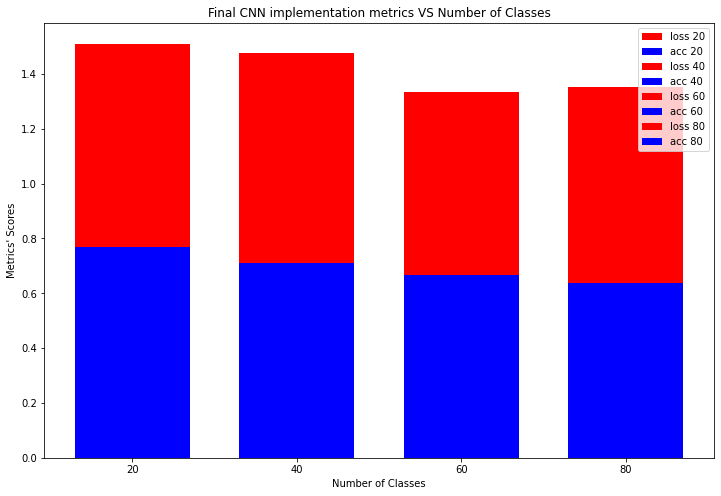

In [0]:
plt.figure(figsize=(12, 8))

plt.bar('20', loss20_final, width=0.7, color='red', label='loss 20')
plt.bar('20', acc20_final, width=0.7, color='blue', label='acc 20')

plt.bar('40', loss40_final, width=0.7, color='red', label='loss 40')
plt.bar('40', acc40_final, width=0.7, color='blue', label='acc 40')

plt.bar('60', loss60_final, width=0.7, color='red', label='loss 60')
plt.bar('60', acc60_final, width=0.7, color='blue', label='acc 60')

plt.bar('80', loss80_final, width=0.7, color='red', label='loss 80')
plt.bar('80', acc80_final, width=0.7, color='blue', label='acc 80')

plt.legend(loc='upper right')

plt.xlabel("Number of Classes")
plt.ylabel("Metrics' Scores")

plt.title("Final CNN implementation metrics VS Number of Classes")

plt.show()

Όπως ήταν αναμενόμενο παρατηρούμε ότι για το πρόβλημα ταξινόμησησης των εικόνων, μικρότερος αριθμός κλάσεων σημαίνει καλύτερη επίδοση του δικτύου. Παραθέτουμε και γράφημα για σύγκριση με το αρχικό απλό μοντέλο.


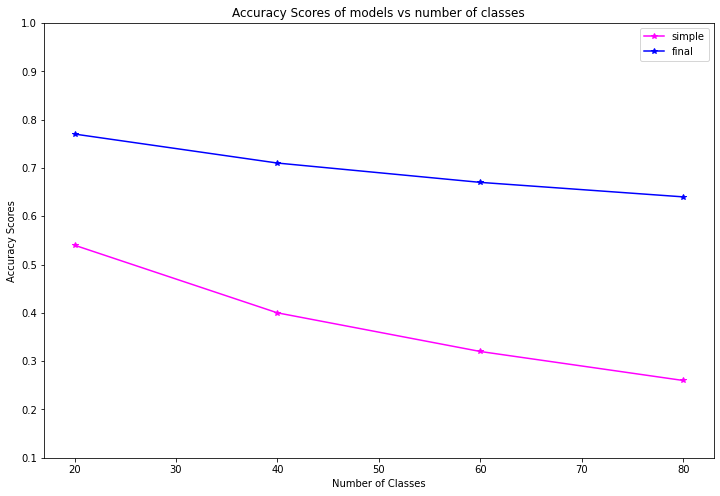

In [0]:
# acc20_simple, acc40_simple, acc60_simple, acc80_simple = 0.54, 0.4, 0.32, 0.26
# acc20_final, acc40_final, acc60_final, acc80_final = 0.77, 0.71, 0.67, 0.64

plt.figure(figsize=(12, 8))
plt.plot([20, 40, 60, 80], [acc20_simple, acc40_simple, acc60_simple, acc80_simple], color='magenta', marker='*', label='simple')
plt.plot([20, 40, 60, 80], [acc20_final, acc40_final, acc60_final, acc80_final], color='blue', marker='*', label='final')
plt.yticks([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

plt.legend(loc='upper right')
plt.xlabel('Number of Classes')
plt.ylabel('Accuracy Scores')
plt.title('Accuracy Scores of models vs number of classes')
plt.show()

#**Extra Υλικό**

Παρουσιάζουμε παρακάτω μια μέθοδο απεικόνισης της απόκρισης του πρώτου συνελικτικού σταδιίου του δικτύου μας εισάγοντας σε αυτό μια εικόνα ενός σαλιγκαριού

In [0]:
# Δημιουργιούμε ένα μοντέλο που βασίζεται στο 
# δίκτυο μας με τα καλύτερα βάρη για 20 κλάσεις
# Το κόβουμε στο πρώτο συνελικτικό στάδιο το οποίο
# θα λειτουργεί ως στάιο εξόδου
model = init_opt_model_final(20)
model.load_weights('./best_weights20.hdf5')

model = tf.keras.Model(inputs = model.inputs, outputs = model.layers[2].output)
model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20_input (InputLayer) [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 32, 32, 32)        896       
_________________________________________________________________
up_sampling2d_4 (UpSampling2 (None, 64, 64, 32)        0         
_________________________________________________________________
average_pooling2d_20 (Averag (None, 31, 31, 32)        0         
Total params: 896
Trainable params: 896
Non-trainable params: 0
_________________________________________________________________


In [0]:
# Εισάγουμε με τη βοήθεια της βιβλιοθήκης
# preprocessing του Keras την εικόνα
# και της μειώνουμε την ανάλυση από 256x256
# σε 32x32 όπου είναι η ανάλυση εικόνας που απαιτεί
# το δίκτυό μας για είσοδο
img = tf.keras.preprocessing.image.load_img('./2.png')
imgarr = tf.keras.preprocessing.image.img_to_array(img)
imgarr = tf.image.resize(imgarr, (32, 32), 'bilinear')
imgarr = np.array([imgarr])

feature_map = model.predict(imgarr)

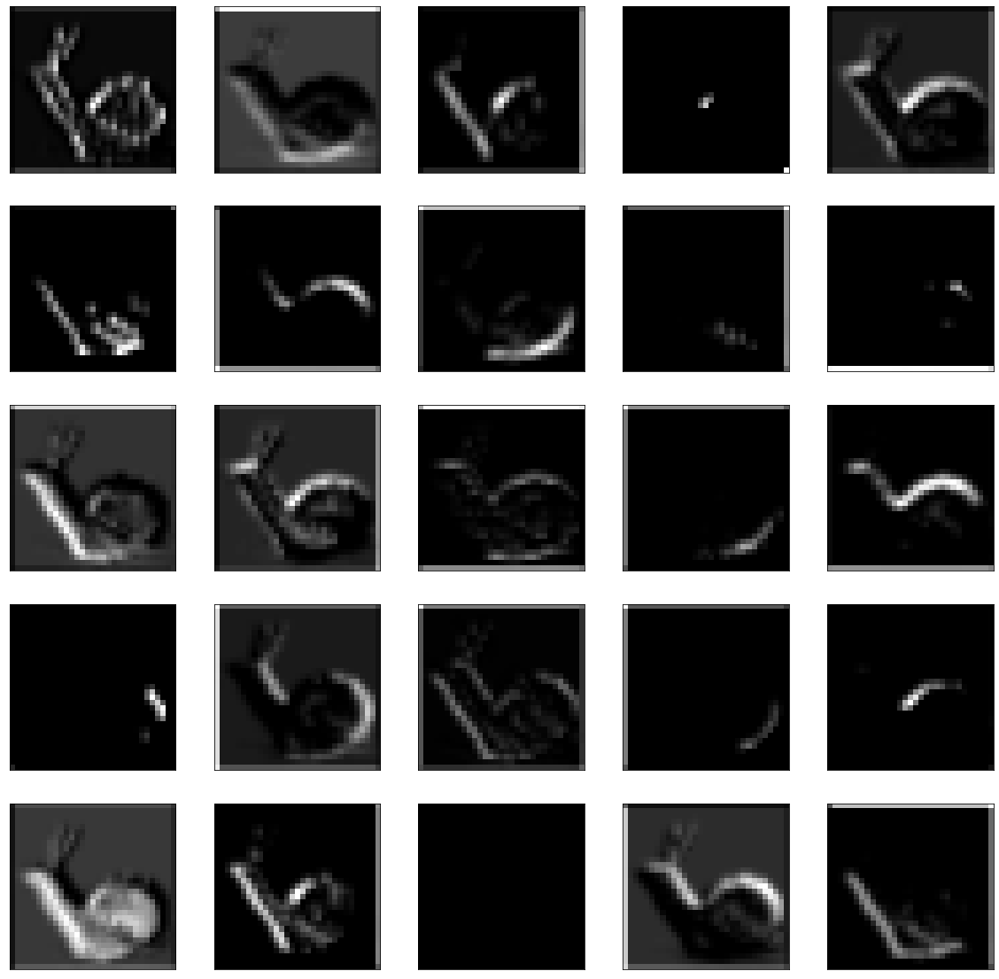

In [0]:
plt.figure(figsize=(20, 20))
square = 5
ix = 1
for _ in range(square):
	for _ in range(square):
		# Παρουσιάζουμε σε subplot τα κανάλια
		ax = plt.subplot(square, square, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# Τα εκτυπώνουμε σε grayscale
		plt.imshow(feature_map[0, :, :, ix-1], cmap='gray')
		ix += 1
		
plt.show()